# Step 3: Modeling


**Owner**: Sonal Kiran Hansra<br>**Last Update**: Sep 05, 2023

<a id="0"></a> <br>
### Table of Contents  
1. [Introduction](#1)


2. [Modelling](#2)

    a. [XGBoost](#2.1)
    
    b. [ARIMA](#2.2)
    
    c. [SARIMA](#2.3)
    
    
3. [Results & Conclusions](#3)


4. [Next Steps](#4)

In [1]:
# from platform import python_version
# print(python_version())
import warnings
warnings.filterwarnings("ignore")

<a id="1"></a> 
## Introduction

**In step 2 of this project we looked at data from 3 different sources (Capital Bikeshare, NOAA - weather, DCHR - holiday), conducted an in-depth EDA, performed feature engineering, and prepared our data for modeling.**

**<span style='color: DarkRed'>In this final step of our project, we will build three different forecasting models and compare their performance for our particular use case of bike rentals demand forecasting.</span>**

<a id="2"></a> 
## Modelling

I will be looking into 3 different methods of forecasting-

1. A tree based ensemble model - **XGBoost**

2. An autoregressive statistical model - **SARIMA**

3. A neural network based model - **RNN**

**<span style='color: DarkRed'>Let's begin by loading our data and describing it-</span>**

In [2]:
# importing libraries

import numpy as np
import pandas as pd
from xgboost import XGBRegressor
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform
import joblib
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import MSTL
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error, mean_squared_log_error
from statsmodels.stats.proportion import proportions_ztest
from statsmodels.tsa.statespace.sarimax import SARIMAX

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objs as go

In [5]:
pd.options.display.max_rows = 999
pd.options.display.max_columns = 999

In [3]:
# loading our final combined dataset containing bike share, weather and holidays data 

my_data = pd.read_csv('/Users/sonalkiranhansra/Desktop/BrainStation_Sonal/Classes/Capstone/data/cleaned_data/combined_data.csv',
                     index_col=0)
display(my_data.head())

,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy
2012-01-01,2260.0,8.72,0.00,0.0,38.0,1.0,0.0,1.0,0.0,0.0,0.0,1,1,0,0
2012-01-02,1937.0,13.87,0.02,0.0,34.5,0.0,1.0,1.0,0.0,0.0,0.0,0,0,0,0
2012-01-03,2219.0,15.66,0.00,0.0,28.5,0.0,0.0,1.0,0.0,0.0,0.0,0,0,1,0
2012-01-04,2357.0,7.61,0.00,0.0,18.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0,0
2012-01-05,3251.0,4.92,0.00,0.0,32.5,0.0,0.0,1.0,0.0,0.0,0.0,1,0,0,0


In [5]:
# let's look our column data types

my_data.info()

# let's also check if our index is the right data type

print(f'\n\nThe data type of our index is {my_data.index.dtype.__str__()}. It should be `datetime`.')

<class 'pandas.core.frame.DataFrame'>
Index: 4199 entries, 2012-01-01 to 2023-06-30
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   total_demand    4199 non-null   float64
 1   avg_wind_speed  4199 non-null   float64
 2   prcp            4199 non-null   float64
 3   snowfall        4199 non-null   float64
 4   temp_obs        4199 non-null   float64
 5   weekend         4199 non-null   float64
 6   holiday         4199 non-null   float64
 7   qt_1            4199 non-null   float64
 8   qt_2            4199 non-null   float64
 9   qt_3            4199 non-null   float64
 10  qt_4            4199 non-null   float64
 11  foggy           4199 non-null   int64  
 12  rainy           4199 non-null   int64  
 13  snowy           4199 non-null   int64  
 14  windy           4199 non-null   int64  
dtypes: float64(11), int64(4)
memory usage: 524.9+ KB


The data type of our index is object. It should be `datetime`.

In [4]:
# let's convert the index datatype

my_data.index = pd.to_datetime(my_data.index)
my_data.index

DatetimeIndex(['2012-01-01', '2012-01-02', '2012-01-03', '2012-01-04',
               '2012-01-05', '2012-01-06', '2012-01-07', '2012-01-08',
               '2012-01-09', '2012-01-10',
               ...
               '2023-06-21', '2023-06-22', '2023-06-23', '2023-06-24',
               '2023-06-25', '2023-06-26', '2023-06-27', '2023-06-28',
               '2023-06-29', '2023-06-30'],
              dtype='datetime64[ns]', length=4199, freq=None)

**<span style='color: DarkRed'>Our data looks good. Let's plot total demand against time-</span>**

In [7]:
# creating a dynamic plot

fig = px.line(my_data, x=my_data.index.values , y=my_data.total_demand)

# axis labels and title

fig.update_layout(
    yaxis_title="Daily Total Demand", 
    xaxis_title="Date Range",
    legend_title="", 
    title="Daily Total Demand From Jan 2012 to Jun 2023"
)

# activate slider

fig.update_xaxes(rangeslider_visible=True)
fig.show()

**<span style='color: DarkRed'>By looking at the plot above we can clearly see the impact of COVID on bike demands. Let's figure out how we can best handle this anomaly.</span>**

**There can be several ways of handling the data for COVID years -**

1. Using the data as it is

2. Forecasting the demand and updating the values

3. Using past data - especially given that the demand seems to have picked up to pre-COVID levels

4. Add a column that highlights the impact of a pandemic - this can be a simple column with binary values

5. Ignore the data from COVID years


**Reccall that one of main objectives, apart from being able to forcast the bike rental demand accurately, is to compare three different models. So the approach we pick has to sit well with all three.**

Option 1 will not work for us since one of the models we intent to implement is SARIMA, and a limitation of ARIMA models is the incapability of capturing non-linear patterns hidden within a time series.

Option 4 may work for our tree-based ensemble model and RNN based model, but again will not work with SARIMA.

Option 2 will require that we first forecast the covid years data for each model inividually and then conduct our analysis. This is very time intensive, and given the capstone deadlines it is not possible to pursue this approach at the moment. 

The only viable approaches are option 3 and 5. Since COVID impacted almost 2 years, which is a considerable amount of time given the span of our data, using past data will bias our models considerably and we don't want that.

**So the only approach we are left with is appraoch 5 - ignore the data from COVID years.**

**<span style='color: DarkRed'>For the sake of simplicity, we'll go ahead and split the data such that pre-COVID (before 2020) makes up our train data and post-COVID (2022 onwards) makes up our test data.</span>**


In [8]:
# splitting the data into train and test sets

train_data = my_data[my_data.index.year<2020]
print(f'Train data shape: {train_data.shape}')
display(train_data.tail())

test_data = my_data[my_data.index.year>2021]
print(f'Test data shape: {test_data.shape}')
display(test_data.head())

Train data shape: (2922, 15)


,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy
2019-12-27,4916.0,4.03,0.000000,0.0,43.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0,0,0
2019-12-28,6282.0,3.80,0.000000,0.0,37.5,1.0,0.0,0.0,0.0,0.0,1.0,1,0,0,0
2019-12-29,1409.0,5.14,0.200000,0.0,46.0,1.0,0.0,0.0,0.0,0.0,1.0,1,0,0,0
2019-12-30,5419.0,7.61,0.533333,0.0,59.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0,0,0
2019-12-31,5746.0,8.50,0.110000,0.0,42.5,0.0,0.0,0.0,0.0,0.0,1.0,1,0,0,0


Test data shape: (546, 15)


,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy
2022-01-01,3452.0,4.70,0.295,0.0,58.0,1.0,0.0,1.0,0.0,0.0,0.0,1,0,0,0
2022-01-02,5419.0,9.62,0.285,0.0,58.0,1.0,0.0,1.0,0.0,0.0,0.0,1,0,0,0
2022-01-03,497.0,14.54,0.745,6.9,33.0,0.0,0.0,1.0,0.0,0.0,0.0,1,0,1,0
2022-01-04,1257.0,5.82,0.165,3.7,27.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0,0
2022-01-05,2265.0,8.95,0.000,0.0,32.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0,0


**Here onwards, we'll primarily be working with the train data, and we'll use the test set only when evaluating model performance on unseen data**

<a id="2.1"></a> 
### XGBoost

**XGBoost stands for eXtreme Gradient Boosting. It is a tree-based ensemble method that has witnessed a lot of success in recent years. XGBoost uses advanced regularization compared to gradient boosting and trains faster as well.**

Let's go ahead and use this method to forecast bike rental demand. But before we do that, we'll have to engineer a few new features. `total_demand` is our target variable that contains the actual demand values for each day. We will not be using `total_demand` to train our model. However, the remaining features do not contain enough information to help make a good prediction. So how might we change this? By introducing lag variables based on `total_demand`. Let's look at autocorrelation and partial-autocorrelation to find which lag values work best.

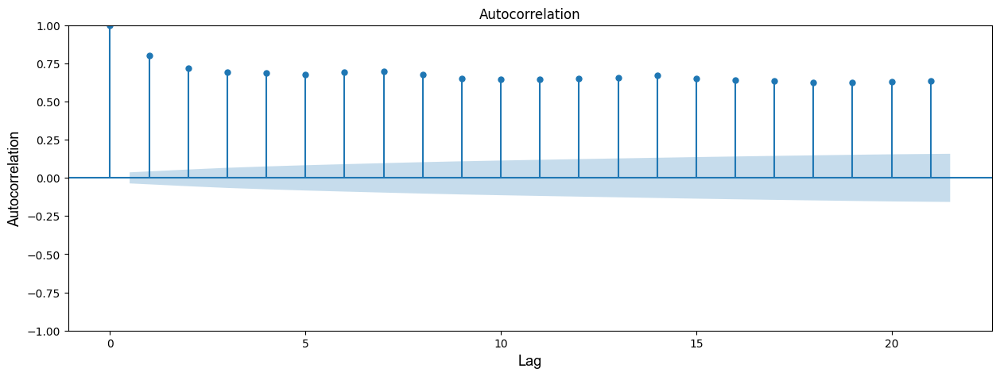

In [9]:
# plotting auto-correlation 

plt.figure(figsize=(15, 5))

# put the acf plot on the current axis
plot_acf(train_data.total_demand, lags=21, ax=plt.gca())
plt.xlabel('Lag', fontdict=dict(family="Arial", size=13, color='black'))
plt.ylabel('Autocorrelation', fontdict=dict(family="Arial", size=13, color='black'))
plt.show()

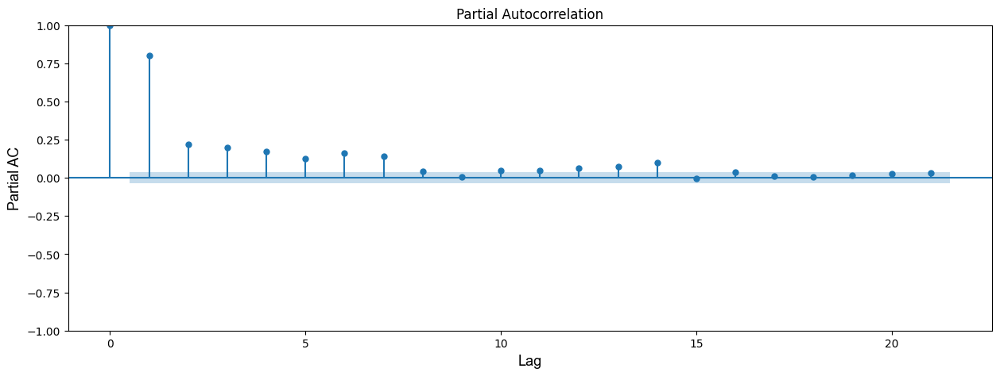

In [10]:
# plotting partial auto-correlation 

plt.figure(figsize=(15, 5))
plot_pacf(train_data.total_demand, lags=21, ax=plt.gca(), method='ywm')
plt.xlabel('Lag', fontdict=dict(family="Arial", size=13, color='black'))
plt.ylabel('Partial AC', fontdict=dict(family="Arial", size=13, color='black'))
plt.show()

**Let's conduct some statistical tests to check stationarity!**

In [11]:
# augmented Dickey-Fuller unit root test
# Null Hypothesis: The series has a unit root (non-stationary) 
# Alternate Hypothesis: The series has no unit root

adftest = adfuller(train_data.total_demand)
print(adftest)

# KPSS test
# Null Hypothesis: The process is trend stationary
# Alternate Hypothesis: The series has a unit root (series is not stationary)

kpsstest = kpss(train_data.total_demand)
print('\nkpsstest')

(-3.4370689292803487, 0.009758264072852029, 22, 2899, {'1%': -3.4326077094598446, '5%': -2.862537504404245, '10%': -2.5673009999844125}, 51979.58146791184)

kpsstest


/var/folders/46/5zssjgcd2yd7xl8tqv1nqm5w0000gn/T/ipykernel_79409/1186765179.py:12: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




**<span style='color: DarkRed'>`KPSS` indicates non-stationarity and `ADF` indicates stationarity. The implies that the series is difference stationary. Additionally, the `Auto Correlation Function (ACF)` plot is tailing off very gradually, which also implies that our data is not stationary. This correlates well with our analysis in step 2, where we saw that our data has both trend and seasonality. Let's go ahead and difference our data and check if it becomes stationary by plotting `ACF` and `PACF`, and also performing the above statistical tests.</span>**

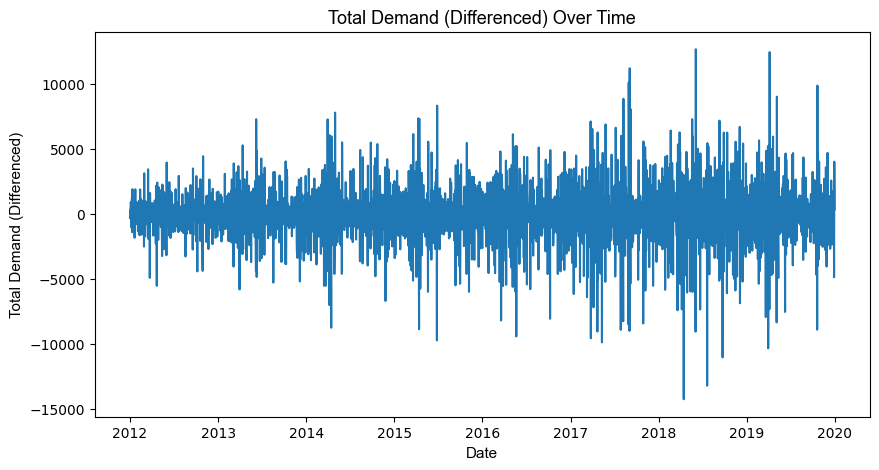

In [12]:
# taking diff (y[t] - y[t-1])

train_data_diff = train_data.diff().dropna()

# plotting 

plt.figure(figsize=(10,5))
plt.plot(train_data_diff.index.values, train_data_diff.total_demand)
plt.xlabel('Date', fontdict=dict(family="Arial", size=11, color='black'))
plt.ylabel('Total Demand (Differenced)', fontdict=dict(family="Arial", size=11, color='black'))
plt.title('Total Demand (Differenced) Over Time', fontdict=dict(family="Arial", size=13, color='black'))
plt.show()

In [13]:
# augmented Dickey-Fuller unit root test
# Null Hypothesis: The series has a unit root (non-stationary) 
# Alternate Hypothesis: The series has no unit root

adftest = adfuller(train_data_diff.total_demand)
print(adftest)

# KPSS test
# Null Hypothesis: The process is trend stationary
# Alternate Hypothesis: The series has a unit root (series is not stationary)

kpsstest = kpss(train_data_diff.total_demand)
print('\nkpsstest')

(-15.23717837225493, 5.223002754619526e-28, 21, 2899, {'1%': -3.4326077094598446, '5%': -2.862537504404245, '10%': -2.5673009999844125}, 51972.09071512172)

kpsstest


/var/folders/46/5zssjgcd2yd7xl8tqv1nqm5w0000gn/T/ipykernel_79409/613687706.py:12: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




**The negative test statistic value and almost 0 p-statistic in the `Dickey-Fuller` test help us reject the null hypothesis that our data is non-stationary. At the same time high p-value in the `KPSS` test support the null hypothesis that the data is stationary.**

**<span style='color: DarkRed'>Now let's plot the ACF and PACF again and find optimial lags to consider for our model.</span>**

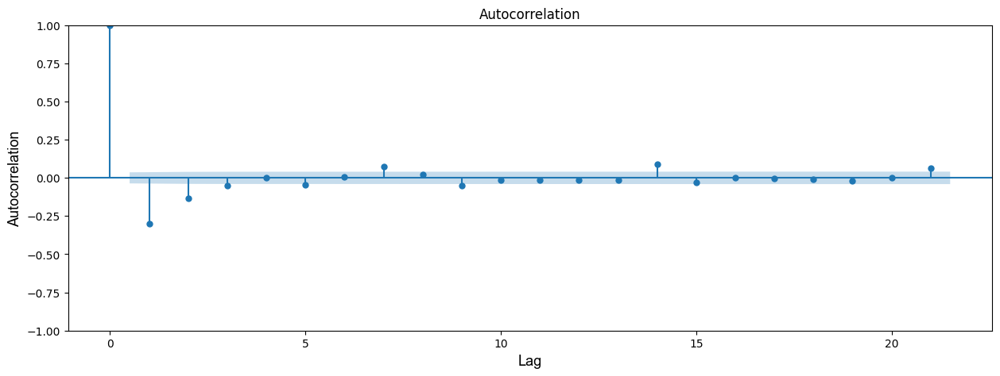

In [14]:
# plotting auto-correlation 

plt.figure(figsize=(15, 5))

# put the acf plot on the current axis
plot_acf(train_data_diff.total_demand, lags=21, ax=plt.gca())
plt.xlabel('Lag', fontdict=dict(family="Arial", size=13, color='black'))
plt.ylabel('Autocorrelation', fontdict=dict(family="Arial", size=13, color='black'))
plt.show()

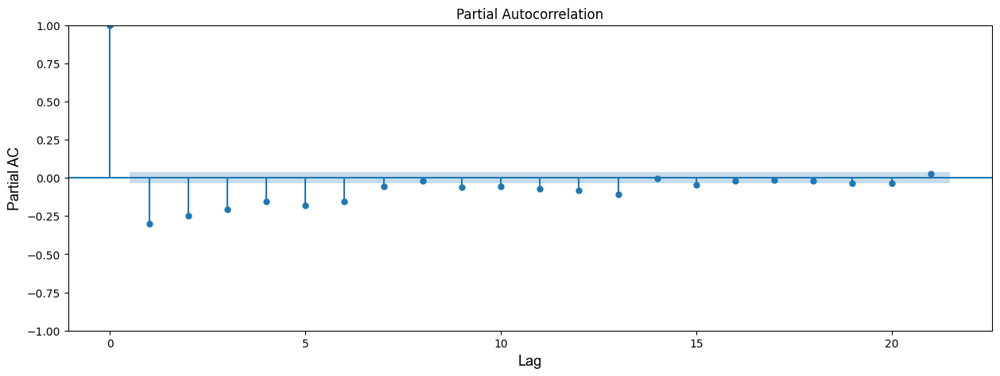

In [15]:
# plotting partial auto-correlation 

plt.figure(figsize=(15, 5))
plot_pacf(train_data_diff.total_demand, lags=21, ax=plt.gca(), method='ywm')
plt.xlabel('Lag', fontdict=dict(family="Arial", size=13, color='black'))
plt.ylabel('Partial AC', fontdict=dict(family="Arial", size=13, color='black'))
plt.show()

**<span style='color: DarkRed'>From The Partial Auto Correlation Function (PACF) plot above we can clearly see that a lag of up to 7 days show significant correlation. Let's go ahead and create features for all of these lags.</span>**

In [16]:
# creating new features 

train_data['total_demand_lag_1'] = train_data.total_demand.shift(periods=1, fill_value=0)
train_data['total_demand_lag_2'] = train_data.total_demand.shift(periods=2, fill_value=0)
train_data['total_demand_lag_3'] = train_data.total_demand.shift(periods=3, fill_value=0)
train_data['total_demand_lag_4'] = train_data.total_demand.shift(periods=4, fill_value=0)
train_data['total_demand_lag_5'] = train_data.total_demand.shift(periods=5, fill_value=0)
train_data['total_demand_lag_6'] = train_data.total_demand.shift(periods=6, fill_value=0)
train_data['total_demand_lag_7'] = train_data.total_demand.shift(periods=7, fill_value=0)

# verifying

display(train_data.head())
display(train_data.tail())

,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy,total_demand_lag_1,total_demand_lag_2,total_demand_lag_3,total_demand_lag_4,total_demand_lag_5,total_demand_lag_6,total_demand_lag_7
2012-01-01,2260.0,8.72,0.00,0.0,38.0,1.0,0.0,1.0,0.0,0.0,0.0,1,1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-02,1937.0,13.87,0.02,0.0,34.5,0.0,1.0,1.0,0.0,0.0,0.0,0,0,0,0,2260.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-03,2219.0,15.66,0.00,0.0,28.5,0.0,0.0,1.0,0.0,0.0,0.0,0,0,1,0,1937.0,2260.0,0.0,0.0,0.0,0.0,0.0
2012-01-04,2357.0,7.61,0.00,0.0,18.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0,0,2219.0,1937.0,2260.0,0.0,0.0,0.0,0.0
2012-01-05,3251.0,4.92,0.00,0.0,32.5,0.0,0.0,1.0,0.0,0.0,0.0,1,0,0,0,2357.0,2219.0,1937.0,2260.0,0.0,0.0,0.0


,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy,total_demand_lag_1,total_demand_lag_2,total_demand_lag_3,total_demand_lag_4,total_demand_lag_5,total_demand_lag_6,total_demand_lag_7
2019-12-27,4916.0,4.03,0.000000,0.0,43.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0,0,0,3773.0,2005.0,2937.0,4526.0,3245.0,3331.0,5693.0
2019-12-28,6282.0,3.80,0.000000,0.0,37.5,1.0,0.0,0.0,0.0,0.0,1.0,1,0,0,0,4916.0,3773.0,2005.0,2937.0,4526.0,3245.0,3331.0
2019-12-29,1409.0,5.14,0.200000,0.0,46.0,1.0,0.0,0.0,0.0,0.0,1.0,1,0,0,0,6282.0,4916.0,3773.0,2005.0,2937.0,4526.0,3245.0
2019-12-30,5419.0,7.61,0.533333,0.0,59.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0,0,0,1409.0,6282.0,4916.0,3773.0,2005.0,2937.0,4526.0
2019-12-31,5746.0,8.50,0.110000,0.0,42.5,0.0,0.0,0.0,0.0,0.0,1.0,1,0,0,0,5419.0,1409.0,6282.0,4916.0,3773.0,2005.0,2937.0


**<span style='color: DarkRed'>Now let's split our `train_data` further into target variable and features to be used for training.</span>**

In [17]:
# splitting into target variable and training features

X_train = train_data.drop(columns='total_demand')
y_train = train_data.total_demand

# verify

display(X_train.head())

,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy,total_demand_lag_1,total_demand_lag_2,total_demand_lag_3,total_demand_lag_4,total_demand_lag_5,total_demand_lag_6,total_demand_lag_7
2012-01-01,8.72,0.00,0.0,38.0,1.0,0.0,1.0,0.0,0.0,0.0,1,1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-02,13.87,0.02,0.0,34.5,0.0,1.0,1.0,0.0,0.0,0.0,0,0,0,0,2260.0,0.0,0.0,0.0,0.0,0.0,0.0
2012-01-03,15.66,0.00,0.0,28.5,0.0,0.0,1.0,0.0,0.0,0.0,0,0,1,0,1937.0,2260.0,0.0,0.0,0.0,0.0,0.0
2012-01-04,7.61,0.00,0.0,18.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0,0,2219.0,1937.0,2260.0,0.0,0.0,0.0,0.0
2012-01-05,4.92,0.00,0.0,32.5,0.0,0.0,1.0,0.0,0.0,0.0,1,0,0,0,2357.0,2219.0,1937.0,2260.0,0.0,0.0,0.0


**<span style='color: DarkRed'>Great! Now let's go ahead and build the XGBoost model.</span>**

In [18]:
# instantiating model

xgb_model = XGBRegressor(random_state=111)

# creating timeseries split

t_split = TimeSeriesSplit(n_splits=10)

# setting up random search grid params

random_search_params = {
    'n_estimators': randint(300,1000),
    'max_depth': randint(1,6),
    'learning_rate': uniform(0,1),
    'colsample_bytree': uniform(0, 1),
    'reg_alpha': uniform(0.2, 0.5)
}

# setting up randomized grid search

xgb_rs = RandomizedSearchCV(xgb_model, 
                        param_distributions=random_search_params, 
                        scoring='neg_mean_absolute_percentage_error', 
                        cv=t_split,
                        n_iter = 20,
                        verbose=10,
                        random_state=10,
                        return_train_score=True)

# fitting to data

xgb_rs = xgb_rs.fit(X_train, y_train)

Fitting 10 folds for each of 20 candidates, totalling 200 fits
[CV 1/10; 1/20] START colsample_bytree=0.771320643266746, learning_rate=0.0207519493594015, max_depth=1, n_estimators=669, reg_alpha=0.574401941269306
[CV 1/10; 1/20] END colsample_bytree=0.771320643266746, learning_rate=0.0207519493594015, max_depth=1, n_estimators=669, reg_alpha=0.574401941269306; total time=   0.2s
[CV 2/10; 1/20] START colsample_bytree=0.771320643266746, learning_rate=0.0207519493594015, max_depth=1, n_estimators=669, reg_alpha=0.574401941269306
[CV 2/10; 1/20] END colsample_bytree=0.771320643266746, learning_rate=0.0207519493594015, max_depth=1, n_estimators=669, reg_alpha=0.574401941269306; total time=   0.3s
[CV 3/10; 1/20] START colsample_bytree=0.771320643266746, learning_rate=0.0207519493594015, max_depth=1, n_estimators=669, reg_alpha=0.574401941269306
[CV 3/10; 1/20] END colsample_bytree=0.771320643266746, learning_rate=0.0207519493594015, max_depth=1, n_estimators=669, reg_alpha=0.5744019412693

[CV 6/10; 3/20] END colsample_bytree=0.26360284602895234, learning_rate=0.15037786726176594, max_depth=4, n_estimators=828, reg_alpha=0.6083009176103333; total time=   0.9s
[CV 7/10; 3/20] START colsample_bytree=0.26360284602895234, learning_rate=0.15037786726176594, max_depth=4, n_estimators=828, reg_alpha=0.6083009176103333
[CV 7/10; 3/20] END colsample_bytree=0.26360284602895234, learning_rate=0.15037786726176594, max_depth=4, n_estimators=828, reg_alpha=0.6083009176103333; total time=   1.4s
[CV 8/10; 3/20] START colsample_bytree=0.26360284602895234, learning_rate=0.15037786726176594, max_depth=4, n_estimators=828, reg_alpha=0.6083009176103333
[CV 8/10; 3/20] END colsample_bytree=0.26360284602895234, learning_rate=0.15037786726176594, max_depth=4, n_estimators=828, reg_alpha=0.6083009176103333; total time=   1.5s
[CV 9/10; 3/20] START colsample_bytree=0.26360284602895234, learning_rate=0.15037786726176594, max_depth=4, n_estimators=828, reg_alpha=0.6083009176103333
[CV 9/10; 3/20] 

[CV 2/10; 6/20] END colsample_bytree=0.5839013656536759, learning_rate=0.18263143630201495, max_depth=2, n_estimators=952, reg_alpha=0.25270091674390055; total time=   0.4s
[CV 3/10; 6/20] START colsample_bytree=0.5839013656536759, learning_rate=0.18263143630201495, max_depth=2, n_estimators=952, reg_alpha=0.25270091674390055
[CV 3/10; 6/20] END colsample_bytree=0.5839013656536759, learning_rate=0.18263143630201495, max_depth=2, n_estimators=952, reg_alpha=0.25270091674390055; total time=   0.4s
[CV 4/10; 6/20] START colsample_bytree=0.5839013656536759, learning_rate=0.18263143630201495, max_depth=2, n_estimators=952, reg_alpha=0.25270091674390055
[CV 4/10; 6/20] END colsample_bytree=0.5839013656536759, learning_rate=0.18263143630201495, max_depth=2, n_estimators=952, reg_alpha=0.25270091674390055; total time=   0.4s
[CV 5/10; 6/20] START colsample_bytree=0.5839013656536759, learning_rate=0.18263143630201495, max_depth=2, n_estimators=952, reg_alpha=0.25270091674390055
[CV 5/10; 6/20] 

[CV 8/10; 8/20] END colsample_bytree=0.3192360889885453, learning_rate=0.09045934927090737, max_depth=1, n_estimators=930, reg_alpha=0.2569921809317749; total time=   0.3s
[CV 9/10; 8/20] START colsample_bytree=0.3192360889885453, learning_rate=0.09045934927090737, max_depth=1, n_estimators=930, reg_alpha=0.2569921809317749
[CV 9/10; 8/20] END colsample_bytree=0.3192360889885453, learning_rate=0.09045934927090737, max_depth=1, n_estimators=930, reg_alpha=0.2569921809317749; total time=   0.4s
[CV 10/10; 8/20] START colsample_bytree=0.3192360889885453, learning_rate=0.09045934927090737, max_depth=1, n_estimators=930, reg_alpha=0.2569921809317749
[CV 10/10; 8/20] END colsample_bytree=0.3192360889885453, learning_rate=0.09045934927090737, max_depth=1, n_estimators=930, reg_alpha=0.2569921809317749; total time=   0.4s
[CV 1/10; 9/20] START colsample_bytree=0.8286813263076767, learning_rate=0.04689631938924976, max_depth=4, n_estimators=768, reg_alpha=0.6096434978350344
[CV 1/10; 9/20] END 

[CV 4/10; 11/20] END colsample_bytree=0.9830208668523404, learning_rate=0.4674032789842478, max_depth=3, n_estimators=962, reg_alpha=0.27557600982128194; total time=   0.6s
[CV 5/10; 11/20] START colsample_bytree=0.9830208668523404, learning_rate=0.4674032789842478, max_depth=3, n_estimators=962, reg_alpha=0.27557600982128194
[CV 5/10; 11/20] END colsample_bytree=0.9830208668523404, learning_rate=0.4674032789842478, max_depth=3, n_estimators=962, reg_alpha=0.27557600982128194; total time=   0.7s
[CV 6/10; 11/20] START colsample_bytree=0.9830208668523404, learning_rate=0.4674032789842478, max_depth=3, n_estimators=962, reg_alpha=0.27557600982128194
[CV 6/10; 11/20] END colsample_bytree=0.9830208668523404, learning_rate=0.4674032789842478, max_depth=3, n_estimators=962, reg_alpha=0.27557600982128194; total time=   0.8s
[CV 7/10; 11/20] START colsample_bytree=0.9830208668523404, learning_rate=0.4674032789842478, max_depth=3, n_estimators=962, reg_alpha=0.27557600982128194
[CV 7/10; 11/20]

[CV 10/10; 13/20] END colsample_bytree=0.25137413420705934, learning_rate=0.5973716482308843, max_depth=2, n_estimators=857, reg_alpha=0.3862599759928933; total time=   0.8s
[CV 1/10; 14/20] START colsample_bytree=0.002406761342896191, learning_rate=0.5488163557438683, max_depth=4, n_estimators=640, reg_alpha=0.365359655991066
[CV 1/10; 14/20] END colsample_bytree=0.002406761342896191, learning_rate=0.5488163557438683, max_depth=4, n_estimators=640, reg_alpha=0.365359655991066; total time=   3.9s
[CV 2/10; 14/20] START colsample_bytree=0.002406761342896191, learning_rate=0.5488163557438683, max_depth=4, n_estimators=640, reg_alpha=0.365359655991066
[CV 2/10; 14/20] END colsample_bytree=0.002406761342896191, learning_rate=0.5488163557438683, max_depth=4, n_estimators=640, reg_alpha=0.365359655991066; total time=   1.7s
[CV 3/10; 14/20] START colsample_bytree=0.002406761342896191, learning_rate=0.5488163557438683, max_depth=4, n_estimators=640, reg_alpha=0.365359655991066
[CV 3/10; 14/20

[CV 5/10; 16/20] END colsample_bytree=0.6364911430675446, learning_rate=0.34634715008003303, max_depth=1, n_estimators=637, reg_alpha=0.639957587258958; total time=   0.4s
[CV 6/10; 16/20] START colsample_bytree=0.6364911430675446, learning_rate=0.34634715008003303, max_depth=1, n_estimators=637, reg_alpha=0.639957587258958
[CV 6/10; 16/20] END colsample_bytree=0.6364911430675446, learning_rate=0.34634715008003303, max_depth=1, n_estimators=637, reg_alpha=0.639957587258958; total time=   0.3s
[CV 7/10; 16/20] START colsample_bytree=0.6364911430675446, learning_rate=0.34634715008003303, max_depth=1, n_estimators=637, reg_alpha=0.639957587258958
[CV 7/10; 16/20] END colsample_bytree=0.6364911430675446, learning_rate=0.34634715008003303, max_depth=1, n_estimators=637, reg_alpha=0.639957587258958; total time=   0.3s
[CV 8/10; 16/20] START colsample_bytree=0.6364911430675446, learning_rate=0.34634715008003303, max_depth=1, n_estimators=637, reg_alpha=0.639957587258958
[CV 8/10; 16/20] END c

[CV 2/10; 19/20] END colsample_bytree=0.30306256065103476, learning_rate=0.24207587540352737, max_depth=4, n_estimators=382, reg_alpha=0.5737909842014237; total time=   0.2s
[CV 3/10; 19/20] START colsample_bytree=0.30306256065103476, learning_rate=0.24207587540352737, max_depth=4, n_estimators=382, reg_alpha=0.5737909842014237
[CV 3/10; 19/20] END colsample_bytree=0.30306256065103476, learning_rate=0.24207587540352737, max_depth=4, n_estimators=382, reg_alpha=0.5737909842014237; total time=   0.4s
[CV 4/10; 19/20] START colsample_bytree=0.30306256065103476, learning_rate=0.24207587540352737, max_depth=4, n_estimators=382, reg_alpha=0.5737909842014237
[CV 4/10; 19/20] END colsample_bytree=0.30306256065103476, learning_rate=0.24207587540352737, max_depth=4, n_estimators=382, reg_alpha=0.5737909842014237; total time=   0.4s
[CV 5/10; 19/20] START colsample_bytree=0.30306256065103476, learning_rate=0.24207587540352737, max_depth=4, n_estimators=382, reg_alpha=0.5737909842014237
[CV 5/10; 

In [19]:
# let's look at the best parameters based on the randomized search
# xgb_rs = joblib.load('/Users/sonalkiranhansra/Desktop/BrainStation_Sonal/Classes/Capstone/Capstone/Models/xgb_rs.pkl')
xgb_rs.best_params_

{'colsample_bytree': 0.4985070123025904,
 'learning_rate': 0.22479664553084766,
 'max_depth': 2,
 'n_estimators': 308,
 'reg_alpha': 0.3327830633860485}

In [20]:
# saving model

joblib.dump(xgb_rs.best_estimator_, '/Users/sonalkiranhansra/Desktop/BrainStation_Sonal/Classes/Capstone/Capstone/Models/xgb_rs_best_estimator.pkl')
joblib.dump(xgb_rs, '/Users/sonalkiranhansra/Desktop/BrainStation_Sonal/Classes/Capstone/Capstone/Models/xgb_rs.pkl')


['/Users/sonalkiranhansra/Desktop/BrainStation_Sonal/Classes/Capstone/Capstone/Models/xgb_rs.pkl']

**<span style='color: DarkRed'>Let's do a more in-depth search based around the best parameters found by randomized search.</span>**

In [21]:
# setting up grid search params

grid_search_params = {
    'n_estimators': [val for val in range(290, 310)],
    'max_depth': [1,2,3],
    'learning_rate': [0.18,0.2,0.22,0.24],
    'colsample_bytree': [0.4,0.45,0.5,0.55],
    'reg_alpha': [0.3,0.33,0.36]
}

# setting up randomized grid search

xgb_gs = GridSearchCV(xgb_model, 
                      param_grid=grid_search_params, 
                      scoring='neg_mean_absolute_percentage_error', 
                      cv=t_split,
                      verbose=10,
                      return_train_score=True)

# fitting to data

xgb_gs = xgb_gs.fit(X_train, y_train)

Fitting 10 folds for each of 2880 candidates, totalling 28800 fits
[CV 1/10; 1/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 1/10; 1/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 2/10; 1/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 3/10; 1/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 4/10; 1/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alp

[CV 5/10; 4/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 4/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 6/10; 4/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 4/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 7/10; 4/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 4/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 8/10; 4/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 4/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 9/10; 4/2880] END colsample_bytree=0

[CV 10/10; 7/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 8/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 1/10; 8/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 8/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 2/10; 8/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 8/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 3/10; 8/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 8/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 4/10; 8/2880] END colsample_

[CV 5/10; 11/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 11/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 6/10; 11/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 11/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 7/10; 11/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 11/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 8/10; 11/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 11/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 9/10; 11/2880] END c

[CV 9/10; 14/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 14/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.33
[CV 10/10; 14/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 15/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 1/10; 15/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 15/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 2/10; 15/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 15/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 3/10; 15/2880] END

[CV 3/10; 18/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 18/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.36
[CV 4/10; 18/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 18/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.36
[CV 5/10; 18/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 18/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.36
[CV 6/10; 18/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 18/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.36
[CV 7/10; 18/2880] END c

[CV 7/10; 21/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 21/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 8/10; 21/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 21/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 9/10; 21/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 21/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 10/10; 21/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 22/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.3
[CV 1/10; 22/2880] END 

[CV 1/10; 25/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 25/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.3
[CV 2/10; 25/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 25/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.3
[CV 3/10; 25/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 25/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.3
[CV 4/10; 25/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 25/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.3
[CV 5/10; 25/2880] END colsample

[CV 6/10; 28/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 28/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 7/10; 28/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 28/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 8/10; 28/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 28/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 9/10; 28/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 28/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 10/10; 28/2880] END colsamp

[CV 1/10; 32/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 32/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.33
[CV 2/10; 32/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 32/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.33
[CV 3/10; 32/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 32/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.33
[CV 4/10; 32/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 32/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.33
[CV 5/10; 32/2880] END c

[CV 5/10; 35/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 35/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.33
[CV 6/10; 35/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 35/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.33
[CV 7/10; 35/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 35/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.33
[CV 8/10; 35/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 35/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.33
[CV 9/10; 35/2880] END c

[CV 10/10; 38/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 39/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.36
[CV 1/10; 39/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 39/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.36
[CV 2/10; 39/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 39/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.36
[CV 3/10; 39/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 39/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.36
[CV 4/10; 39/2880] END 

[CV 5/10; 42/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 42/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.36
[CV 6/10; 42/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 42/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.36
[CV 7/10; 42/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 42/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.36
[CV 8/10; 42/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 42/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.36
[CV 9/10; 42/2880] END c

[CV 10/10; 45/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 46/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 1/10; 46/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 46/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 2/10; 46/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 46/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 3/10; 46/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 46/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 4/10; 46/2880] END colsamp

[CV 4/10; 49/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 49/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.3
[CV 5/10; 49/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 49/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.3
[CV 6/10; 49/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 49/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.3
[CV 7/10; 49/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 49/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.3
[CV 8/10; 49/2880] END colsample

[CV 8/10; 52/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 52/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.3
[CV 9/10; 52/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 52/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.3
[CV 10/10; 52/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 53/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 1/10; 53/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 53/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 2/10; 53/2880] END cols

[CV 4/10; 56/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 56/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 5/10; 56/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 56/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 6/10; 56/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 56/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 7/10; 56/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 56/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 8/10; 56/2880] END c

[CV 9/10; 59/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 59/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.33
[CV 10/10; 59/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 60/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 1/10; 60/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 60/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 2/10; 60/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 60/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 3/10; 60/2880] END

[CV 3/10; 63/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 63/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 4/10; 63/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 63/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 5/10; 63/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 63/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 6/10; 63/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 63/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 7/10; 63/2880] END c

[CV 7/10; 66/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 66/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 8/10; 66/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 66/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 9/10; 66/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 66/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 10/10; 66/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 67/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 1/10; 67/2880] END 

[CV 1/10; 70/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 70/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 2/10; 70/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 70/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 3/10; 70/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 70/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 4/10; 70/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 70/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 5/10; 70/2880] END colsample

[CV 5/10; 73/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 73/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 6/10; 73/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 73/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 7/10; 73/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 73/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 8/10; 73/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 73/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 9/10; 73/2880] END colsample

[CV 9/10; 76/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 76/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 10/10; 76/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 77/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 1/10; 77/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 77/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 2/10; 77/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 77/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 3/10; 77/2880] END co

[CV 4/10; 80/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 80/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 5/10; 80/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 80/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 6/10; 80/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 80/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 7/10; 80/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 80/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 8/10; 80/2880] END c

[CV 8/10; 83/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 83/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 9/10; 83/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 83/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 10/10; 83/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 84/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 1/10; 84/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 84/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 2/10; 84/2880] END

[CV 3/10; 87/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 87/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 4/10; 87/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 87/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 5/10; 87/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 87/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 6/10; 87/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 87/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 7/10; 87/2880] END c

[CV 7/10; 90/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 90/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 8/10; 90/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 90/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 9/10; 90/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 90/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 10/10; 90/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 91/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 1/10; 91/2880] END 

[CV 1/10; 94/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 94/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 2/10; 94/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 94/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 3/10; 94/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 94/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 4/10; 94/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 94/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 5/10; 94/2880] END colsample

[CV 6/10; 97/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 97/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 7/10; 97/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 97/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 8/10; 97/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 97/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 9/10; 97/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 97/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 10/10; 97/2880] END colsamp

[CV 1/10; 101/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 101/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 2/10; 101/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 101/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 3/10; 101/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 101/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 4/10; 101/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 101/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 5/10; 101/28

[CV 5/10; 104/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 104/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 6/10; 104/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 104/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 7/10; 104/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 104/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 8/10; 104/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 104/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 9/10; 104/28

[CV 9/10; 107/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 107/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 10/10; 107/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 108/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 1/10; 108/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 108/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 2/10; 108/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 108/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 3/10; 108/

[CV 3/10; 111/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 111/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 4/10; 111/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 111/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 5/10; 111/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 111/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 6/10; 111/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 111/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 7/10; 111/28

[CV 7/10; 114/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 114/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 8/10; 114/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 114/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 9/10; 114/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 114/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 10/10; 114/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 115/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 1/10; 115/2

[CV 1/10; 118/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 118/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 2/10; 118/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 118/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 3/10; 118/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 118/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 4/10; 118/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 118/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 5/10; 118/2880] END 

[CV 5/10; 121/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 121/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 6/10; 121/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 121/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 7/10; 121/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 121/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 8/10; 121/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 121/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 9/10; 121/2880] END 

[CV 9/10; 124/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 124/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 10/10; 124/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 125/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 1/10; 125/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 125/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 2/10; 125/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 125/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 3/10; 125/288

[CV 3/10; 128/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.2s
[CV 4/10; 128/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 4/10; 128/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 128/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 5/10; 128/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 128/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 6/10; 128/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 128/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 7/10; 128/28

[CV 8/10; 131/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 131/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 9/10; 131/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 131/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 10/10; 131/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 132/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.36
[CV 1/10; 132/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 132/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.36
[CV 2/10; 132/

[CV 2/10; 135/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 135/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 3/10; 135/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 135/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 4/10; 135/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 135/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 5/10; 135/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 135/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 6/10; 135/28

[CV 6/10; 138/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 138/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 7/10; 138/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 138/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 8/10; 138/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 138/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 9/10; 138/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 138/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 10/10; 138/

[CV 10/10; 141/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 142/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 1/10; 142/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 142/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 2/10; 142/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 142/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 3/10; 142/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 142/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 4/10; 142/2880] EN

[CV 4/10; 145/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 145/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 5/10; 145/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 145/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 6/10; 145/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 145/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 7/10; 145/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.3s
[CV 8/10; 145/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 8/10; 145/2880] END 

[CV 8/10; 148/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 148/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 9/10; 148/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 148/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 10/10; 148/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 149/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.33
[CV 1/10; 149/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 149/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.33
[CV 2/10; 149/2880]

[CV 2/10; 152/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 152/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 3/10; 152/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 152/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 4/10; 152/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 152/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 5/10; 152/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 152/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 6/10; 152/28

[CV 6/10; 155/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 155/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.33
[CV 7/10; 155/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 155/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.33
[CV 8/10; 155/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 155/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.33
[CV 9/10; 155/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 155/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.33
[CV 10/10; 155/

[CV 10/10; 158/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 159/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 1/10; 159/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 159/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 2/10; 159/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 159/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 3/10; 159/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 159/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 4/10; 159/2

[CV 4/10; 162/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 162/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.36
[CV 5/10; 162/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 162/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.36
[CV 6/10; 162/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 162/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.36
[CV 7/10; 162/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 162/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.36
[CV 8/10; 162/28

[CV 8/10; 165/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 165/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.36
[CV 9/10; 165/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 165/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.36
[CV 10/10; 165/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 166/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 1/10; 166/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 166/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 2/10; 166/288

[CV 2/10; 169/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 169/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 3/10; 169/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 169/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 4/10; 169/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 169/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 5/10; 169/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 169/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 6/10; 169/2880] END 

[CV 6/10; 172/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 172/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.3
[CV 7/10; 172/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 172/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.3
[CV 8/10; 172/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 172/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.3
[CV 9/10; 172/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 172/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.3
[CV 10/10; 172/2880] EN

[CV 10/10; 175/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 176/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 1/10; 176/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 176/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 2/10; 176/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 176/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 3/10; 176/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 176/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 4/10; 176/28

[CV 4/10; 179/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 179/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.33
[CV 5/10; 179/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 179/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.33
[CV 6/10; 179/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 179/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.33
[CV 7/10; 179/2880] END colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 179/2880] START colsample_bytree=0.4, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.33
[CV 8/10; 179/28

[CV 8/10; 182/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 182/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.33
[CV 9/10; 182/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 182/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.33
[CV 10/10; 182/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 183/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.36
[CV 1/10; 183/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 183/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.36
[CV 2/10; 183/2880] EN

[CV 4/10; 186/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 186/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 5/10; 186/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 186/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 6/10; 186/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 186/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 7/10; 186/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 186/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 8/10; 186/2880] END 

[CV 8/10; 189/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 189/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.36
[CV 9/10; 189/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 189/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.36
[CV 10/10; 189/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 190/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.3
[CV 1/10; 190/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 190/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.3
[CV 2/10; 190/2880] END c

[CV 3/10; 193/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 193/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 4/10; 193/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 193/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 5/10; 193/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 193/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 6/10; 193/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 193/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 7/10; 193/2880] END colsampl

[CV 7/10; 196/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 196/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 8/10; 196/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 196/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 9/10; 196/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 196/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 10/10; 196/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 197/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.33
[CV 1/10; 197/2880] END colsa

[CV 3/10; 200/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 200/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 4/10; 200/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 200/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 5/10; 200/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 200/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 6/10; 200/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 200/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 7/10; 200/2880] END 

[CV 7/10; 203/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 203/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 8/10; 203/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 203/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 9/10; 203/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 203/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 10/10; 203/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 204/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.36
[CV 1/10; 204/2880] EN

[CV 3/10; 207/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 207/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.36
[CV 4/10; 207/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 207/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.36
[CV 5/10; 207/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 207/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.36
[CV 6/10; 207/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 207/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.36
[CV 7/10; 207/2880] END 

[CV 8/10; 210/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 210/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.36
[CV 9/10; 210/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 210/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.36
[CV 10/10; 210/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 211/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 1/10; 211/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 211/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 2/10; 211/2880] END c

[CV 4/10; 214/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 214/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.3
[CV 5/10; 214/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 214/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.3
[CV 6/10; 214/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 214/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.3
[CV 7/10; 214/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 214/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.3
[CV 8/10; 214/2880] END colsampl

[CV 9/10; 217/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 217/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.3
[CV 10/10; 217/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 218/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.33
[CV 1/10; 218/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 218/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.33
[CV 2/10; 218/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 218/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.33
[CV 3/10; 218/2880] END c

[CV 3/10; 221/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 221/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 4/10; 221/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 221/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 5/10; 221/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 221/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 6/10; 221/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 221/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 7/10; 221/2880] END 

[CV 7/10; 224/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 224/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.33
[CV 8/10; 224/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 224/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.33
[CV 9/10; 224/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 224/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.33
[CV 10/10; 224/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 225/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.36
[CV 1/10; 225/2880] EN

[CV 3/10; 228/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 228/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.36
[CV 4/10; 228/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 228/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.36
[CV 5/10; 228/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 228/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.36
[CV 6/10; 228/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 228/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.36
[CV 7/10; 228/2880] END 

[CV 7/10; 231/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 231/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.36
[CV 8/10; 231/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 231/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.36
[CV 9/10; 231/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 231/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.36
[CV 10/10; 231/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 232/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.3
[CV 1/10; 232/2880] END

[CV 3/10; 235/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 235/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 4/10; 235/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 235/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 5/10; 235/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 235/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 6/10; 235/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 235/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 7/10; 235/2880] END colsampl

[CV 8/10; 238/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 238/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.3
[CV 9/10; 238/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 238/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.3
[CV 10/10; 238/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 239/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.33
[CV 1/10; 239/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 239/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.33
[CV 2/10; 239/2880] END col

[CV 3/10; 242/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 242/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.33
[CV 4/10; 242/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 242/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.33
[CV 5/10; 242/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 242/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.33
[CV 6/10; 242/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 242/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.33
[CV 7/10; 242/2880] END 

[CV 7/10; 245/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 245/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.33
[CV 8/10; 245/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 245/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.33
[CV 9/10; 245/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 245/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.33
[CV 10/10; 245/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 246/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 1/10; 246/2880] EN

[CV 1/10; 249/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 249/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.36
[CV 2/10; 249/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 249/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.36
[CV 3/10; 249/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 4/10; 249/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.36
[CV 4/10; 249/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 249/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.36
[CV 5/10; 249/2880] END 

[CV 5/10; 252/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 252/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.36
[CV 6/10; 252/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 252/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.36
[CV 7/10; 252/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 252/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.36
[CV 8/10; 252/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 252/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.36
[CV 9/10; 252/2880] END 

[CV 9/10; 255/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 255/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.36
[CV 10/10; 255/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 256/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 1/10; 256/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 256/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 2/10; 256/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 256/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 3/10; 256/2880] END col

[CV 3/10; 259/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 259/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.3
[CV 4/10; 259/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 259/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.3
[CV 5/10; 259/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 259/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.3
[CV 6/10; 259/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 259/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.3
[CV 7/10; 259/2880] END colsampl

[CV 7/10; 262/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 262/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 8/10; 262/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 262/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 9/10; 262/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 262/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 10/10; 262/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 263/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 1/10; 263/2880] END colsa

[CV 1/10; 266/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 266/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.33
[CV 2/10; 266/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 266/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.33
[CV 3/10; 266/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 266/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.33
[CV 4/10; 266/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 266/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.33
[CV 5/10; 266/2880] END 

[CV 5/10; 269/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 269/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.33
[CV 6/10; 269/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 269/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.33
[CV 7/10; 269/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 269/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.33
[CV 8/10; 269/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 269/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.33
[CV 9/10; 269/2880] END 

[CV 9/10; 272/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 272/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.33
[CV 10/10; 272/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 273/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.36
[CV 1/10; 273/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 273/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.36
[CV 2/10; 273/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 273/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.36
[CV 3/10; 273/2880] EN

[CV 3/10; 276/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 4/10; 276/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.36
[CV 4/10; 276/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 276/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.36
[CV 5/10; 276/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 276/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.36
[CV 6/10; 276/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 276/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.36
[CV 7/10; 276/2880] END 

[CV 8/10; 279/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 279/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.36
[CV 9/10; 279/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 279/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.36
[CV 10/10; 279/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.36; total time=   0.3s
[CV 1/10; 280/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 1/10; 280/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 280/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 2/10; 280/2880] END c

[CV 2/10; 283/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 283/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.3
[CV 3/10; 283/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 283/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.3
[CV 4/10; 283/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 283/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.3
[CV 5/10; 283/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 283/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.3
[CV 6/10; 283/2880] END colsampl

[CV 7/10; 286/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 286/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.3
[CV 8/10; 286/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 286/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.3
[CV 9/10; 286/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 286/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.3
[CV 10/10; 286/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 287/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 1/10; 287/2880] END colsa

[CV 1/10; 290/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 290/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.33
[CV 2/10; 290/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 290/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.33
[CV 3/10; 290/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 290/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.33
[CV 4/10; 290/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 290/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.33
[CV 5/10; 290/2880] END 

[CV 5/10; 293/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 293/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.33
[CV 6/10; 293/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 293/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.33
[CV 7/10; 293/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 293/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.33
[CV 8/10; 293/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 293/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.33
[CV 9/10; 293/2880] END 

[CV 10/10; 296/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 297/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.36
[CV 1/10; 297/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 297/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.36
[CV 2/10; 297/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 297/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.36
[CV 3/10; 297/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 297/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.36
[CV 4/10; 297/2880] END

[CV 4/10; 300/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 300/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.36
[CV 5/10; 300/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 300/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.36
[CV 6/10; 300/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 300/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.36
[CV 7/10; 300/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 300/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.36
[CV 8/10; 300/2880] END 

[CV 8/10; 303/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 303/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.36
[CV 9/10; 303/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 303/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.36
[CV 10/10; 303/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 304/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 1/10; 304/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 304/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 2/10; 304/2880] END c

[CV 2/10; 307/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 307/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 3/10; 307/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 307/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 4/10; 307/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 307/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 5/10; 307/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 307/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 6/10; 307/2880] END colsampl

[CV 6/10; 310/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 310/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.3
[CV 7/10; 310/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 310/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.3
[CV 8/10; 310/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 310/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.3
[CV 9/10; 310/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 310/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.3
[CV 10/10; 310/2880] END colsam

[CV 10/10; 313/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 314/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.33
[CV 1/10; 314/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 314/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.33
[CV 2/10; 314/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 314/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.33
[CV 3/10; 314/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 314/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.33
[CV 4/10; 314/2880] END 

[CV 4/10; 317/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 317/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 5/10; 317/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 317/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 6/10; 317/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 317/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 7/10; 317/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 317/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 8/10; 317/2880] END 

[CV 8/10; 320/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 320/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.33
[CV 9/10; 320/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 320/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.33
[CV 10/10; 320/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 321/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.36
[CV 1/10; 321/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 321/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.36
[CV 2/10; 321/2880] EN

[CV 2/10; 324/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 324/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 3/10; 324/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 324/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 4/10; 324/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 324/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 5/10; 324/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 324/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 6/10; 324/2880] END 

[CV 6/10; 327/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 327/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 7/10; 327/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 327/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 8/10; 327/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 327/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 9/10; 327/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 327/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 10/10; 327/2880] EN

[CV 10/10; 330/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 331/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 1/10; 331/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 331/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 2/10; 331/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 331/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 3/10; 331/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 331/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 4/10; 331/2880] END colsam

[CV 4/10; 334/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 334/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 5/10; 334/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 334/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 6/10; 334/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 334/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 7/10; 334/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 334/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 8/10; 334/2880] END colsampl

[CV 8/10; 337/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 337/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 9/10; 337/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 337/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 10/10; 337/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 338/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.33
[CV 1/10; 338/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.33; total time=   0.2s
[CV 2/10; 338/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.33
[CV 2/10; 338/2880] END col

[CV 2/10; 341/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 341/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 3/10; 341/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 341/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 4/10; 341/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 341/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 5/10; 341/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 341/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 6/10; 341/2880] END 

[CV 6/10; 344/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 344/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 7/10; 344/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 344/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 8/10; 344/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 344/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 9/10; 344/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 344/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 10/10; 344/2880] EN

[CV 10/10; 347/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.3s
[CV 1/10; 348/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.36
[CV 1/10; 348/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 348/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.36
[CV 2/10; 348/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.36; total time=   0.2s
[CV 3/10; 348/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.36
[CV 3/10; 348/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.36; total time=   0.2s
[CV 4/10; 348/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.36
[CV 4/10; 348/2880] END

[CV 4/10; 351/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 351/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 5/10; 351/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 351/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 6/10; 351/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 351/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 7/10; 351/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 351/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 8/10; 351/2880] END 

[CV 9/10; 354/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 354/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 10/10; 354/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 355/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.3
[CV 1/10; 355/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 355/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.3
[CV 2/10; 355/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 355/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.3
[CV 3/10; 355/2880] END col

[CV 4/10; 358/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 358/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 5/10; 358/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 358/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 6/10; 358/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 358/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 7/10; 358/2880] END colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 358/2880] START colsample_bytree=0.4, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 8/10; 358/2880] END colsampl

[CV 9/10; 361/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 361/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 10/10; 361/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 362/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.33
[CV 1/10; 362/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 2/10; 362/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.33
[CV 2/10; 362/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 3/10; 362/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.33
[CV 3/10; 362/288

[CV 3/10; 365/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 365/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV 4/10; 365/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 365/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV 5/10; 365/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 365/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV 6/10; 365/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 365/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV 7/10; 365/28

[CV 8/10; 368/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 368/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 9/10; 368/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 368/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 10/10; 368/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 369/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.36
[CV 1/10; 369/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 369/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.36
[CV 2/10; 369/

[CV 3/10; 372/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 372/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.36
[CV 4/10; 372/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 372/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.36
[CV 5/10; 372/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 372/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.36
[CV 6/10; 372/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 372/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.36
[CV 7/10; 372/28

[CV 8/10; 375/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 375/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 9/10; 375/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 375/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 10/10; 375/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 376/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 1/10; 376/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 376/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 2/10; 376/288

[CV 4/10; 379/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 379/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.3
[CV 5/10; 379/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 379/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.3
[CV 6/10; 379/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 379/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.3
[CV 7/10; 379/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 379/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.3
[CV 8/10; 379/2880] END 

[CV 8/10; 382/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 382/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.3
[CV 9/10; 382/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 382/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.3
[CV 10/10; 382/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 383/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 1/10; 383/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 383/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 2/10; 383/2880]

[CV 3/10; 386/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 386/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 4/10; 386/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 386/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 5/10; 386/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 386/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 6/10; 386/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 386/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 7/10; 386/28

[CV 8/10; 389/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 389/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.33
[CV 9/10; 389/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 389/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.33
[CV 10/10; 389/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 390/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36
[CV 1/10; 390/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 390/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36
[CV 2/10; 390/

[CV 4/10; 393/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 393/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 5/10; 393/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 393/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 6/10; 393/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 393/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 7/10; 393/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 393/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 8/10; 393/28

[CV 8/10; 396/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 396/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 9/10; 396/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 396/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 10/10; 396/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 397/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.3
[CV 1/10; 397/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 397/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.3
[CV 2/10; 397/288

[CV 4/10; 400/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 400/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 5/10; 400/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 400/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 6/10; 400/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 400/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 7/10; 400/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 400/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 8/10; 400/2880] END 

[CV 9/10; 403/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 403/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 10/10; 403/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 404/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.33
[CV 1/10; 404/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 404/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.33
[CV 2/10; 404/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 404/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.33
[CV 3/10; 404/288

[CV 4/10; 407/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 407/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 5/10; 407/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 407/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 6/10; 407/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 407/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 7/10; 407/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 407/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 8/10; 407/28

[CV 9/10; 410/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 410/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 10/10; 410/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 411/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.36
[CV 1/10; 411/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 411/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.36
[CV 2/10; 411/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 411/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.36
[CV 3/10; 411/

[CV 4/10; 414/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 414/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.36
[CV 5/10; 414/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 414/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.36
[CV 6/10; 414/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 414/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.36
[CV 7/10; 414/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 414/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.36
[CV 8/10; 414/28

[CV 9/10; 417/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 417/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.36
[CV 10/10; 417/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 418/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.3
[CV 1/10; 418/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 418/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.3
[CV 2/10; 418/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 418/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.3
[CV 3/10; 418/2880]

[CV 3/10; 421/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 421/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.3
[CV 4/10; 421/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 421/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.3
[CV 5/10; 421/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 421/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.3
[CV 6/10; 421/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 421/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.3
[CV 7/10; 421/2880] END 

[CV 7/10; 424/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 424/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 8/10; 424/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 424/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 9/10; 424/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 424/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 10/10; 424/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 425/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.33
[CV 1/10; 425/2880] E

[CV 1/10; 428/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 428/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.33
[CV 2/10; 428/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 428/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.33
[CV 3/10; 428/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 428/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.33
[CV 4/10; 428/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 428/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.33
[CV 5/10; 428/28

[CV 5/10; 431/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 431/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.33
[CV 6/10; 431/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 431/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.33
[CV 7/10; 431/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 431/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.33
[CV 8/10; 431/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 431/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.33
[CV 9/10; 431/28

[CV 9/10; 434/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 434/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 10/10; 434/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 435/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.36
[CV 1/10; 435/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 435/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.36
[CV 2/10; 435/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 435/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.36
[CV 3/10; 435/

[CV 3/10; 438/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 438/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.36
[CV 4/10; 438/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 438/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.36
[CV 5/10; 438/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 438/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.36
[CV 6/10; 438/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 438/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.36
[CV 7/10; 438/28

[CV 8/10; 441/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 441/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.36
[CV 9/10; 441/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 441/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.36
[CV 10/10; 441/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 442/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 1/10; 442/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 442/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 2/10; 442/288

[CV 3/10; 445/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 445/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.3
[CV 4/10; 445/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 445/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.3
[CV 5/10; 445/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 445/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.3
[CV 6/10; 445/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 445/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.3
[CV 7/10; 445/2880] END 

[CV 7/10; 448/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 448/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 8/10; 448/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 448/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 9/10; 448/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 448/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 10/10; 448/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 449/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.33
[CV 1/10; 449/2880] E

[CV 1/10; 452/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 452/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.33
[CV 2/10; 452/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 452/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.33
[CV 3/10; 452/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 452/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.33
[CV 4/10; 452/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 452/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.33
[CV 5/10; 452/28

[CV 5/10; 455/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 455/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.33
[CV 6/10; 455/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 455/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.33
[CV 7/10; 455/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 455/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.33
[CV 8/10; 455/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 455/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.33
[CV 9/10; 455/28

[CV 9/10; 458/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 458/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 10/10; 458/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 459/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.36
[CV 1/10; 459/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 459/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.36
[CV 2/10; 459/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 459/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.36
[CV 3/10; 459/

[CV 3/10; 462/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 462/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.36
[CV 4/10; 462/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 462/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.36
[CV 5/10; 462/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 462/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.36
[CV 6/10; 462/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 462/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.36
[CV 7/10; 462/28

[CV 7/10; 465/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 465/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 8/10; 465/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 465/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 9/10; 465/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 465/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 10/10; 465/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 466/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.3
[CV 1/10; 466/2

[CV 1/10; 469/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 469/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.3
[CV 2/10; 469/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 469/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.3
[CV 3/10; 469/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 469/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.3
[CV 4/10; 469/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 469/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.3
[CV 5/10; 469/2880] END 

[CV 5/10; 472/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 472/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.3
[CV 6/10; 472/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 472/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.3
[CV 7/10; 472/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 472/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.3
[CV 8/10; 472/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 472/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.3
[CV 9/10; 472/2880] END 

[CV 9/10; 475/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 475/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 10/10; 475/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 476/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.33
[CV 1/10; 476/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 476/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.33
[CV 2/10; 476/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 476/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.33
[CV 3/10; 476/288

[CV 3/10; 479/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 479/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.33
[CV 4/10; 479/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 479/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.33
[CV 5/10; 479/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 479/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.33
[CV 6/10; 479/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 479/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.33
[CV 7/10; 479/28

[CV 8/10; 482/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 482/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 9/10; 482/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 482/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 10/10; 482/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 483/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.36
[CV 1/10; 483/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 483/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.36
[CV 2/10; 483/

[CV 2/10; 486/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 486/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.36
[CV 3/10; 486/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 486/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.36
[CV 4/10; 486/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 486/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.36
[CV 5/10; 486/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 486/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.36
[CV 6/10; 486/28

[CV 6/10; 489/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 489/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 7/10; 489/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 489/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 8/10; 489/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 489/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 9/10; 489/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 489/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 10/10; 489/

[CV 10/10; 492/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 493/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.3
[CV 1/10; 493/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 493/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.3
[CV 2/10; 493/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 493/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.3
[CV 3/10; 493/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 493/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.3
[CV 4/10; 493/2880] EN

[CV 4/10; 496/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 496/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 5/10; 496/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 496/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 6/10; 496/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 496/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 7/10; 496/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.3; total time=   0.3s
[CV 8/10; 496/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 8/10; 496/2880] END 

[CV 8/10; 499/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 499/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 9/10; 499/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 499/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 10/10; 499/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 500/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.33
[CV 1/10; 500/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 500/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.33
[CV 2/10; 500/2880]

[CV 2/10; 503/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 503/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.33
[CV 3/10; 503/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 503/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.33
[CV 4/10; 503/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 503/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.33
[CV 5/10; 503/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 503/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.33
[CV 6/10; 503/28

[CV 6/10; 506/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 506/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 7/10; 506/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 506/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 8/10; 506/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 506/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 9/10; 506/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 506/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 10/10; 506/

[CV 10/10; 509/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 510/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.36
[CV 1/10; 510/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 510/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.36
[CV 2/10; 510/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 510/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.36
[CV 3/10; 510/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 510/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.36
[CV 4/10; 510/2

[CV 4/10; 513/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 513/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.36
[CV 5/10; 513/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 513/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.36
[CV 6/10; 513/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 513/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.36
[CV 7/10; 513/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 513/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.36
[CV 8/10; 513/28

[CV 8/10; 516/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 516/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 9/10; 516/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 516/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 10/10; 516/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.3s
[CV 1/10; 517/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 1/10; 517/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 517/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 2/10; 517/288

[CV 2/10; 520/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 520/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.3
[CV 3/10; 520/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 520/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.3
[CV 4/10; 520/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 520/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.3
[CV 5/10; 520/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 520/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.3
[CV 6/10; 520/2880] END 

[CV 6/10; 523/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 523/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 7/10; 523/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 523/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 8/10; 523/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 523/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 9/10; 523/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 523/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 10/10; 523/2880] EN

[CV 10/10; 526/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 527/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.33
[CV 1/10; 527/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 527/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.33
[CV 2/10; 527/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 527/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.33
[CV 3/10; 527/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 527/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.33
[CV 4/10; 527/28

[CV 4/10; 530/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 530/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.33
[CV 5/10; 530/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 530/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.33
[CV 6/10; 530/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 530/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.33
[CV 7/10; 530/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 530/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.33
[CV 8/10; 530/28

[CV 8/10; 533/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 533/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 9/10; 533/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 533/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 10/10; 533/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 534/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 1/10; 534/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 534/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 2/10; 534/

[CV 2/10; 537/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 537/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.36
[CV 3/10; 537/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 537/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.36
[CV 4/10; 537/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 537/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.36
[CV 5/10; 537/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 537/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.36
[CV 6/10; 537/28

[CV 6/10; 540/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 540/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 7/10; 540/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 540/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 8/10; 540/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 540/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 9/10; 540/2880] END colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 540/2880] START colsample_bytree=0.4, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 10/10; 540/

[CV 10/10; 543/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 544/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 1/10; 544/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 544/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 2/10; 544/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 544/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 3/10; 544/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 544/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 4/10; 544/2880] EN

[CV 6/10; 547/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 547/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.3
[CV 7/10; 547/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 547/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.3
[CV 8/10; 547/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 547/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.3
[CV 9/10; 547/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 547/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.3
[CV 10/10; 547/2880] EN

[CV 10/10; 550/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 551/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 1/10; 551/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 551/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 2/10; 551/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 551/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 3/10; 551/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 551/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 4/10; 551/28

[CV 4/10; 554/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 554/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33
[CV 5/10; 554/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 554/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33
[CV 6/10; 554/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 554/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33
[CV 7/10; 554/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 554/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33
[CV 8/10; 554/28

[CV 8/10; 557/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 557/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.33
[CV 9/10; 557/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 557/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.33
[CV 10/10; 557/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 558/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.36
[CV 1/10; 558/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 558/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.36
[CV 2/10; 558/

[CV 3/10; 561/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 561/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 4/10; 561/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 561/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 5/10; 561/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 561/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 6/10; 561/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 561/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 7/10; 561/28

[CV 8/10; 564/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 564/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.36
[CV 9/10; 564/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 564/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.36
[CV 10/10; 564/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 565/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.3
[CV 1/10; 565/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 565/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.3
[CV 2/10; 565/288

[CV 4/10; 568/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 568/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 5/10; 568/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 568/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 6/10; 568/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 568/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 7/10; 568/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 568/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 8/10; 568/2880] END 

[CV 9/10; 571/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 571/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 10/10; 571/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 572/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.33
[CV 1/10; 572/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 572/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.33
[CV 2/10; 572/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 572/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.33
[CV 3/10; 572/288

[CV 3/10; 575/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 575/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.33
[CV 4/10; 575/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 575/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.33
[CV 5/10; 575/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 575/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.33
[CV 6/10; 575/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 575/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.33
[CV 7/10; 575/28

[CV 8/10; 578/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 578/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.33
[CV 9/10; 578/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 578/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.33
[CV 10/10; 578/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 579/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.36
[CV 1/10; 579/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 579/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.36
[CV 2/10; 579/

[CV 4/10; 582/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 582/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.36
[CV 5/10; 582/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 582/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.36
[CV 6/10; 582/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 582/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.36
[CV 7/10; 582/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 582/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.36
[CV 8/10; 582/28

[CV 9/10; 585/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 585/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.36
[CV 10/10; 585/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 586/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 1/10; 586/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 586/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 2/10; 586/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 586/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 3/10; 586/2880]

[CV 3/10; 589/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 589/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.3
[CV 4/10; 589/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 589/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.3
[CV 5/10; 589/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 589/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.3
[CV 6/10; 589/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 589/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.3
[CV 7/10; 589/2880] END 

[CV 8/10; 592/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 592/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.3
[CV 9/10; 592/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 592/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.3
[CV 10/10; 592/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 593/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 1/10; 593/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 593/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 2/10; 593/2880]

[CV 4/10; 596/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 596/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 5/10; 596/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 596/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 6/10; 596/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 596/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 7/10; 596/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 596/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 8/10; 596/28

[CV 9/10; 599/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 599/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.33
[CV 10/10; 599/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 600/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 1/10; 600/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 600/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 2/10; 600/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 600/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 3/10; 600/

[CV 3/10; 603/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 4/10; 603/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 4/10; 603/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 603/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 5/10; 603/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 603/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 6/10; 603/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 603/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 7/10; 603/28

[CV 7/10; 606/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 606/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 8/10; 606/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 606/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 9/10; 606/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 606/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 10/10; 606/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 607/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 1/10; 607/2

[CV 1/10; 610/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 610/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 2/10; 610/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 610/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 3/10; 610/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 610/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 4/10; 610/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 610/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 5/10; 610/2880] END 

[CV 5/10; 613/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 613/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 6/10; 613/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 613/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 7/10; 613/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 613/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 8/10; 613/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 613/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 9/10; 613/2880] END 

[CV 9/10; 616/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 616/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 10/10; 616/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 617/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 1/10; 617/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 617/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 2/10; 617/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 617/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 3/10; 617/288

[CV 3/10; 620/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 620/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 4/10; 620/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 620/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 5/10; 620/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 620/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 6/10; 620/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 620/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 7/10; 620/28

[CV 7/10; 623/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 623/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 8/10; 623/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 623/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 9/10; 623/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 623/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 10/10; 623/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 624/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 1/10; 624/

[CV 1/10; 627/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 627/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 2/10; 627/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 627/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 3/10; 627/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 627/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 4/10; 627/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 627/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 5/10; 627/28

[CV 5/10; 630/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 630/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 6/10; 630/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 630/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 7/10; 630/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 630/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 8/10; 630/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 630/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 9/10; 630/28

[CV 9/10; 633/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 633/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.36
[CV 10/10; 633/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 634/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 1/10; 634/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 634/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 2/10; 634/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 634/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 3/10; 634/2880]

[CV 3/10; 637/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 637/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 4/10; 637/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 637/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 5/10; 637/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 637/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 6/10; 637/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 637/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 7/10; 637/2880] END 

[CV 7/10; 640/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 640/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 8/10; 640/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 640/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 9/10; 640/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 640/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 10/10; 640/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 641/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 1/10; 641/2880] E

[CV 1/10; 644/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 644/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 2/10; 644/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 644/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 3/10; 644/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 644/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 4/10; 644/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 644/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 5/10; 644/28

[CV 5/10; 647/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 647/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 6/10; 647/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 647/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 7/10; 647/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 647/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 8/10; 647/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 647/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 9/10; 647/28

[CV 10/10; 650/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 651/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 1/10; 651/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 651/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 2/10; 651/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 651/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 3/10; 651/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 651/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 4/10; 651/2

[CV 5/10; 654/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 654/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 6/10; 654/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 654/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 7/10; 654/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 654/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 8/10; 654/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 654/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 9/10; 654/28

[CV 9/10; 657/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 657/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.36
[CV 10/10; 657/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 658/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 1/10; 658/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 658/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 2/10; 658/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 658/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 3/10; 658/2880]

[CV 3/10; 661/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.2s
[CV 4/10; 661/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 4/10; 661/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 661/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 5/10; 661/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 661/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 6/10; 661/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 661/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 7/10; 661/2880] END 

[CV 8/10; 664/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 664/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 9/10; 664/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 664/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 10/10; 664/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 665/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 1/10; 665/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 665/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 2/10; 665/2880]

[CV 2/10; 668/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 668/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 3/10; 668/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 668/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 4/10; 668/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 668/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 5/10; 668/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 668/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 6/10; 668/28

[CV 6/10; 671/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 671/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 7/10; 671/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 671/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 8/10; 671/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 671/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 9/10; 671/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 671/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 10/10; 671/

[CV 10/10; 674/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 675/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 1/10; 675/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 675/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 2/10; 675/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 675/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 3/10; 675/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 675/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 4/10; 675/2

[CV 4/10; 678/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 678/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 5/10; 678/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 678/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 6/10; 678/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 678/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 7/10; 678/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 678/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 8/10; 678/28

[CV 8/10; 681/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 681/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.36
[CV 9/10; 681/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 681/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.36
[CV 10/10; 681/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 682/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 1/10; 682/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 682/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 2/10; 682/288

[CV 2/10; 685/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.3s
[CV 3/10; 685/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 3/10; 685/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.3s
[CV 4/10; 685/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 4/10; 685/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 685/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 5/10; 685/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 685/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 6/10; 685/2880] END 

[CV 6/10; 688/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 688/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 7/10; 688/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 688/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 8/10; 688/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.3s
[CV 9/10; 688/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 9/10; 688/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 688/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 10/10; 688/2880] EN

[CV 10/10; 691/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 692/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 1/10; 692/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 692/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 2/10; 692/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 692/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 3/10; 692/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 692/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 4/10; 692/28

[CV 5/10; 695/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 695/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.33
[CV 6/10; 695/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 695/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.33
[CV 7/10; 695/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 695/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.33
[CV 8/10; 695/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 695/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.33
[CV 9/10; 695/28

[CV 9/10; 698/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 698/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.33
[CV 10/10; 698/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 699/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 1/10; 699/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 699/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 2/10; 699/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 699/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 3/10; 699/

[CV 4/10; 702/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 702/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.36
[CV 5/10; 702/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 702/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.36
[CV 6/10; 702/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 702/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.36
[CV 7/10; 702/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 702/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.36
[CV 8/10; 702/28

[CV 8/10; 705/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 705/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.36
[CV 9/10; 705/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 705/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.36
[CV 10/10; 705/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 706/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 1/10; 706/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 706/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 2/10; 706/288

[CV 2/10; 709/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 709/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 3/10; 709/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 709/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 4/10; 709/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 709/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 5/10; 709/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 709/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 6/10; 709/2880] END 

[CV 6/10; 712/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 712/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.3
[CV 7/10; 712/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 712/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.3
[CV 8/10; 712/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 712/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.3
[CV 9/10; 712/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 712/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.3
[CV 10/10; 712/2880] EN

[CV 10/10; 715/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 716/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 1/10; 716/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 716/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 2/10; 716/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 716/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 3/10; 716/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 716/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 4/10; 716/28

[CV 4/10; 719/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 719/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.33
[CV 5/10; 719/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 719/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.33
[CV 6/10; 719/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 719/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.33
[CV 7/10; 719/2880] END colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 719/2880] START colsample_bytree=0.4, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.33
[CV 8/10; 719/28

[CV 8/10; 722/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 722/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.33
[CV 9/10; 722/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 722/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.33
[CV 10/10; 722/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 723/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.36
[CV 1/10; 723/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 723/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.36
[CV 2/

[CV 3/10; 726/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 726/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 4/10; 726/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 726/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 5/10; 726/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 726/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 6/10; 726/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 726/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 7/10

[CV 7/10; 729/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 729/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.36
[CV 8/10; 729/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 729/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.36
[CV 9/10; 729/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 729/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.36
[CV 10/10; 729/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 730/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.3
[CV 1/1

[CV 3/10; 733/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 733/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 4/10; 733/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 733/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 5/10; 733/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 733/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 6/10; 733/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 733/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 7/10; 733/28

[CV 7/10; 736/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 736/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 8/10; 736/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 736/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 9/10; 736/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 736/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 10/10; 736/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 737/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.33
[CV 1/10; 737

[CV 3/10; 740/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 740/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 4/10; 740/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 740/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 5/10; 740/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 740/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 6/10; 740/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 740/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 7/10

[CV 8/10; 743/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 743/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 9/10; 743/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 743/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 10/10; 743/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 744/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.36
[CV 1/10; 744/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 744/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.36
[CV 2/

[CV 4/10; 747/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 747/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.36
[CV 5/10; 747/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 747/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.36
[CV 6/10; 747/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 747/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.36
[CV 7/10; 747/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 747/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.36
[CV 8/10

[CV 9/10; 750/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 750/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.36
[CV 10/10; 750/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 751/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 1/10; 751/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 751/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 2/10; 751/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 751/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 3/10; 7

[CV 3/10; 754/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 754/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.3
[CV 4/10; 754/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 754/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.3
[CV 5/10; 754/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 754/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.3
[CV 6/10; 754/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 754/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.3
[CV 7/10; 754/28

[CV 8/10; 757/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 757/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.3
[CV 9/10; 757/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 757/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.3
[CV 10/10; 757/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 758/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.33
[CV 1/10; 758/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 758/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.33
[CV 2/10; 7

[CV 4/10; 761/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 761/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 5/10; 761/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 761/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 6/10; 761/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 761/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 7/10; 761/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 761/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 8/10

[CV 8/10; 764/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 764/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.33
[CV 9/10; 764/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 764/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.33
[CV 10/10; 764/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 765/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.36
[CV 1/10; 765/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 765/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.36
[CV 2/

[CV 4/10; 768/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 768/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.36
[CV 5/10; 768/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 768/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.36
[CV 6/10; 768/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 768/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.36
[CV 7/10; 768/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 768/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.36
[CV 8/10

[CV 8/10; 771/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 771/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.36
[CV 9/10; 771/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 771/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.36
[CV 10/10; 771/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 772/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.3
[CV 1/10; 772/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 772/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.3
[CV 2/10;

[CV 4/10; 775/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 775/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 5/10; 775/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 775/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 6/10; 775/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 775/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 7/10; 775/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 775/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 8/10; 775/28

[CV 9/10; 778/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 778/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.3
[CV 10/10; 778/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 779/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.33
[CV 1/10; 779/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 779/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.33
[CV 2/10; 779/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 779/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.33
[CV 3/10;

[CV 3/10; 782/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 782/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.33
[CV 4/10; 782/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 782/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.33
[CV 5/10; 782/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 782/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.33
[CV 6/10; 782/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 782/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.33
[CV 7/10

[CV 7/10; 785/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 785/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.33
[CV 8/10; 785/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 785/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.33
[CV 9/10; 785/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 785/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.33
[CV 10/10; 785/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 786/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 1/

[CV 1/10; 789/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 789/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.36
[CV 2/10; 789/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 789/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.36
[CV 3/10; 789/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 789/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.36
[CV 4/10; 789/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 789/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.36
[CV 5/10

[CV 5/10; 792/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 792/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.36
[CV 6/10; 792/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 792/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.36
[CV 7/10; 792/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 792/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.36
[CV 8/10; 792/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 792/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.36
[CV 9/10

[CV 9/10; 795/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 795/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.36
[CV 10/10; 795/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 796/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 1/10; 796/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 796/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 2/10; 796/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 796/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 3/10; 7

[CV 3/10; 799/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 799/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.3
[CV 4/10; 799/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 799/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.3
[CV 5/10; 799/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 799/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.3
[CV 6/10; 799/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 799/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.3
[CV 7/10; 799/28

[CV 7/10; 802/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 802/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 8/10; 802/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 802/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 9/10; 802/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 802/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 10/10; 802/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 803/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 1/10; 803

[CV 1/10; 806/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 806/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.33
[CV 2/10; 806/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 806/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.33
[CV 3/10; 806/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 806/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.33
[CV 4/10; 806/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 806/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.33
[CV 5/10

[CV 5/10; 809/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 809/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.33
[CV 6/10; 809/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 809/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.33
[CV 7/10; 809/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 809/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.33
[CV 8/10; 809/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 809/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.33
[CV 9/10

[CV 9/10; 812/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 812/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.33
[CV 10/10; 812/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 813/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.36
[CV 1/10; 813/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 813/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.36
[CV 2/10; 813/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 813/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.36
[CV 3/

[CV 3/10; 816/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 816/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.36
[CV 4/10; 816/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 816/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.36
[CV 5/10; 816/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 816/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.36
[CV 6/10; 816/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 816/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.36
[CV 7/10

[CV 7/10; 819/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 819/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.36
[CV 8/10; 819/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 819/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.36
[CV 9/10; 819/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 819/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.36
[CV 10/10; 819/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 820/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 1/1

[CV 1/10; 823/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 823/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.3
[CV 2/10; 823/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 823/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.3
[CV 3/10; 823/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 823/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.3
[CV 4/10; 823/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 823/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.3
[CV 5/10; 823/28

[CV 5/10; 826/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 826/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.3
[CV 6/10; 826/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 826/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.3
[CV 7/10; 826/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 826/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.3
[CV 8/10; 826/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 826/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.3
[CV 9/10; 826/28

[CV 9/10; 829/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 829/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.3
[CV 10/10; 829/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 830/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.33
[CV 1/10; 830/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 830/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.33
[CV 2/10; 830/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 830/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.33
[CV 3/10;

[CV 3/10; 833/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 833/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.33
[CV 4/10; 833/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 833/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.33
[CV 5/10; 833/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 833/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.33
[CV 6/10; 833/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 833/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.33
[CV 7/10

[CV 7/10; 836/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 836/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.33
[CV 8/10; 836/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 836/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.33
[CV 9/10; 836/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 836/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.33
[CV 10/10; 836/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 837/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.36
[CV 1/

[CV 1/10; 840/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 840/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.36
[CV 2/10; 840/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 840/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.36
[CV 3/10; 840/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 840/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.36
[CV 4/10; 840/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 840/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.36
[CV 5/10

[CV 6/10; 843/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 843/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.36
[CV 7/10; 843/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 843/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.36
[CV 8/10; 843/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 843/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.36
[CV 9/10; 843/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 843/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.36
[CV 10/

[CV 10/10; 846/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 847/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 1/10; 847/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 847/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 2/10; 847/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 847/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 3/10; 847/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 847/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 4/10; 847/

[CV 4/10; 850/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 850/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.3
[CV 5/10; 850/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 850/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.3
[CV 6/10; 850/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 850/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.3
[CV 7/10; 850/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 850/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.3
[CV 8/10; 850/28

[CV 8/10; 853/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.3; total time=   0.3s
[CV 9/10; 853/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.3
[CV 9/10; 853/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.3; total time=   0.3s
[CV 10/10; 853/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.3
[CV 10/10; 853/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.3; total time=   0.3s
[CV 1/10; 854/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.33
[CV 1/10; 854/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 854/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.33
[CV 2/10; 8

[CV 2/10; 857/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 857/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 3/10; 857/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 857/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 4/10; 857/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 857/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 5/10; 857/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 857/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 6/10

[CV 6/10; 860/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 860/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.33
[CV 7/10; 860/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 860/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.33
[CV 8/10; 860/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 860/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.33
[CV 9/10; 860/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 860/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.33
[CV 10/

[CV 10/10; 863/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 864/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 1/10; 864/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 864/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 2/10; 864/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 864/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 3/10; 864/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 864/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 4/1

[CV 4/10; 867/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 867/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 5/10; 867/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 867/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 6/10; 867/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 867/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 7/10; 867/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 867/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 8/10

[CV 8/10; 870/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 870/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.36
[CV 9/10; 870/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 870/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.36
[CV 10/10; 870/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.36; total time=   0.3s
[CV 1/10; 871/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 1/10; 871/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 871/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 2/10;

[CV 2/10; 874/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 874/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 3/10; 874/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 874/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 4/10; 874/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 874/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 5/10; 874/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 874/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 6/10; 874/28

[CV 6/10; 877/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 877/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 7/10; 877/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 877/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 8/10; 877/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 877/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 9/10; 877/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 877/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 10/10; 877/

[CV 10/10; 880/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 881/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 1/10; 881/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 881/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 2/10; 881/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 881/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 3/10; 881/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 881/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 4/10

[CV 4/10; 884/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 884/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 5/10; 884/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 884/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 6/10; 884/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 884/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 7/10; 884/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 884/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 8/10

[CV 8/10; 887/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 887/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33
[CV 9/10; 887/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 887/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33
[CV 10/10; 887/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 888/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.36
[CV 1/10; 888/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 888/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.36
[CV 2/

[CV 2/10; 891/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 891/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 3/10; 891/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 891/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 4/10; 891/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 891/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 5/10; 891/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 891/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 6/10

[CV 6/10; 894/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 894/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 7/10; 894/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 894/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 8/10; 894/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 894/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 9/10; 894/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 894/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 10/

[CV 10/10; 897/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 898/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 1/10; 898/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 898/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 2/10; 898/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 898/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 3/10; 898/2880] END colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 898/2880] START colsample_bytree=0.45, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 4/10; 898/

[CV 5/10; 901/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 901/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 6/10; 901/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 901/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 7/10; 901/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 901/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 8/10; 901/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 901/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 9/10; 901/2880] END 

[CV 10/10; 904/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 905/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV 1/10; 905/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 905/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV 2/10; 905/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 905/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV 3/10; 905/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 905/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV 4/10; 905/28

[CV 4/10; 908/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 908/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 5/10; 908/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 908/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 6/10; 908/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 908/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 7/10; 908/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 908/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 8/10; 908/28

[CV 8/10; 911/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 911/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 9/10; 911/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 911/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 10/10; 911/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 912/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.36
[CV 1/10; 912/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 912/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.36
[CV 2/10; 912/

[CV 3/10; 915/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 915/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 4/10; 915/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 915/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 5/10; 915/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 915/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 6/10; 915/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 915/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 7/10; 915/28

[CV 8/10; 918/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 918/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.36
[CV 9/10; 918/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 918/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.36
[CV 10/10; 918/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 919/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.3
[CV 1/10; 919/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 919/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.3
[CV 2/10; 919/288

[CV 4/10; 922/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 922/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.3
[CV 5/10; 922/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 922/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.3
[CV 6/10; 922/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 922/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.3
[CV 7/10; 922/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 922/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.3
[CV 8/10; 922/2880] END 

[CV 9/10; 925/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 925/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.3
[CV 10/10; 925/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 926/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 1/10; 926/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 926/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 2/10; 926/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 926/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 3/10; 926/288

[CV 3/10; 929/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 929/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.33
[CV 4/10; 929/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 929/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.33
[CV 5/10; 929/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 929/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.33
[CV 6/10; 929/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 929/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.33
[CV 7/10; 929/28

[CV 7/10; 932/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 932/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.33
[CV 8/10; 932/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 932/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.33
[CV 9/10; 932/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 932/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.33
[CV 10/10; 932/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 933/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 1/10; 933/

[CV 1/10; 936/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 936/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 2/10; 936/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 936/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 3/10; 936/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 936/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 4/10; 936/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 936/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 5/10; 936/28

[CV 5/10; 939/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 939/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.36
[CV 6/10; 939/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 939/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.36
[CV 7/10; 939/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 939/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.36
[CV 8/10; 939/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 939/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.36
[CV 9/10; 939/28

[CV 9/10; 942/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 942/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.36
[CV 10/10; 942/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 943/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 1/10; 943/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 943/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 2/10; 943/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 943/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 3/10; 943/2880]

[CV 3/10; 946/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 946/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 4/10; 946/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 946/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 5/10; 946/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 946/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 6/10; 946/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 946/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 7/10; 946/2880] END 

[CV 8/10; 949/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 949/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.3
[CV 9/10; 949/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 949/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.3
[CV 10/10; 949/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 950/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 1/10; 950/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 950/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 2/10; 950/2880]

[CV 4/10; 953/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 953/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 5/10; 953/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 953/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 6/10; 953/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 953/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 7/10; 953/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 953/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 8/10; 953/28

[CV 8/10; 956/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 956/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 9/10; 956/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 956/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 10/10; 956/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 957/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.36
[CV 1/10; 957/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 957/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.36
[CV 2/10; 957/

[CV 4/10; 960/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 960/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 5/10; 960/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 960/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 6/10; 960/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 960/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 7/10; 960/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 960/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 8/10; 960/28

[CV 9/10; 963/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 963/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 10/10; 963/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 964/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 1/10; 964/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 964/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 2/10; 964/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 964/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 3/10; 964/2880]

[CV 3/10; 967/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 967/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 4/10; 967/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 967/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 5/10; 967/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 967/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 6/10; 967/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 967/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 7/10; 967/2880] END 

[CV 7/10; 970/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 970/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 8/10; 970/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 970/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 9/10; 970/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 970/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 10/10; 970/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 971/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.33
[CV 1/10; 971/2880] E

[CV 1/10; 974/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 974/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 2/10; 974/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 974/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 3/10; 974/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.2s
[CV 4/10; 974/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 4/10; 974/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 974/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 5/10; 974/28

[CV 5/10; 977/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 977/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 6/10; 977/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 977/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 7/10; 977/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 977/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 8/10; 977/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 977/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 9/10; 977/28

[CV 9/10; 980/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 980/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 10/10; 980/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 981/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.36
[CV 1/10; 981/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 2/10; 981/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.36
[CV 2/10; 981/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 981/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.36
[CV 3/10; 981/

[CV 4/10; 984/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 984/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 5/10; 984/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 984/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 6/10; 984/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 984/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 7/10; 984/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 984/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 8/10; 984/28

[CV 9/10; 987/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 987/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 10/10; 987/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 988/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 1/10; 988/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 2/10; 988/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 2/10; 988/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 988/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 3/10; 988/2880]

[CV 3/10; 991/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 991/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 4/10; 991/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 991/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 5/10; 991/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 991/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 6/10; 991/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 991/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 7/10; 991/2880] END 

[CV 7/10; 994/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 994/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 8/10; 994/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 994/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 9/10; 994/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 994/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 10/10; 994/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 995/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.33
[CV 1/10; 995/2880] E

[CV 1/10; 998/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 998/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 2/10; 998/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 998/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 3/10; 998/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 998/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 4/10; 998/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 998/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 5/10; 998/28

[CV 5/10; 1001/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1001/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 6/10; 1001/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1001/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 7/10; 1001/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1001/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 8/10; 1001/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1001/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 9/10

[CV 9/10; 1004/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1004/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 10/10; 1004/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1005/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 1/10; 1005/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1005/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 2/10; 1005/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1005/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 3/

[CV 4/10; 1008/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1008/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 5/10; 1008/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1008/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 6/10; 1008/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1008/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 7/10; 1008/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 1008/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 8/10

[CV 9/10; 1011/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1011/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 10/10; 1011/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1012/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.3
[CV 1/10; 1012/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1012/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.3
[CV 2/10; 1012/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1012/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.3
[CV 3/10; 1

[CV 3/10; 1015/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1015/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 4/10; 1015/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1015/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 5/10; 1015/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1015/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 6/10; 1015/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1015/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 7/10; 1015/2

[CV 7/10; 1018/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.3s
[CV 8/10; 1018/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 8/10; 1018/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.3s
[CV 9/10; 1018/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 9/10; 1018/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.3s
[CV 10/10; 1018/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 10/10; 1018/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.3s
[CV 1/10; 1019/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.33
[CV 1/10; 101

[CV 2/10; 1022/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1022/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 3/10; 1022/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1022/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 4/10; 1022/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 1022/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 5/10; 1022/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1022/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 6/10

[CV 6/10; 1025/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 1025/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 7/10; 1025/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1025/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 8/10; 1025/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1025/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 9/10; 1025/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1025/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 10/

[CV 10/10; 1028/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1029/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 1/10; 1029/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1029/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 2/10; 1029/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1029/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 3/10; 1029/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1029/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 4/1

[CV 4/10; 1032/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 1032/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.36
[CV 5/10; 1032/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 1032/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.36
[CV 6/10; 1032/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 1032/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.36
[CV 7/10; 1032/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1032/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.36
[CV 8/10

[CV 8/10; 1035/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1035/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 9/10; 1035/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1035/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 10/10; 1035/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1036/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 1/10; 1036/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1036/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 2/10;

[CV 2/10; 1039/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1039/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 3/10; 1039/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1039/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 4/10; 1039/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 1039/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 5/10; 1039/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 1039/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 6/10; 1039/2

[CV 6/10; 1042/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 1042/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 7/10; 1042/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1042/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 8/10; 1042/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1042/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 9/10; 1042/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1042/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 10/10; 1042

[CV 10/10; 1045/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1046/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 1/10; 1046/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1046/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 2/10; 1046/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1046/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 3/10; 1046/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1046/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 4/10

[CV 4/10; 1049/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 1049/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.33
[CV 5/10; 1049/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 1049/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.33
[CV 6/10; 1049/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 1049/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.33
[CV 7/10; 1049/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1049/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.33
[CV 8/10

[CV 8/10; 1052/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1052/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 9/10; 1052/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1052/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 10/10; 1052/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1053/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.36
[CV 1/10; 1053/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1053/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.36
[CV 2/

[CV 2/10; 1056/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1056/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 3/10; 1056/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1056/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 4/10; 1056/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 1056/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 5/10; 1056/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 1056/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 6/10

[CV 6/10; 1059/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 1059/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 7/10; 1059/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1059/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 8/10; 1059/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1059/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 9/10; 1059/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.3s
[CV 10/10; 1059/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 10/

[CV 10/10; 1062/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1063/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 1/10; 1063/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1063/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 2/10; 1063/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1063/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 3/10; 1063/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1063/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 4/10; 1063

[CV 4/10; 1066/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 1066/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 5/10; 1066/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 1066/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 6/10; 1066/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 1066/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 7/10; 1066/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1066/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 8/10; 1066/2

[CV 8/10; 1069/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1069/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 9/10; 1069/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1069/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 10/10; 1069/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1070/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.33
[CV 1/10; 1070/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1070/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.33
[CV 2/10; 1

[CV 2/10; 1073/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1073/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 3/10; 1073/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1073/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 4/10; 1073/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 1073/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 5/10; 1073/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 1073/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 6/10

[CV 6/10; 1076/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 1076/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 7/10; 1076/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1076/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 8/10; 1076/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1076/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 9/10; 1076/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1076/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 10/

[CV 10/10; 1079/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1080/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 1/10; 1080/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1080/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 2/10; 1080/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1080/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 3/10; 1080/2880] END colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1080/2880] START colsample_bytree=0.45, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 4/1

[CV 3/10; 1083/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1083/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.36
[CV 4/10; 1083/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1083/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.36
[CV 5/10; 1083/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1083/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.36
[CV 6/10; 1083/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1083/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.36


[CV 7/10; 1086/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 1086/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 8/10; 1086/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 1086/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 9/10; 1086/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 1086/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 10/10; 1086/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 1087/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.3

[CV 10/10; 1089/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1090/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.3
[CV 1/10; 1090/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1090/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.3
[CV 2/10; 1090/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 3/10; 1090/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.3
[CV 3/10; 1090/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 4/10; 1090/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.3
[CV 4/

[CV 3/10; 1093/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1093/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 4/10; 1093/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1093/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 5/10; 1093/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1093/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 6/10; 1093/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1093/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 7/10

[CV 6/10; 1096/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1096/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 7/10; 1096/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 1096/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 8/10; 1096/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 1096/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 9/10; 1096/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 1096/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 10/

[CV 9/10; 1099/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 1099/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.3
[CV 10/10; 1099/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 1100/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 1/10; 1100/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1100/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 2/10; 1100/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1100/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33
[

[CV 3/10; 1103/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1103/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 4/10; 1103/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1103/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 5/10; 1103/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1103/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 6/10; 1103/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1103/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33


[CV 7/10; 1106/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 1106/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 8/10; 1106/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 1106/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 9/10; 1106/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 1106/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 10/10; 1106/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 1107/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.3

[CV 10/10; 1109/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 1110/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36
[CV 1/10; 1110/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1110/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36
[CV 2/10; 1110/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1110/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36
[CV 3/10; 1110/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1110/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36

[CV 4/10; 1113/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1113/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 5/10; 1113/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1113/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 6/10; 1113/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1113/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 7/10; 1113/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1113/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36


[CV 7/10; 1116/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 1116/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 8/10; 1116/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 1116/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 9/10; 1116/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1116/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 10/10; 1116/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 1117/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.3

[CV 1/10; 1120/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1120/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 2/10; 1120/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1120/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 3/10; 1120/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1120/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 4/10; 1120/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1120/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 5/10

[CV 5/10; 1123/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1123/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 6/10; 1123/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1123/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 7/10; 1123/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 1123/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 8/10; 1123/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 1123/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 9/10

[CV 8/10; 1126/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 1126/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 9/10; 1126/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 1126/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 10/10; 1126/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 1127/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 1/10; 1127/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1127/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV

[CV 1/10; 1130/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1130/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 2/10; 1130/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1130/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 3/10; 1130/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1130/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 4/10; 1130/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1130/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33


[CV 4/10; 1133/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1133/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 5/10; 1133/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1133/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 6/10; 1133/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1133/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 7/10; 1133/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 1133/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.33


[CV 7/10; 1136/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 1136/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 8/10; 1136/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 1136/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 9/10; 1136/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 1136/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 10/10; 1136/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 1137/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.3

[CV 10/10; 1139/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1140/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 1/10; 1140/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1140/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 2/10; 1140/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1140/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 3/10; 1140/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1140/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.36

[CV 3/10; 1143/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1143/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 4/10; 1143/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1143/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 5/10; 1143/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1143/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 6/10; 1143/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1143/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.36


[CV 7/10; 1146/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1146/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 8/10; 1146/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 1146/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 9/10; 1146/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1146/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 10/10; 1146/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1147/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.3

[CV 1/10; 1150/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1150/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 2/10; 1150/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1150/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 3/10; 1150/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1150/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 4/10; 1150/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1150/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 5/10

[CV 5/10; 1153/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1153/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 6/10; 1153/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1153/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 7/10; 1153/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1153/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 8/10; 1153/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1153/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 9/10

[CV 9/10; 1156/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1156/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 10/10; 1156/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1157/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 1/10; 1157/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1157/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 2/10; 1157/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1157/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.33
[

[CV 3/10; 1160/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1160/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 4/10; 1160/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1160/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 5/10; 1160/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1160/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 6/10; 1160/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1160/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.33


[CV 7/10; 1163/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1163/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 8/10; 1163/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1163/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 9/10; 1163/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1163/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 10/10; 1163/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1164/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.3

[CV 1/10; 1167/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1167/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 2/10; 1167/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1167/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 3/10; 1167/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1167/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 4/10; 1167/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1167/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.36


[CV 5/10; 1170/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1170/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 6/10; 1170/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1170/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 7/10; 1170/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1170/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 8/10; 1170/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1170/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.36


[CV 9/10; 1173/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1173/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.36
[CV 10/10; 1173/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1174/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 1/10; 1174/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1174/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 2/10; 1174/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1174/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV

[CV 3/10; 1177/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1177/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 4/10; 1177/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1177/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 5/10; 1177/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1177/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 6/10; 1177/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1177/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 7/10

[CV 7/10; 1180/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1180/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 8/10; 1180/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1180/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 9/10; 1180/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1180/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 10/10; 1180/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1181/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 1

[CV 10/10; 1183/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.3; total time=   0.3s
[CV 1/10; 1184/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 1/10; 1184/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 2/10; 1184/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 2/10; 1184/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1184/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 3/10; 1184/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1184/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.33


[CV 3/10; 1187/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1187/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 4/10; 1187/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1187/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 5/10; 1187/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1187/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 6/10; 1187/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1187/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.33


[CV 7/10; 1190/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1190/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.33
[CV 8/10; 1190/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1190/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.33
[CV 9/10; 1190/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1190/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.33
[CV 10/10; 1190/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1191/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.3

[CV 1/10; 1194/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1194/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 2/10; 1194/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1194/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 3/10; 1194/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1194/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 4/10; 1194/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1194/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.36


[CV 5/10; 1197/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1197/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.36
[CV 6/10; 1197/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1197/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.36
[CV 7/10; 1197/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1197/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.36
[CV 8/10; 1197/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1197/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.36


[CV 8/10; 1200/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1200/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.36
[CV 9/10; 1200/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1200/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.36
[CV 10/10; 1200/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1201/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 1/10; 1201/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1201/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.3
[

[CV 2/10; 1204/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1204/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 3/10; 1204/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1204/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 4/10; 1204/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 1204/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 5/10; 1204/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 1204/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 6/10

[CV 6/10; 1207/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 1207/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 7/10; 1207/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1207/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 8/10; 1207/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1207/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 9/10; 1207/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.3s
[CV 10/10; 1207/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 10/

[CV 9/10; 1210/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1210/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.3
[CV 10/10; 1210/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1211/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 1/10; 1211/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1211/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 2/10; 1211/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1211/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.33
[

[CV 2/10; 1214/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1214/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33
[CV 3/10; 1214/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1214/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33
[CV 4/10; 1214/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 1214/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33
[CV 5/10; 1214/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 1214/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33


[CV 6/10; 1217/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 1217/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 7/10; 1217/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1217/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 8/10; 1217/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1217/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 9/10; 1217/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1217/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.33

[CV 9/10; 1220/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1220/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.33
[CV 10/10; 1220/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1221/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.36
[CV 1/10; 1221/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1221/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.36
[CV 2/10; 1221/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1221/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.3

[CV 2/10; 1224/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1224/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 3/10; 1224/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1224/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 4/10; 1224/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 1224/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 5/10; 1224/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 1224/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36


[CV 6/10; 1227/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 1227/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 7/10; 1227/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1227/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 8/10; 1227/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1227/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 9/10; 1227/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1227/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.36

[CV 9/10; 1230/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1230/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.36
[CV 10/10; 1230/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.36; total time=   0.3s
[CV 1/10; 1231/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 1/10; 1231/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1231/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 2/10; 1231/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1231/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV

[CV 2/10; 1234/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1234/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 3/10; 1234/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1234/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 4/10; 1234/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 1234/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 5/10; 1234/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 1234/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 6/10

[CV 6/10; 1237/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 1237/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 7/10; 1237/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1237/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 8/10; 1237/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1237/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 9/10; 1237/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1237/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 10/

[CV 9/10; 1240/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1240/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.3
[CV 10/10; 1240/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1241/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 1/10; 1241/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1241/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 2/10; 1241/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1241/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33
[

[CV 2/10; 1244/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1244/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 3/10; 1244/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1244/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 4/10; 1244/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 1244/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 5/10; 1244/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 1244/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33


[CV 6/10; 1247/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 1247/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.33
[CV 7/10; 1247/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1247/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.33
[CV 8/10; 1247/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1247/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.33
[CV 9/10; 1247/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1247/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.33

[CV 9/10; 1250/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1250/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.33
[CV 10/10; 1250/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1251/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 1/10; 1251/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1251/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 2/10; 1251/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1251/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.3

[CV 2/10; 1254/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 3/10; 1254/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 3/10; 1254/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1254/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 4/10; 1254/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 1254/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 5/10; 1254/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 1254/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36


[CV 6/10; 1257/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 1257/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.36
[CV 7/10; 1257/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1257/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.36
[CV 8/10; 1257/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1257/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.36
[CV 9/10; 1257/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1257/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.36

[CV 9/10; 1260/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1260/2880] START colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 10/10; 1260/2880] END colsample_bytree=0.45, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.3s
[CV 1/10; 1261/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 1/10; 1261/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1261/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 2/10; 1261/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1261/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV

[CV 3/10; 1264/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1264/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 4/10; 1264/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1264/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 5/10; 1264/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1264/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 6/10; 1264/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1264/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 7/10

[CV 6/10; 1267/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1267/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.3
[CV 7/10; 1267/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 1267/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.3
[CV 8/10; 1267/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 1267/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.3
[CV 9/10; 1267/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 1267/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.3
[CV 10/

[CV 10/10; 1270/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 1271/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 1/10; 1271/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1271/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 2/10; 1271/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1271/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 3/10; 1271/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1271/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33


[CV 4/10; 1274/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1274/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33
[CV 5/10; 1274/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1274/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33
[CV 6/10; 1274/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1274/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33
[CV 7/10; 1274/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 1274/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33


[CV 7/10; 1277/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 1277/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.33
[CV 8/10; 1277/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 1277/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.33
[CV 9/10; 1277/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 1277/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.33
[CV 10/10; 1277/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 1278/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.3

[CV 1/10; 1281/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1281/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 2/10; 1281/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1281/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 3/10; 1281/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1281/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 4/10; 1281/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1281/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36


[CV 5/10; 1284/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1284/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.36
[CV 6/10; 1284/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1284/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.36
[CV 7/10; 1284/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 1284/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.36
[CV 8/10; 1284/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 1284/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.36


[CV 8/10; 1287/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1287/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.36
[CV 9/10; 1287/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 1287/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.36
[CV 10/10; 1287/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 1288/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 1/10; 1288/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1288/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3
[

[CV 1/10; 1291/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1291/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 2/10; 1291/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1291/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 3/10; 1291/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1291/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 4/10; 1291/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1291/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 5/10

[CV 4/10; 1294/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1294/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.3
[CV 5/10; 1294/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1294/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.3
[CV 6/10; 1294/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1294/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.3
[CV 7/10; 1294/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 1294/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.3
[CV 8/10

[CV 7/10; 1297/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 1297/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.3
[CV 8/10; 1297/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 1297/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.3
[CV 9/10; 1297/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 1297/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.3
[CV 10/10; 1297/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 1298/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.33
[CV 1

[CV 10/10; 1300/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 1301/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 1/10; 1301/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1301/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 2/10; 1301/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1301/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 3/10; 1301/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1301/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.33


[CV 4/10; 1304/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1304/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.33
[CV 5/10; 1304/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1304/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.33
[CV 6/10; 1304/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1304/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.33
[CV 7/10; 1304/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 1304/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.33


[CV 7/10; 1307/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 1307/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 8/10; 1307/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 1307/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 9/10; 1307/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 1307/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 10/10; 1307/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 1308/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.3

[CV 10/10; 1310/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 1311/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.36
[CV 1/10; 1311/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1311/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.36
[CV 2/10; 1311/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1311/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.36
[CV 3/10; 1311/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1311/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.36

[CV 4/10; 1314/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1314/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.36
[CV 5/10; 1314/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1314/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.36
[CV 6/10; 1314/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1314/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.36
[CV 7/10; 1314/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 1314/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.36


[CV 7/10; 1317/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 1317/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.36
[CV 8/10; 1317/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 1317/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.36
[CV 9/10; 1317/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 1317/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.36
[CV 10/10; 1317/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 1318/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.3

[CV 10/10; 1320/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 1321/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.3
[CV 1/10; 1321/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1321/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.3
[CV 2/10; 1321/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1321/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.3
[CV 3/10; 1321/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1321/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.3
[CV 4/

[CV 3/10; 1324/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1324/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 4/10; 1324/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1324/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 5/10; 1324/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1324/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 6/10; 1324/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1324/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 7/10

[CV 7/10; 1327/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1327/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 8/10; 1327/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1327/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 9/10; 1327/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1327/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 10/10; 1327/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1328/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.33
[CV 1

[CV 1/10; 1331/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1331/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.33
[CV 2/10; 1331/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1331/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.33
[CV 3/10; 1331/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1331/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.33
[CV 4/10; 1331/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1331/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.33


[CV 5/10; 1334/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1334/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 6/10; 1334/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1334/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 7/10; 1334/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1334/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 8/10; 1334/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1334/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.33


[CV 9/10; 1337/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1337/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 10/10; 1337/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1338/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.36
[CV 1/10; 1338/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1338/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.36
[CV 2/10; 1338/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1338/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.3

[CV 3/10; 1341/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1341/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.36
[CV 4/10; 1341/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1341/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.36
[CV 5/10; 1341/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1341/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.36
[CV 6/10; 1341/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1341/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.36


[CV 7/10; 1344/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1344/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 8/10; 1344/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1344/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 9/10; 1344/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1344/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 10/10; 1344/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1345/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.3

[CV 1/10; 1348/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1348/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 2/10; 1348/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1348/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 3/10; 1348/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1348/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 4/10; 1348/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1348/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 5/10

[CV 4/10; 1351/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1351/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 5/10; 1351/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1351/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 6/10; 1351/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 1351/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 7/10; 1351/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 1351/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 8/10

[CV 7/10; 1354/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1354/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 8/10; 1354/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1354/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 9/10; 1354/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1354/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 10/10; 1354/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1355/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.33
[CV 1

[CV 1/10; 1358/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1358/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 2/10; 1358/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1358/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 3/10; 1358/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1358/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 4/10; 1358/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1358/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.33


[CV 5/10; 1361/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 1361/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 6/10; 1361/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1361/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 7/10; 1361/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1361/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 8/10; 1361/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1361/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.33


[CV 9/10; 1364/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1364/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 10/10; 1364/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1365/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 1/10; 1365/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1365/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 2/10; 1365/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1365/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.3

[CV 3/10; 1368/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1368/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 4/10; 1368/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 1368/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 5/10; 1368/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1368/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 6/10; 1368/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1368/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.36


[CV 7/10; 1371/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1371/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 8/10; 1371/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1371/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 9/10; 1371/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1371/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 10/10; 1371/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1372/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.3

[CV 1/10; 1375/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1375/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 2/10; 1375/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1375/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 3/10; 1375/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1375/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 4/10; 1375/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1375/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 5/10

[CV 5/10; 1378/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1378/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 6/10; 1378/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1378/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 7/10; 1378/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1378/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 8/10; 1378/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1378/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 9/10

[CV 9/10; 1381/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.3s
[CV 10/10; 1381/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 10/10; 1381/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1382/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 1/10; 1382/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1382/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 2/10; 1382/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1382/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33
[

[CV 2/10; 1385/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1385/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 3/10; 1385/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1385/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 4/10; 1385/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 1385/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 5/10; 1385/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 1385/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33


[CV 6/10; 1388/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 1388/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 7/10; 1388/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1388/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 8/10; 1388/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1388/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 9/10; 1388/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1388/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33

[CV 9/10; 1391/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1391/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 10/10; 1391/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1392/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.36
[CV 1/10; 1392/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1392/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.36
[CV 2/10; 1392/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1392/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.3

[CV 2/10; 1395/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1395/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 3/10; 1395/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1395/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 4/10; 1395/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 1395/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 5/10; 1395/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 1395/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36


[CV 6/10; 1398/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 1398/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 7/10; 1398/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1398/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 8/10; 1398/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1398/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 9/10; 1398/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1398/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.36

[CV 9/10; 1401/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1401/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.36
[CV 10/10; 1401/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1402/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 1/10; 1402/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1402/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 2/10; 1402/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1402/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV

[CV 2/10; 1405/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1405/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 3/10; 1405/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1405/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 4/10; 1405/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 1405/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 5/10; 1405/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 1405/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 6/10

[CV 6/10; 1408/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 1408/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 7/10; 1408/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1408/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 8/10; 1408/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1408/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 9/10; 1408/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1408/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 10/

[CV 9/10; 1411/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1411/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 10/10; 1411/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1412/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 1/10; 1412/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1412/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 2/10; 1412/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1412/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33
[

[CV 2/10; 1415/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1415/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.33
[CV 3/10; 1415/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1415/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.33
[CV 4/10; 1415/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 1415/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.33
[CV 5/10; 1415/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 1415/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.33


[CV 6/10; 1418/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 1418/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.33
[CV 7/10; 1418/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1418/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.33
[CV 8/10; 1418/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1418/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.33
[CV 9/10; 1418/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1418/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.33

[CV 9/10; 1421/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.3s
[CV 10/10; 1421/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 10/10; 1421/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.3s
[CV 1/10; 1422/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.36
[CV 1/10; 1422/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1422/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.36
[CV 2/10; 1422/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 3/10; 1422/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.3

[CV 2/10; 1425/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1425/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.36
[CV 3/10; 1425/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1425/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.36
[CV 4/10; 1425/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 1425/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.36
[CV 5/10; 1425/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 1425/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.36


[CV 6/10; 1428/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 1428/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.36
[CV 7/10; 1428/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1428/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.36
[CV 8/10; 1428/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1428/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.36
[CV 9/10; 1428/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1428/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.36

[CV 9/10; 1431/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1431/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 10/10; 1431/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1432/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.3
[CV 1/10; 1432/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1432/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.3
[CV 2/10; 1432/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1432/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.3
[CV

[CV 2/10; 1435/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1435/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.3
[CV 3/10; 1435/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1435/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.3
[CV 4/10; 1435/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 1435/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.3
[CV 5/10; 1435/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 1435/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.3
[CV 6/10

[CV 6/10; 1438/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 1438/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 7/10; 1438/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1438/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 8/10; 1438/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1438/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 9/10; 1438/2880] END colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1438/2880] START colsample_bytree=0.45, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 10/

[CV 9/10; 1441/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 1441/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 10/10; 1441/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 1442/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.33
[CV 1/10; 1442/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1442/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.33
[CV 2/10; 1442/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1442/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.33
[CV 3/10;

[CV 5/10; 1445/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1445/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV 6/10; 1445/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1445/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV 7/10; 1445/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 1445/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV 8/10; 1445/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 1445/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV 9/10

[CV 9/10; 1448/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 1448/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 10/10; 1448/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 1449/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.36
[CV 1/10; 1449/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1449/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.36
[CV 2/10; 1449/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1449/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.36
[CV 3/

[CV 3/10; 1452/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1452/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.36
[CV 4/10; 1452/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1452/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.36
[CV 5/10; 1452/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1452/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.36
[CV 6/10; 1452/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1452/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.36
[CV 7/10

[CV 8/10; 1455/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 1455/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 9/10; 1455/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 1455/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 10/10; 1455/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 1456/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 1/10; 1456/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1456/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 2/10;

[CV 4/10; 1459/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1459/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.3
[CV 5/10; 1459/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1459/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.3
[CV 6/10; 1459/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1459/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.3
[CV 7/10; 1459/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 1459/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.3
[CV 8/10; 1459/2

[CV 9/10; 1462/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 1462/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.3
[CV 10/10; 1462/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 1463/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 1/10; 1463/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1463/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 2/10; 1463/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 3/10; 1463/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 3/10;

[CV 4/10; 1466/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1466/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 5/10; 1466/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1466/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 6/10; 1466/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1466/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 7/10; 1466/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 1466/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 8/10

[CV 8/10; 1469/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 1469/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.33
[CV 9/10; 1469/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 1469/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.33
[CV 10/10; 1469/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 1470/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.36
[CV 1/10; 1470/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1470/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.36
[CV 2/

[CV 4/10; 1473/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1473/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 5/10; 1473/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1473/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 6/10; 1473/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1473/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 7/10; 1473/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 1473/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 8/10

[CV 9/10; 1476/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 1476/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 10/10; 1476/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 1477/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.3
[CV 1/10; 1477/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1477/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.3
[CV 2/10; 1477/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1477/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.3
[CV 3/10; 1

[CV 3/10; 1480/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 4/10; 1480/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 4/10; 1480/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1480/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 5/10; 1480/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1480/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 6/10; 1480/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1480/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 7/10; 1480/2

[CV 8/10; 1483/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 1483/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 9/10; 1483/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 1483/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 10/10; 1483/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 1484/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.33
[CV 1/10; 1484/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1484/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.33
[CV 2/10; 1

[CV 4/10; 1487/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 4/10; 1487/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1487/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 5/10; 1487/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1487/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 6/10; 1487/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1487/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 7/10; 1487/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 8/10

[CV 8/10; 1490/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 1490/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 9/10; 1490/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 1490/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 10/10; 1490/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 1491/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.36
[CV 1/10; 1491/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1491/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.36
[CV 2/

[CV 4/10; 1494/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1494/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.36
[CV 5/10; 1494/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1494/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.36
[CV 6/10; 1494/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1494/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.36
[CV 7/10; 1494/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 1494/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.36
[CV 8/10

[CV 9/10; 1497/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 1497/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.36
[CV 10/10; 1497/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1498/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.3
[CV 1/10; 1498/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1498/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.3
[CV 2/10; 1498/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1498/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.3
[CV 3/10; 1

[CV 4/10; 1501/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1501/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.3
[CV 5/10; 1501/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1501/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.3
[CV 6/10; 1501/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1501/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.3
[CV 7/10; 1501/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 1501/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.3
[CV 8/10; 1501/2

[CV 9/10; 1504/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1504/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 10/10; 1504/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1505/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.33
[CV 1/10; 1505/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1505/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.33
[CV 2/10; 1505/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1505/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.33
[CV 3/10;

[CV 3/10; 1508/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1508/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.33
[CV 4/10; 1508/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1508/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.33
[CV 5/10; 1508/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1508/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.33
[CV 6/10; 1508/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1508/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.33
[CV 7/10

[CV 7/10; 1511/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1511/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.33
[CV 8/10; 1511/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1511/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.33
[CV 9/10; 1511/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1511/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.33
[CV 10/10; 1511/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.33; total time=   0.3s
[CV 1/10; 1512/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.36
[CV 1/

[CV 1/10; 1515/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1515/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.36
[CV 2/10; 1515/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1515/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.36
[CV 3/10; 1515/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1515/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.36
[CV 4/10; 1515/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1515/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.36
[CV 5/10

[CV 5/10; 1518/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1518/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.36
[CV 6/10; 1518/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1518/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.36
[CV 7/10; 1518/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1518/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.36
[CV 8/10; 1518/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1518/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.36
[CV 9/10

[CV 9/10; 1521/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1521/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.36
[CV 10/10; 1521/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1522/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 1/10; 1522/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1522/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 2/10; 1522/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1522/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 3/10; 1

[CV 3/10; 1525/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1525/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.3
[CV 4/10; 1525/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1525/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.3
[CV 5/10; 1525/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1525/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.3
[CV 6/10; 1525/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1525/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.3
[CV 7/10; 1525/2

[CV 7/10; 1528/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1528/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 8/10; 1528/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1528/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 9/10; 1528/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1528/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 10/10; 1528/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1529/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.33
[CV 1/10; 152

[CV 1/10; 1532/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1532/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.33
[CV 2/10; 1532/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1532/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.33
[CV 3/10; 1532/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1532/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.33
[CV 4/10; 1532/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1532/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.33
[CV 5/10

[CV 5/10; 1535/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1535/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.33
[CV 6/10; 1535/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1535/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.33
[CV 7/10; 1535/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1535/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.33
[CV 8/10; 1535/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1535/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.33
[CV 9/10

[CV 9/10; 1538/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1538/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 10/10; 1538/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1539/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.36
[CV 1/10; 1539/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1539/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.36
[CV 2/10; 1539/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1539/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.36
[CV 3/

[CV 3/10; 1542/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1542/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.36
[CV 4/10; 1542/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1542/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.36
[CV 5/10; 1542/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1542/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.36
[CV 6/10; 1542/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1542/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.36
[CV 7/10

[CV 7/10; 1545/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1545/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 8/10; 1545/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1545/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 9/10; 1545/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1545/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 10/10; 1545/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1546/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.3
[CV 1/1

[CV 1/10; 1549/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1549/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.3
[CV 2/10; 1549/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1549/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.3
[CV 3/10; 1549/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1549/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.3
[CV 4/10; 1549/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1549/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.3
[CV 5/10; 1549/2

[CV 5/10; 1552/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1552/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.3
[CV 6/10; 1552/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1552/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.3
[CV 7/10; 1552/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1552/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.3
[CV 8/10; 1552/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1552/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.3
[CV 9/10; 1552/2

[CV 9/10; 1555/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1555/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 10/10; 1555/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1556/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.33
[CV 1/10; 1556/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1556/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.33
[CV 2/10; 1556/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1556/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.33
[CV 3/10;

[CV 3/10; 1559/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1559/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.33
[CV 4/10; 1559/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1559/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.33
[CV 5/10; 1559/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1559/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.33
[CV 6/10; 1559/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1559/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.33
[CV 7/10

[CV 7/10; 1562/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1562/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 8/10; 1562/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1562/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 9/10; 1562/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1562/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 10/10; 1562/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1563/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.36
[CV 1/

[CV 2/10; 1566/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 3/10; 1566/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.36
[CV 3/10; 1566/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1566/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.36
[CV 4/10; 1566/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 1566/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.36
[CV 5/10; 1566/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 1566/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.36
[CV 6/10

[CV 6/10; 1569/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 1569/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 7/10; 1569/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1569/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 8/10; 1569/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1569/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 9/10; 1569/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1569/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 10/

[CV 10/10; 1572/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1573/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.3
[CV 1/10; 1573/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1573/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.3
[CV 2/10; 1573/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1573/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.3
[CV 3/10; 1573/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1573/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.3
[CV 4/10; 1573

[CV 4/10; 1576/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 1576/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 5/10; 1576/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 1576/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 6/10; 1576/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 1576/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 7/10; 1576/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1576/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 8/10; 1576/2

[CV 8/10; 1579/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1579/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 9/10; 1579/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1579/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 10/10; 1579/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1580/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.33
[CV 1/10; 1580/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1580/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.33
[CV 2/10; 1

[CV 2/10; 1583/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 3/10; 1583/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.33
[CV 3/10; 1583/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1583/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.33
[CV 4/10; 1583/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 1583/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.33
[CV 5/10; 1583/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 1583/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.33
[CV 6/10

[CV 6/10; 1586/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 1586/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 7/10; 1586/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1586/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 8/10; 1586/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1586/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 9/10; 1586/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.3s
[CV 10/10; 1586/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 10/

[CV 10/10; 1589/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1590/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.36
[CV 1/10; 1590/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1590/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.36
[CV 2/10; 1590/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1590/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.36
[CV 3/10; 1590/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1590/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.36
[CV 4/1

[CV 4/10; 1593/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 1593/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.36
[CV 5/10; 1593/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 1593/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.36
[CV 6/10; 1593/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.36; total time=   0.3s
[CV 7/10; 1593/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.36
[CV 7/10; 1593/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.36; total time=   0.4s
[CV 8/10; 1593/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.36
[CV 8/10

[CV 8/10; 1596/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1596/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 9/10; 1596/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1596/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 10/10; 1596/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1597/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 1/10; 1597/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1597/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 2/10;

[CV 2/10; 1600/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1600/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.3
[CV 3/10; 1600/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1600/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.3
[CV 4/10; 1600/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 1600/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.3
[CV 5/10; 1600/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 1600/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.3
[CV 6/10; 1600/2

[CV 6/10; 1603/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 1603/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 7/10; 1603/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1603/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 8/10; 1603/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1603/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 9/10; 1603/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1603/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 10/10; 1603

[CV 10/10; 1606/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1607/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33
[CV 1/10; 1607/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1607/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33
[CV 2/10; 1607/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1607/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33
[CV 3/10; 1607/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1607/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33
[CV 4/10

[CV 4/10; 1610/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 1610/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.33
[CV 5/10; 1610/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 1610/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.33
[CV 6/10; 1610/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 1610/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.33
[CV 7/10; 1610/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1610/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.33
[CV 8/10

[CV 8/10; 1613/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1613/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 9/10; 1613/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1613/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 10/10; 1613/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1614/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 1/10; 1614/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1614/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 2/

[CV 2/10; 1617/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1617/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.36
[CV 3/10; 1617/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1617/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.36
[CV 4/10; 1617/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 1617/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.36
[CV 5/10; 1617/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 1617/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.36
[CV 6/10

[CV 6/10; 1620/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 1620/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 7/10; 1620/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1620/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 8/10; 1620/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1620/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 9/10; 1620/2880] END colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1620/2880] START colsample_bytree=0.5, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 10/

[CV 10/10; 1623/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 1624/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 1/10; 1624/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1624/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 2/10; 1624/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1624/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 3/10; 1624/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1624/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 4/10; 1624/2880] E

[CV 4/10; 1627/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1627/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.3
[CV 5/10; 1627/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1627/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.3
[CV 6/10; 1627/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1627/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.3
[CV 7/10; 1627/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 1627/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.3
[CV 8/10; 1627/2880] END

[CV 9/10; 1630/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 1630/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.3
[CV 10/10; 1630/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 1631/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 1/10; 1631/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1631/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 2/10; 1631/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1631/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 3/10; 1631/28

[CV 3/10; 1634/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1634/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.33
[CV 4/10; 1634/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1634/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.33
[CV 5/10; 1634/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1634/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.33
[CV 6/10; 1634/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1634/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.33
[CV 7/10; 1634/2

[CV 7/10; 1637/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 1637/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.33
[CV 8/10; 1637/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 1637/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.33
[CV 9/10; 1637/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 1637/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.33
[CV 10/10; 1637/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 1638/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.36
[CV 1/10; 1638

[CV 1/10; 1641/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1641/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 2/10; 1641/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1641/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 3/10; 1641/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1641/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 4/10; 1641/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1641/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 5/10; 1641/2

[CV 5/10; 1644/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1644/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.36
[CV 6/10; 1644/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1644/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.36
[CV 7/10; 1644/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 1644/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.36
[CV 8/10; 1644/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 1644/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.36
[CV 9/10; 1644/2

[CV 10/10; 1647/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 1648/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 1/10; 1648/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1648/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 2/10; 1648/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 3/10; 1648/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 3/10; 1648/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1648/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 4/10; 1648/2880] E

[CV 4/10; 1651/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1651/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 5/10; 1651/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1651/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 6/10; 1651/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1651/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 7/10; 1651/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 1651/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 8/10; 1651/2880] END

[CV 9/10; 1654/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 1654/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.3
[CV 10/10; 1654/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 1655/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.33
[CV 1/10; 1655/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1655/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.33
[CV 2/10; 1655/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1655/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.33
[CV 3/10; 1655/28

[CV 3/10; 1658/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1658/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.33
[CV 4/10; 1658/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1658/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.33
[CV 5/10; 1658/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1658/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.33
[CV 6/10; 1658/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1658/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.33
[CV 7/10; 1658/2

[CV 8/10; 1661/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 1661/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 9/10; 1661/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 1661/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 10/10; 1661/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 1662/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.36
[CV 1/10; 1662/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1662/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.36
[CV 2/10; 1662

[CV 4/10; 1665/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1665/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.36
[CV 5/10; 1665/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1665/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.36
[CV 6/10; 1665/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1665/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.36
[CV 7/10; 1665/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 1665/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.36
[CV 8/10; 1665/2

[CV 8/10; 1668/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1668/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.36
[CV 9/10; 1668/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1668/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.36
[CV 10/10; 1668/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1669/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.3
[CV 1/10; 1669/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 2/10; 1669/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.3
[CV 2/10; 1669/28

[CV 3/10; 1672/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1672/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.3
[CV 4/10; 1672/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1672/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.3
[CV 5/10; 1672/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1672/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.3
[CV 6/10; 1672/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1672/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.3
[CV 7/10; 1672/2880] END

[CV 8/10; 1675/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 1675/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 9/10; 1675/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 1675/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 10/10; 1675/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 1676/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 1/10; 1676/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1676/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 2/10; 1676/2880

[CV 4/10; 1679/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1679/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.33
[CV 5/10; 1679/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1679/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.33
[CV 6/10; 1679/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1679/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.33
[CV 7/10; 1679/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 1679/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.33
[CV 8/10; 1679/2

[CV 9/10; 1682/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1682/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.33
[CV 10/10; 1682/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1683/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 1/10; 1683/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1683/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 2/10; 1683/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1683/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 3/10; 1683

[CV 3/10; 1686/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1686/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 4/10; 1686/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1686/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 5/10; 1686/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1686/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 6/10; 1686/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1686/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 7/10; 1686/2

[CV 7/10; 1689/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1689/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.36
[CV 8/10; 1689/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1689/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.36
[CV 9/10; 1689/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1689/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.36
[CV 10/10; 1689/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1690/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 1/10; 1690/

[CV 1/10; 1693/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1693/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 2/10; 1693/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1693/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 3/10; 1693/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1693/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 4/10; 1693/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1693/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 5/10; 1693/2880] END

[CV 6/10; 1696/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 1696/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 7/10; 1696/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 1696/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 8/10; 1696/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1696/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 9/10; 1696/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1696/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 10/10; 1696/2880] E

[CV 1/10; 1700/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1700/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 2/10; 1700/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1700/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 3/10; 1700/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1700/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 4/10; 1700/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1700/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 5/10; 1700/2

[CV 6/10; 1703/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 1703/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 7/10; 1703/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1703/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 8/10; 1703/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1703/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 9/10; 1703/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1703/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 10/10; 1703

[CV 1/10; 1707/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1707/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 2/10; 1707/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1707/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 3/10; 1707/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1707/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 4/10; 1707/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1707/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 5/10; 1707/2

[CV 5/10; 1710/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1710/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 6/10; 1710/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1710/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 7/10; 1710/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1710/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 8/10; 1710/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1710/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 9/10; 1710/2

[CV 9/10; 1713/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1713/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.36
[CV 10/10; 1713/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1714/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 1/10; 1714/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1714/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 2/10; 1714/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1714/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 3/10; 1714/2880

[CV 3/10; 1717/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1717/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 4/10; 1717/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1717/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 5/10; 1717/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1717/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 6/10; 1717/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1717/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 7/10; 1717/2880] END

[CV 8/10; 1720/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1720/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 9/10; 1720/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1720/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 10/10; 1720/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1721/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 1/10; 1721/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1721/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 2/10; 1721/2880

[CV 3/10; 1724/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1724/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 4/10; 1724/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1724/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 5/10; 1724/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 1724/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 6/10; 1724/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1724/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 7/10; 1724/2

[CV 7/10; 1727/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1727/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 8/10; 1727/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1727/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 9/10; 1727/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1727/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 10/10; 1727/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1728/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 1/10; 1728

[CV 1/10; 1731/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1731/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 2/10; 1731/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1731/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 3/10; 1731/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1731/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 4/10; 1731/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1731/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 5/10; 1731/2

[CV 5/10; 1734/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1734/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 6/10; 1734/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1734/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 7/10; 1734/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1734/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 8/10; 1734/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1734/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 9/10; 1734/2

[CV 9/10; 1737/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1737/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.36
[CV 10/10; 1737/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1738/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 1/10; 1738/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1738/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 2/10; 1738/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1738/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 3/10; 1738/2880

[CV 3/10; 1741/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1741/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 4/10; 1741/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1741/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 5/10; 1741/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 1741/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 6/10; 1741/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 1741/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 7/10; 1741/2880] END

[CV 8/10; 1744/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1744/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 9/10; 1744/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1744/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 10/10; 1744/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1745/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 1/10; 1745/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1745/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 2/10; 1745/2880

[CV 2/10; 1748/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1748/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 3/10; 1748/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1748/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 4/10; 1748/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 1748/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 5/10; 1748/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 1748/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 6/10; 1748/2

[CV 6/10; 1751/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 1751/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 7/10; 1751/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1751/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 8/10; 1751/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1751/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 9/10; 1751/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1751/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 10/10; 1751

[CV 10/10; 1754/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1755/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 1/10; 1755/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1755/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 2/10; 1755/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1755/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 3/10; 1755/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1755/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 4/10; 1755/

[CV 4/10; 1758/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 1758/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 5/10; 1758/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 1758/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 6/10; 1758/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 1758/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 7/10; 1758/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1758/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 8/10; 1758/2

[CV 8/10; 1761/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1761/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.36
[CV 9/10; 1761/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1761/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.36
[CV 10/10; 1761/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1762/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 1/10; 1762/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1762/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 2/10; 1762/28

[CV 2/10; 1765/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1765/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 3/10; 1765/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1765/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 4/10; 1765/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 1765/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 5/10; 1765/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 1765/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 6/10; 1765/2880] END

[CV 6/10; 1768/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 1768/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 7/10; 1768/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1768/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 8/10; 1768/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.3s
[CV 9/10; 1768/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 9/10; 1768/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1768/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 10/10; 1768/2880] E

[CV 10/10; 1771/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1772/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 1/10; 1772/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1772/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 2/10; 1772/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1772/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 3/10; 1772/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1772/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 4/10; 1772/2

[CV 4/10; 1775/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 1775/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.33
[CV 5/10; 1775/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 1775/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.33
[CV 6/10; 1775/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 1775/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.33
[CV 7/10; 1775/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1775/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.33
[CV 8/10; 1775/2

[CV 8/10; 1778/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1778/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.33
[CV 9/10; 1778/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1778/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.33
[CV 10/10; 1778/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.33; total time=   0.3s
[CV 1/10; 1779/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 1/10; 1779/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1779/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 2/10; 1779

[CV 2/10; 1782/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1782/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.36
[CV 3/10; 1782/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1782/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.36
[CV 4/10; 1782/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 1782/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.36
[CV 5/10; 1782/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 1782/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.36
[CV 6/10; 1782/2

[CV 6/10; 1785/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 1785/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.36
[CV 7/10; 1785/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1785/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.36
[CV 8/10; 1785/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1785/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.36
[CV 9/10; 1785/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1785/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.36
[CV 10/10; 1785

[CV 10/10; 1788/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1789/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 1/10; 1789/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1789/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 2/10; 1789/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1789/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 3/10; 1789/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1789/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 4/10; 1789/2880] E

[CV 4/10; 1792/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 1792/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.3
[CV 5/10; 1792/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 1792/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.3
[CV 6/10; 1792/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 1792/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.3
[CV 7/10; 1792/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1792/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.3
[CV 8/10; 1792/2880] END

[CV 8/10; 1795/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1795/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.3
[CV 9/10; 1795/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1795/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.3
[CV 10/10; 1795/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1796/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 1/10; 1796/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1796/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 2/10; 1796/2880

[CV 2/10; 1799/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1799/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.33
[CV 3/10; 1799/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1799/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.33
[CV 4/10; 1799/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 1799/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.33
[CV 5/10; 1799/2880] END colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 1799/2880] START colsample_bytree=0.5, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.33
[CV 6/10; 1799/2

[CV 7/10; 1802/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 1802/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.33
[CV 8/10; 1802/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 1802/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.33
[CV 9/10; 1802/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 1802/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.33
[CV 10/10; 1802/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 1803/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.36
[CV 1/

[CV 3/10; 1806/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1806/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 4/10; 1806/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1806/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 5/10; 1806/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1806/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 6/10; 1806/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1806/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 7/10

[CV 8/10; 1809/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 1809/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.36
[CV 9/10; 1809/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 1809/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.36
[CV 10/10; 1809/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 1810/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.3
[CV 1/10; 1810/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1810/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.3
[CV 2/10;

[CV 3/10; 1813/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1813/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 4/10; 1813/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1813/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 5/10; 1813/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1813/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 6/10; 1813/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1813/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 7/10; 1813/2

[CV 8/10; 1816/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 1816/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 9/10; 1816/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 1816/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 10/10; 1816/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 1817/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.33
[CV 1/10; 1817/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1817/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.33
[CV 2/10; 1

[CV 4/10; 1820/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1820/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 5/10; 1820/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1820/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 6/10; 1820/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1820/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 7/10; 1820/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 1820/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 8/10

[CV 9/10; 1823/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 1823/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 10/10; 1823/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 1824/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.36
[CV 1/10; 1824/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1824/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.36
[CV 2/10; 1824/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1824/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.36
[CV 3/

[CV 4/10; 1827/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1827/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.36
[CV 5/10; 1827/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1827/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.36
[CV 6/10; 1827/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1827/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.36
[CV 7/10; 1827/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 1827/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.36
[CV 8/10

[CV 9/10; 1830/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 1830/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36
[CV 10/10; 1830/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 1831/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 1/10; 1831/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1831/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 2/10; 1831/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1831/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 3/10; 1

[CV 3/10; 1834/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1834/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.3
[CV 4/10; 1834/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1834/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.3
[CV 5/10; 1834/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1834/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.3
[CV 6/10; 1834/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1834/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.3
[CV 7/10; 1834/2

[CV 8/10; 1837/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 1837/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.3
[CV 9/10; 1837/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 1837/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.3
[CV 10/10; 1837/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 1838/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.33
[CV 1/10; 1838/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1838/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.33
[CV 2/10; 1

[CV 3/10; 1841/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1841/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 4/10; 1841/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1841/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 5/10; 1841/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1841/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 6/10; 1841/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1841/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 7/10

[CV 8/10; 1844/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 1844/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.33
[CV 9/10; 1844/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 1844/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.33
[CV 10/10; 1844/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 1845/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.36
[CV 1/10; 1845/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1845/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.36
[CV 2/

[CV 4/10; 1848/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1848/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.36
[CV 5/10; 1848/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1848/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.36
[CV 6/10; 1848/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1848/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.36
[CV 7/10; 1848/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 1848/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.36
[CV 8/10

[CV 9/10; 1851/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 1851/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.36
[CV 10/10; 1851/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 1852/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.3
[CV 1/10; 1852/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1852/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.3
[CV 2/10; 1852/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1852/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.3
[CV 3/10; 1

[CV 3/10; 1855/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1855/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 4/10; 1855/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1855/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 5/10; 1855/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1855/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 6/10; 1855/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1855/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 7/10; 1855/2

[CV 8/10; 1858/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1858/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.3
[CV 9/10; 1858/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 1858/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.3
[CV 10/10; 1858/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 1859/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.33
[CV 1/10; 1859/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1859/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.33
[CV 2/10; 1

[CV 3/10; 1862/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1862/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.33
[CV 4/10; 1862/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1862/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.33
[CV 5/10; 1862/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1862/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.33
[CV 6/10; 1862/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1862/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.33
[CV 7/10

[CV 7/10; 1865/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1865/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.33
[CV 8/10; 1865/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1865/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.33
[CV 9/10; 1865/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1865/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.33
[CV 10/10; 1865/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1866/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 1/

[CV 1/10; 1869/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1869/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.36
[CV 2/10; 1869/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1869/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.36
[CV 3/10; 1869/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1869/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.36
[CV 4/10; 1869/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1869/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.36
[CV 5/10

[CV 5/10; 1872/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1872/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.36
[CV 6/10; 1872/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1872/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.36
[CV 7/10; 1872/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1872/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.36
[CV 8/10; 1872/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1872/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.36
[CV 9/10

[CV 9/10; 1875/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1875/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.36
[CV 10/10; 1875/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.36; total time=   0.3s
[CV 1/10; 1876/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 1/10; 1876/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 2/10; 1876/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 2/10; 1876/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1876/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 3/10; 1

[CV 3/10; 1879/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1879/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.3
[CV 4/10; 1879/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1879/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.3
[CV 5/10; 1879/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 1879/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.3
[CV 6/10; 1879/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 1879/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.3
[CV 7/10; 1879/2

[CV 7/10; 1882/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1882/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 8/10; 1882/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1882/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 9/10; 1882/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1882/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 10/10; 1882/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1883/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 1/10; 188

[CV 1/10; 1886/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1886/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.33
[CV 2/10; 1886/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1886/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.33
[CV 3/10; 1886/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1886/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.33
[CV 4/10; 1886/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1886/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.33
[CV 5/10

[CV 5/10; 1889/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1889/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.33
[CV 6/10; 1889/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1889/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.33
[CV 7/10; 1889/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1889/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.33
[CV 8/10; 1889/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1889/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.33
[CV 9/10

[CV 9/10; 1892/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1892/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.33
[CV 10/10; 1892/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1893/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.36
[CV 1/10; 1893/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1893/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.36
[CV 2/10; 1893/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1893/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.36
[CV 3/

[CV 4/10; 1896/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1896/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.36
[CV 5/10; 1896/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1896/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.36
[CV 6/10; 1896/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 1896/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.36
[CV 7/10; 1896/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1896/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.36
[CV 8/10

[CV 9/10; 1899/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1899/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.36
[CV 10/10; 1899/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1900/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 1/10; 1900/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1900/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 2/10; 1900/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1900/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 3/10; 1

[CV 3/10; 1903/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.3
[CV 3/10; 1903/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1903/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.3
[CV 4/10; 1903/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 1903/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.3
[CV 5/10; 1903/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 1903/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.3
[CV 6/10; 1903/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 1903/2

[CV 7/10; 1906/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1906/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.3
[CV 8/10; 1906/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1906/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.3
[CV 9/10; 1906/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1906/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.3
[CV 10/10; 1906/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1907/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 1/10; 190

[CV 1/10; 1910/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1910/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.33
[CV 2/10; 1910/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1910/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.33
[CV 3/10; 1910/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1910/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.33
[CV 4/10; 1910/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 1910/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.33
[CV 5/10

[CV 5/10; 1913/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 1913/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.33
[CV 6/10; 1913/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 1913/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.33
[CV 7/10; 1913/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1913/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.33
[CV 8/10; 1913/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1913/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.33
[CV 9/10

[CV 9/10; 1916/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1916/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.33
[CV 10/10; 1916/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1917/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.36
[CV 1/10; 1917/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1917/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.36
[CV 2/10; 1917/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1917/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.36
[CV 3/

[CV 4/10; 1920/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 1920/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.36
[CV 5/10; 1920/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1920/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.36
[CV 6/10; 1920/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 1920/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.36
[CV 7/10; 1920/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1920/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.36
[CV 8/10

[CV 8/10; 1923/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1923/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.36
[CV 9/10; 1923/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1923/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.36
[CV 10/10; 1923/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1924/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 1/10; 1924/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1924/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 2/10;

[CV 2/10; 1927/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1927/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 3/10; 1927/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1927/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 4/10; 1927/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 1927/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 5/10; 1927/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 1927/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 6/10; 1927/2

[CV 6/10; 1930/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 1930/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.3
[CV 7/10; 1930/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1930/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.3
[CV 8/10; 1930/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1930/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.3
[CV 9/10; 1930/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1930/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.3
[CV 10/10; 1930

[CV 10/10; 1933/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1934/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33
[CV 1/10; 1934/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1934/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33
[CV 2/10; 1934/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1934/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33
[CV 3/10; 1934/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1934/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33
[CV 4/10

[CV 4/10; 1937/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 1937/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 5/10; 1937/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 1937/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 6/10; 1937/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 1937/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 7/10; 1937/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1937/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 8/10

[CV 8/10; 1940/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1940/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.33
[CV 9/10; 1940/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1940/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.33
[CV 10/10; 1940/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1941/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.36
[CV 1/10; 1941/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1941/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.36
[CV 2/

[CV 2/10; 1944/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1944/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 3/10; 1944/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1944/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 4/10; 1944/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 1944/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 5/10; 1944/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 1944/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 6/10

[CV 6/10; 1947/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 1947/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 7/10; 1947/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1947/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 8/10; 1947/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1947/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 9/10; 1947/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1947/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 10/

[CV 10/10; 1950/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1951/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 1/10; 1951/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1951/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 2/10; 1951/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1951/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 3/10; 1951/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1951/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 4/10; 1951

[CV 4/10; 1954/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 1954/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 5/10; 1954/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 1954/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 6/10; 1954/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 1954/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 7/10; 1954/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 1954/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 8/10; 1954/2

[CV 8/10; 1957/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 1957/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 9/10; 1957/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 1957/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 10/10; 1957/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 1958/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.33
[CV 1/10; 1958/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1958/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.33
[CV 2/10; 1

[CV 2/10; 1961/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1961/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 3/10; 1961/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1961/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 4/10; 1961/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 1961/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 5/10; 1961/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 1961/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 6/10

[CV 6/10; 1964/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 1964/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 7/10; 1964/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 1964/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 8/10; 1964/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 1964/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 9/10; 1964/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 1964/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 10/

[CV 10/10; 1967/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 1968/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.36
[CV 1/10; 1968/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1968/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.36
[CV 2/10; 1968/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1968/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.36
[CV 3/10; 1968/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1968/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.36
[CV 4/1

[CV 4/10; 1971/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 1971/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 5/10; 1971/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 1971/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 6/10; 1971/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 1971/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 7/10; 1971/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 1971/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 8/10

[CV 8/10; 1974/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 1974/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 9/10; 1974/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 1974/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 10/10; 1974/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 1975/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.3
[CV 1/10; 1975/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1975/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.3
[CV 2/10;

[CV 2/10; 1978/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1978/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 3/10; 1978/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 1978/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 4/10; 1978/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 1978/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 5/10; 1978/2880] END colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 1978/2880] START colsample_bytree=0.5, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 6/10; 1978/2

[CV 6/10; 1981/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 1981/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 7/10; 1981/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 1981/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 8/10; 1981/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 1981/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 9/10; 1981/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 1981/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 10/10; 1981

[CV 10/10; 1984/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 1985/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV 1/10; 1985/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 1985/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV 2/10; 1985/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 1985/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV 3/10; 1985/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 1985/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV 4/10

[CV 5/10; 1988/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 1988/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 6/10; 1988/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 1988/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 7/10; 1988/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 1988/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 8/10; 1988/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 1988/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 9/10

[CV 10/10; 1991/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 1992/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.36
[CV 1/10; 1992/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 1992/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.36
[CV 2/10; 1992/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 1992/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.36
[CV 3/10; 1992/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 1992/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.36
[CV 4/1

[CV 5/10; 1995/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 1995/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 6/10; 1995/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 1995/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 7/10; 1995/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 1995/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 8/10; 1995/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 1995/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 9/10

[CV 9/10; 1998/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 1998/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.36
[CV 10/10; 1998/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 1999/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.3
[CV 1/10; 1999/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 1999/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.3
[CV 2/10; 1999/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 1999/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.3
[CV 3/10; 1

[CV 3/10; 2002/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2002/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.3
[CV 4/10; 2002/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2002/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.3
[CV 5/10; 2002/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2002/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.3
[CV 6/10; 2002/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2002/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.3
[CV 7/10; 2002/2

[CV 8/10; 2005/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 2005/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.3
[CV 9/10; 2005/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 2005/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.3
[CV 10/10; 2005/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2006/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 1/10; 2006/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2006/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 2/10; 2

[CV 3/10; 2009/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2009/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.33
[CV 4/10; 2009/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2009/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.33
[CV 5/10; 2009/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2009/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.33
[CV 6/10; 2009/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2009/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.33
[CV 7/10

[CV 8/10; 2012/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 2012/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.33
[CV 9/10; 2012/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 2012/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.33
[CV 10/10; 2012/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 2013/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 1/10; 2013/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2013/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 2/

[CV 4/10; 2016/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2016/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 5/10; 2016/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2016/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 6/10; 2016/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2016/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 7/10; 2016/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 2016/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 8/10

[CV 9/10; 2019/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 2019/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.36
[CV 10/10; 2019/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 2020/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 1/10; 2020/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2020/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 2/10; 2020/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2020/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 3/10; 2

[CV 4/10; 2023/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2023/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 5/10; 2023/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2023/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 6/10; 2023/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2023/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 7/10; 2023/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 2023/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 8/10; 2023/2

[CV 9/10; 2026/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 2026/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 10/10; 2026/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 2027/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 1/10; 2027/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2027/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 2/10; 2027/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2027/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 3/10;

[CV 3/10; 2030/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2030/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 4/10; 2030/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2030/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 5/10; 2030/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2030/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 6/10; 2030/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2030/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 7/10

[CV 8/10; 2033/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 2033/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 9/10; 2033/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 2033/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 10/10; 2033/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 2034/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.36
[CV 1/10; 2034/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2034/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.36
[CV 2/

[CV 2/10; 2037/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2037/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.36
[CV 3/10; 2037/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2037/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.36
[CV 4/10; 2037/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2037/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.36
[CV 5/10; 2037/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2037/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.36
[CV 6/10

[CV 7/10; 2040/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 2040/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 8/10; 2040/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 2040/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 9/10; 2040/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 2040/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 10/10; 2040/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 2041/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.3
[CV 1/1

[CV 1/10; 2044/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2044/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 2/10; 2044/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2044/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 3/10; 2044/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2044/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 4/10; 2044/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2044/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 5/10; 2044/2

[CV 5/10; 2047/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2047/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 6/10; 2047/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2047/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 7/10; 2047/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2047/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 8/10; 2047/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2047/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 9/10; 2047/2

[CV 9/10; 2050/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2050/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 10/10; 2050/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2051/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.33
[CV 1/10; 2051/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2051/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.33
[CV 2/10; 2051/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2051/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.33
[CV 3/10;

[CV 3/10; 2054/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2054/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 4/10; 2054/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2054/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 5/10; 2054/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2054/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 6/10; 2054/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2054/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 7/10

[CV 7/10; 2057/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2057/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 8/10; 2057/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2057/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 9/10; 2057/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2057/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 10/10; 2057/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2058/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.36
[CV 1/

[CV 1/10; 2061/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2061/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.36
[CV 2/10; 2061/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2061/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.36
[CV 3/10; 2061/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2061/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.36
[CV 4/10; 2061/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2061/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.36
[CV 5/10

[CV 5/10; 2064/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2064/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 6/10; 2064/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2064/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 7/10; 2064/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2064/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 8/10; 2064/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2064/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 9/10

[CV 9/10; 2067/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2067/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 10/10; 2067/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2068/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 1/10; 2068/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2068/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 2/10; 2068/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2068/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 3/10; 2

[CV 3/10; 2071/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2071/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 4/10; 2071/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2071/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 5/10; 2071/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2071/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 6/10; 2071/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2071/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 7/10; 2071/2

[CV 7/10; 2074/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2074/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 8/10; 2074/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2074/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 9/10; 2074/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2074/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 10/10; 2074/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2075/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.33
[CV 1/10; 207

[CV 1/10; 2078/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2078/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 2/10; 2078/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2078/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 3/10; 2078/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2078/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 4/10; 2078/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2078/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 5/10

[CV 5/10; 2081/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2081/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 6/10; 2081/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2081/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 7/10; 2081/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2081/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 8/10; 2081/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2081/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 9/10

[CV 9/10; 2084/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2084/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 10/10; 2084/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2085/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 1/10; 2085/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2085/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 2/10; 2085/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2085/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 3/

[CV 3/10; 2088/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2088/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 4/10; 2088/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2088/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 5/10; 2088/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2088/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 6/10; 2088/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2088/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 7/10

[CV 7/10; 2091/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2091/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 8/10; 2091/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2091/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 9/10; 2091/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2091/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 10/10; 2091/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2092/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.3
[CV 1/1

[CV 3/10; 2095/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 3/10; 2095/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2095/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 4/10; 2095/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 2095/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 5/10; 2095/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2095/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 6/10; 2095/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 2095/2

[CV 7/10; 2098/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2098/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 8/10; 2098/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2098/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 9/10; 2098/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2098/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 10/10; 2098/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2099/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.33
[CV 1/10; 209

[CV 1/10; 2102/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.3s
[CV 2/10; 2102/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 2/10; 2102/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2102/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 3/10; 2102/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 4/10; 2102/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 4/10; 2102/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.3s
[CV 5/10; 2102/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 5/10

[CV 5/10; 2105/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 2105/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 6/10; 2105/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 2105/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 7/10; 2105/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2105/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 8/10; 2105/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.3s
[CV 9/10; 2105/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 9/10

[CV 9/10; 2108/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.3s
[CV 10/10; 2108/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 10/10; 2108/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2109/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 1/10; 2109/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2109/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 2/10; 2109/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2109/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 3/

[CV 4/10; 2112/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 2112/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.36
[CV 5/10; 2112/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 2112/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.36
[CV 6/10; 2112/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 2112/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.36
[CV 7/10; 2112/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2112/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.36
[CV 8/10

[CV 8/10; 2115/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.3s
[CV 9/10; 2115/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 9/10; 2115/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2115/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 10/10; 2115/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2116/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 1/10; 2116/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.3; total time=   0.3s
[CV 2/10; 2116/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 2/10;

[CV 2/10; 2119/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2119/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 3/10; 2119/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2119/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 4/10; 2119/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 2119/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 5/10; 2119/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 2119/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 6/10; 2119/2

[CV 6/10; 2122/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 2122/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 7/10; 2122/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2122/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 8/10; 2122/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2122/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 9/10; 2122/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2122/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 10/10; 2122

[CV 10/10; 2125/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2126/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 1/10; 2126/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2126/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 2/10; 2126/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2126/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 3/10; 2126/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.2s
[CV 4/10; 2126/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 4/10

[CV 4/10; 2129/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 2129/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.33
[CV 5/10; 2129/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 2129/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.33
[CV 6/10; 2129/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 2129/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.33
[CV 7/10; 2129/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2129/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.33
[CV 8/10

[CV 8/10; 2132/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2132/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 9/10; 2132/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2132/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 10/10; 2132/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2133/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.36
[CV 1/10; 2133/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2133/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.36
[CV 2/

[CV 2/10; 2136/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 3/10; 2136/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 3/10; 2136/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2136/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 4/10; 2136/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 2136/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 5/10; 2136/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 2136/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 6/10

[CV 6/10; 2139/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 2139/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 7/10; 2139/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2139/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 8/10; 2139/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2139/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 9/10; 2139/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2139/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 10/

[CV 10/10; 2142/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2143/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 1/10; 2143/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2143/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 2/10; 2143/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.2s
[CV 3/10; 2143/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 3/10; 2143/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.2s
[CV 4/10; 2143/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 4/10; 2143

[CV 4/10; 2146/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 2146/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 5/10; 2146/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 2146/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 6/10; 2146/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 2146/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 7/10; 2146/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2146/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 8/10; 2146/2

[CV 8/10; 2149/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2149/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 9/10; 2149/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2149/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 10/10; 2149/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.3s
[CV 1/10; 2150/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.33
[CV 1/10; 2150/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2150/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.33
[CV 2/10; 2

[CV 2/10; 2153/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2153/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 3/10; 2153/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2153/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 4/10; 2153/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 2153/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 5/10; 2153/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 2153/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 6/10

[CV 6/10; 2156/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 2156/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 7/10; 2156/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2156/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 8/10; 2156/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2156/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 9/10; 2156/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2156/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 10/

[CV 10/10; 2159/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2160/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 1/10; 2160/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2160/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 2/10; 2160/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 3/10; 2160/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 3/10; 2160/2880] END colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2160/2880] START colsample_bytree=0.5, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 4/1

[CV 3/10; 2163/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2163/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.36
[CV 4/10; 2163/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2163/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.36
[CV 5/10; 2163/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2163/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.36
[CV 6/10; 2163/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2163/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=290, reg_alpha=0.36


[CV 6/10; 2166/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2166/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 7/10; 2166/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 2166/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 8/10; 2166/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 2166/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 9/10; 2166/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 2166/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=291, reg_alpha=0.36

[CV 9/10; 2169/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 2169/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.36
[CV 10/10; 2169/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 2170/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.3
[CV 1/10; 2170/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2170/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.3
[CV 2/10; 2170/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2170/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=293, reg_alpha=0.3
[CV

[CV 4/10; 2173/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2173/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 5/10; 2173/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2173/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 6/10; 2173/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2173/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 7/10; 2173/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 2173/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 8/10

[CV 7/10; 2176/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 2176/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 8/10; 2176/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 2176/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 9/10; 2176/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 2176/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 10/10; 2176/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 2177/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=295, reg_alpha=0.33
[CV 1

[CV 10/10; 2179/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 2180/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 1/10; 2180/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2180/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 2/10; 2180/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2180/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 3/10; 2180/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2180/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=296, reg_alpha=0.33


[CV 3/10; 2183/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2183/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 4/10; 2183/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2183/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 5/10; 2183/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2183/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 6/10; 2183/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2183/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=297, reg_alpha=0.33


[CV 6/10; 2186/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2186/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 7/10; 2186/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 2186/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 8/10; 2186/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 2186/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 9/10; 2186/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 2186/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=298, reg_alpha=0.33

[CV 9/10; 2189/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 2189/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.33
[CV 10/10; 2189/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 2190/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.36
[CV 1/10; 2190/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2190/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.36
[CV 2/10; 2190/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2190/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=299, reg_alpha=0.3

[CV 3/10; 2193/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2193/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 4/10; 2193/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2193/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 5/10; 2193/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2193/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 6/10; 2193/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2193/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=300, reg_alpha=0.36


[CV 7/10; 2196/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 2196/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 8/10; 2196/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 2196/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 9/10; 2196/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 2196/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 10/10; 2196/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 2197/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.3

[CV 10/10; 2199/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 2200/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 1/10; 2200/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2200/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 2/10; 2200/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2200/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 3/10; 2200/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2200/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 4/

[CV 4/10; 2203/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2203/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 5/10; 2203/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2203/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 6/10; 2203/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 2203/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 7/10; 2203/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 2203/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 8/10

[CV 7/10; 2206/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 2206/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 8/10; 2206/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 2206/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 9/10; 2206/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 2206/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 10/10; 2206/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 2207/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 1

[CV 10/10; 2209/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2210/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 1/10; 2210/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2210/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 2/10; 2210/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2210/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 3/10; 2210/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2210/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=306, reg_alpha=0.33


[CV 3/10; 2213/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2213/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 4/10; 2213/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2213/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 5/10; 2213/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2213/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 6/10; 2213/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2213/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=307, reg_alpha=0.33


[CV 6/10; 2216/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2216/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 7/10; 2216/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 2216/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 8/10; 2216/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 2216/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 9/10; 2216/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 2216/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=308, reg_alpha=0.33

[CV 9/10; 2219/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 2219/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.33
[CV 10/10; 2219/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 2220/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 1/10; 2220/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2220/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 2/10; 2220/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2220/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=1, n_estimators=309, reg_alpha=0.3

[CV 3/10; 2223/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2223/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 4/10; 2223/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2223/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 5/10; 2223/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2223/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 6/10; 2223/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2223/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=290, reg_alpha=0.36


[CV 7/10; 2226/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2226/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 8/10; 2226/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2226/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 9/10; 2226/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2226/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.36
[CV 10/10; 2226/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2227/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=292, reg_alpha=0.3

[CV 1/10; 2230/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2230/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 2/10; 2230/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2230/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 3/10; 2230/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2230/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 4/10; 2230/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.3s
[CV 5/10; 2230/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 5/10

[CV 4/10; 2233/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 2233/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 5/10; 2233/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 2233/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 6/10; 2233/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 2233/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 7/10; 2233/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2233/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 8/10

[CV 7/10; 2236/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2236/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 8/10; 2236/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2236/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 9/10; 2236/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2236/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.3
[CV 10/10; 2236/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2237/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 1

[CV 1/10; 2240/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2240/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 2/10; 2240/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2240/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 3/10; 2240/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2240/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 4/10; 2240/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2240/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=296, reg_alpha=0.33


[CV 5/10; 2243/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2243/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 6/10; 2243/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2243/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 7/10; 2243/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2243/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.33
[CV 8/10; 2243/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2243/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=297, reg_alpha=0.33


[CV 9/10; 2246/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2246/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.33
[CV 10/10; 2246/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2247/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 1/10; 2247/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2247/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 2/10; 2247/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2247/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=298, reg_alpha=0.3

[CV 3/10; 2250/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2250/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 4/10; 2250/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2250/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 5/10; 2250/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2250/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 6/10; 2250/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2250/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=299, reg_alpha=0.36


[CV 7/10; 2253/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2253/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.36
[CV 8/10; 2253/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2253/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.36
[CV 9/10; 2253/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2253/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.36
[CV 10/10; 2253/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2254/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=301, reg_alpha=0.3

[CV 1/10; 2257/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2257/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 2/10; 2257/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2257/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 3/10; 2257/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2257/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 4/10; 2257/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2257/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 5/10

[CV 5/10; 2260/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2260/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 6/10; 2260/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2260/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 7/10; 2260/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2260/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 8/10; 2260/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2260/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=303, reg_alpha=0.3
[CV 9/10

[CV 9/10; 2263/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2263/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.3
[CV 10/10; 2263/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2264/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 1/10; 2264/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2264/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 2/10; 2264/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2264/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=304, reg_alpha=0.33
[

[CV 3/10; 2267/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 3/10; 2267/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2267/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 4/10; 2267/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2267/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 5/10; 2267/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2267/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 6/10; 2267/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.2s


[CV 7/10; 2270/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2270/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.33
[CV 8/10; 2270/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2270/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.33
[CV 9/10; 2270/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2270/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.33
[CV 10/10; 2270/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2271/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=306, reg_alpha=0.3

[CV 1/10; 2274/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2274/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 2/10; 2274/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2274/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 3/10; 2274/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2274/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 4/10; 2274/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2274/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=307, reg_alpha=0.36


[CV 5/10; 2277/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2277/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.36
[CV 6/10; 2277/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2277/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.36
[CV 7/10; 2277/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2277/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.36
[CV 8/10; 2277/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2277/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=308, reg_alpha=0.36


[CV 9/10; 2280/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2280/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.36
[CV 10/10; 2280/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=2, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2281/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 1/10; 2281/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2281/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 2/10; 2281/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2281/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV

[CV 2/10; 2284/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2284/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 3/10; 2284/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2284/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 4/10; 2284/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 2284/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 5/10; 2284/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 2284/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 6/10

[CV 6/10; 2287/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 2287/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 7/10; 2287/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2287/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 8/10; 2287/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2287/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 9/10; 2287/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2287/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=292, reg_alpha=0.3
[CV 10/

[CV 9/10; 2290/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2290/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.3
[CV 10/10; 2290/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2291/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 1/10; 2291/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2291/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 2/10; 2291/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2291/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=293, reg_alpha=0.33
[

[CV 2/10; 2294/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2294/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.33
[CV 3/10; 2294/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2294/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.33
[CV 4/10; 2294/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 2294/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.33
[CV 5/10; 2294/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 2294/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=294, reg_alpha=0.33


[CV 6/10; 2297/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 2297/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 7/10; 2297/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2297/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 8/10; 2297/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2297/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.33
[CV 9/10; 2297/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2297/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=295, reg_alpha=0.33

[CV 9/10; 2300/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2300/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.33
[CV 10/10; 2300/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2301/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.36
[CV 1/10; 2301/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2301/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.36
[CV 2/10; 2301/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2301/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=296, reg_alpha=0.3

[CV 2/10; 2304/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2304/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 3/10; 2304/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2304/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 4/10; 2304/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 2304/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 5/10; 2304/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 2304/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=297, reg_alpha=0.36


[CV 6/10; 2307/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 2307/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 7/10; 2307/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2307/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 8/10; 2307/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2307/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.36
[CV 9/10; 2307/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.36; total time=   0.3s
[CV 10/10; 2307/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=298, reg_alpha=0.36

[CV 9/10; 2310/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2310/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.36
[CV 10/10; 2310/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=299, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2311/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 1/10; 2311/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2311/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 2/10; 2311/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2311/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV

[CV 2/10; 2314/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2314/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 3/10; 2314/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2314/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 4/10; 2314/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 2314/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 5/10; 2314/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 2314/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 6/10

[CV 6/10; 2317/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 2317/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 7/10; 2317/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2317/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 8/10; 2317/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2317/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 9/10; 2317/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2317/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=302, reg_alpha=0.3
[CV 10/

[CV 9/10; 2320/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2320/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.3
[CV 10/10; 2320/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2321/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 1/10; 2321/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2321/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 2/10; 2321/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 3/10; 2321/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=303, reg_alpha=0.33
[

[CV 2/10; 2324/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2324/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 3/10; 2324/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2324/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 4/10; 2324/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 2324/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 5/10; 2324/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 2324/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=304, reg_alpha=0.33


[CV 6/10; 2327/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 2327/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33
[CV 7/10; 2327/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2327/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33
[CV 8/10; 2327/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2327/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33
[CV 9/10; 2327/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2327/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=305, reg_alpha=0.33

[CV 9/10; 2330/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2330/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.33
[CV 10/10; 2330/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.33; total time=   0.3s
[CV 1/10; 2331/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 1/10; 2331/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2331/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 2/10; 2331/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2331/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=306, reg_alpha=0.3

[CV 2/10; 2334/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2334/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 3/10; 2334/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2334/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 4/10; 2334/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 2334/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 5/10; 2334/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 2334/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=307, reg_alpha=0.36


[CV 6/10; 2337/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 2337/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.36
[CV 7/10; 2337/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2337/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.36
[CV 8/10; 2337/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2337/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.36
[CV 9/10; 2337/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2337/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=308, reg_alpha=0.36

[CV 9/10; 2340/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2340/2880] START colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 10/10; 2340/2880] END colsample_bytree=0.55, learning_rate=0.18, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.3s
[CV 1/10; 2341/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 1/10; 2341/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2341/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 2/10; 2341/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2341/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 3/10

[CV 4/10; 2344/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2344/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 5/10; 2344/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2344/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 6/10; 2344/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2344/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 7/10; 2344/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 2344/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 8/10; 2344/2

[CV 8/10; 2347/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 2347/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.3
[CV 9/10; 2347/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 2347/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.3
[CV 10/10; 2347/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 2348/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 1/10; 2348/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2348/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 2/10; 2

[CV 4/10; 2351/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2351/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 5/10; 2351/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2351/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 6/10; 2351/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2351/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 7/10; 2351/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 2351/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 8/10

[CV 9/10; 2354/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 2354/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.33
[CV 10/10; 2354/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 2355/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 1/10; 2355/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2355/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 2/10; 2355/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2355/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 3/

[CV 3/10; 2358/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2358/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.36
[CV 4/10; 2358/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2358/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.36
[CV 5/10; 2358/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2358/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.36
[CV 6/10; 2358/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2358/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=295, reg_alpha=0.36
[CV 7/10

[CV 7/10; 2361/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 2361/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 8/10; 2361/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 2361/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 9/10; 2361/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 2361/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 10/10; 2361/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 2362/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=297, reg_alpha=0.3
[CV 1/1

[CV 3/10; 2365/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2365/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.3
[CV 4/10; 2365/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2365/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.3
[CV 5/10; 2365/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2365/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.3
[CV 6/10; 2365/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2365/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=298, reg_alpha=0.3
[CV 7/10; 2365/2

[CV 8/10; 2368/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 2368/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 9/10; 2368/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 2368/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 10/10; 2368/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 2369/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.33
[CV 1/10; 2369/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2369/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=299, reg_alpha=0.33
[CV 2/10; 2

[CV 4/10; 2372/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2372/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.33
[CV 5/10; 2372/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2372/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.33
[CV 6/10; 2372/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2372/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.33
[CV 7/10; 2372/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 2372/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=300, reg_alpha=0.33
[CV 8/10

[CV 9/10; 2375/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 2375/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.33
[CV 10/10; 2375/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 2376/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 1/10; 2376/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2376/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 2/10; 2376/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2376/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=301, reg_alpha=0.36
[CV 3/

[CV 4/10; 2379/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2379/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.36
[CV 5/10; 2379/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2379/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.36
[CV 6/10; 2379/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2379/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.36
[CV 7/10; 2379/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 2379/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=302, reg_alpha=0.36
[CV 8/10

[CV 9/10; 2382/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 2382/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.36
[CV 10/10; 2382/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=303, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 2383/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 1/10; 2383/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2383/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 2/10; 2383/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2383/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 3/10; 2

[CV 4/10; 2386/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 2386/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 5/10; 2386/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 2386/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 6/10; 2386/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.3s
[CV 7/10; 2386/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 7/10; 2386/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 2386/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=305, reg_alpha=0.3
[CV 8/10; 2386/2

[CV 9/10; 2389/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 2389/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.3
[CV 10/10; 2389/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 2390/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 1/10; 2390/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2390/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 2/10; 2390/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2390/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 3/10;

[CV 4/10; 2393/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2393/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 5/10; 2393/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2393/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 6/10; 2393/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2393/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 7/10; 2393/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 2393/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 8/10

[CV 9/10; 2396/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 2396/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.33
[CV 10/10; 2396/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 2397/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.36
[CV 1/10; 2397/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2397/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.36
[CV 2/10; 2397/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2397/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=308, reg_alpha=0.36
[CV 3/

[CV 3/10; 2400/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2400/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 4/10; 2400/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2400/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 5/10; 2400/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2400/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 6/10; 2400/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2400/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 7/10

[CV 7/10; 2403/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2403/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 8/10; 2403/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2403/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 9/10; 2403/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2403/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 10/10; 2403/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2404/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 1/1

[CV 1/10; 2407/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2407/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 2/10; 2407/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2407/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 3/10; 2407/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2407/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 4/10; 2407/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2407/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 5/10; 2407/2

[CV 5/10; 2410/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2410/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 6/10; 2410/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2410/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 7/10; 2410/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2410/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 8/10; 2410/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2410/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 9/10; 2410/2

[CV 10/10; 2413/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2414/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 1/10; 2414/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2414/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 2/10; 2414/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2414/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 3/10; 2414/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2414/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 4/10

[CV 5/10; 2417/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2417/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 6/10; 2417/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2417/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 7/10; 2417/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2417/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 8/10; 2417/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2417/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 9/10

[CV 10/10; 2420/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2421/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.36
[CV 1/10; 2421/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2421/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.36
[CV 2/10; 2421/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2421/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.36
[CV 3/10; 2421/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2421/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=296, reg_alpha=0.36
[CV 4/1

[CV 5/10; 2424/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2424/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 6/10; 2424/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2424/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 7/10; 2424/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2424/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 8/10; 2424/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2424/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 9/10

[CV 10/10; 2427/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2428/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 1/10; 2428/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2428/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 2/10; 2428/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2428/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 3/10; 2428/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2428/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=299, reg_alpha=0.3
[CV 4/10; 2428

[CV 5/10; 2431/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2431/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 6/10; 2431/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2431/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 7/10; 2431/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2431/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 8/10; 2431/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2431/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 9/10; 2431/2

[CV 9/10; 2434/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2434/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 10/10; 2434/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2435/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.33
[CV 1/10; 2435/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2435/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.33
[CV 2/10; 2435/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2435/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=301, reg_alpha=0.33
[CV 3/10;

[CV 3/10; 2438/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2438/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 4/10; 2438/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2438/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 5/10; 2438/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2438/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 6/10; 2438/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2438/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 7/10

[CV 7/10; 2441/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2441/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 8/10; 2441/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2441/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 9/10; 2441/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2441/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 10/10; 2441/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2442/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=303, reg_alpha=0.36
[CV 1/

[CV 1/10; 2445/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2445/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 2/10; 2445/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2445/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 3/10; 2445/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2445/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 4/10; 2445/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2445/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=304, reg_alpha=0.36
[CV 5/10

[CV 5/10; 2448/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2448/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 6/10; 2448/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2448/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 7/10; 2448/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2448/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 8/10; 2448/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.3s
[CV 9/10; 2448/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 9/10

[CV 9/10; 2451/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2451/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 10/10; 2451/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2452/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.3
[CV 1/10; 2452/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2452/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.3
[CV 2/10; 2452/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2452/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=307, reg_alpha=0.3
[CV 3/10; 2

[CV 3/10; 2455/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.2s
[CV 4/10; 2455/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 4/10; 2455/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2455/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 5/10; 2455/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2455/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 6/10; 2455/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2455/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=308, reg_alpha=0.3
[CV 7/10; 2455/2

[CV 7/10; 2458/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2458/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 8/10; 2458/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2458/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 9/10; 2458/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2458/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 10/10; 2458/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2459/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=2, n_estimators=309, reg_alpha=0.33
[CV 1/10; 245

[CV 2/10; 2462/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2462/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 3/10; 2462/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2462/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 4/10; 2462/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 2462/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 5/10; 2462/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 2462/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 6/10

[CV 6/10; 2465/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 2465/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 7/10; 2465/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2465/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 8/10; 2465/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2465/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 9/10; 2465/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2465/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 10/

[CV 10/10; 2468/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.3s
[CV 1/10; 2469/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 1/10; 2469/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2469/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 2/10; 2469/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 3/10; 2469/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 3/10; 2469/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 4/10; 2469/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 4/1

[CV 4/10; 2472/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 2472/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.36
[CV 5/10; 2472/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 2472/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.36
[CV 6/10; 2472/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 2472/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.36
[CV 7/10; 2472/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2472/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=293, reg_alpha=0.36
[CV 8/10

[CV 8/10; 2475/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2475/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 9/10; 2475/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2475/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 10/10; 2475/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2476/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 1/10; 2476/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2476/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 2/10;

[CV 2/10; 2479/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2479/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 3/10; 2479/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2479/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 4/10; 2479/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 2479/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 5/10; 2479/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 2479/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 6/10; 2479/2

[CV 6/10; 2482/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 2482/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 7/10; 2482/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2482/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 8/10; 2482/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.3s
[CV 9/10; 2482/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 9/10; 2482/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2482/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 10/10; 2482

[CV 10/10; 2485/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2486/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 1/10; 2486/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2486/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 2/10; 2486/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2486/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 3/10; 2486/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2486/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 4/10

[CV 4/10; 2489/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 2489/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.33
[CV 5/10; 2489/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 2489/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.33
[CV 6/10; 2489/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 2489/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.33
[CV 7/10; 2489/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2489/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=299, reg_alpha=0.33
[CV 8/10

[CV 8/10; 2492/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2492/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 9/10; 2492/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2492/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 10/10; 2492/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2493/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.36
[CV 1/10; 2493/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2493/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.36
[CV 2/

[CV 2/10; 2496/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2496/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 3/10; 2496/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2496/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 4/10; 2496/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 2496/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 5/10; 2496/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 2496/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 6/10

[CV 6/10; 2499/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 2499/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 7/10; 2499/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2499/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 8/10; 2499/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2499/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 9/10; 2499/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2499/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 10/

[CV 10/10; 2502/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2503/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 1/10; 2503/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2503/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 2/10; 2503/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2503/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 3/10; 2503/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2503/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 4/10; 2503

[CV 4/10; 2506/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 2506/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 5/10; 2506/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 2506/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 6/10; 2506/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 2506/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 7/10; 2506/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2506/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 8/10; 2506/2

[CV 8/10; 2509/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 8/10; 2509/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2509/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 9/10; 2509/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2509/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 10/10; 2509/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.3s
[CV 1/10; 2510/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.33
[CV 1/10; 2510/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 25

[CV 2/10; 2513/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2513/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 3/10; 2513/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2513/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 4/10; 2513/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 2513/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 5/10; 2513/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 2513/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 6/10

[CV 6/10; 2516/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 2516/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 7/10; 2516/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2516/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 8/10; 2516/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2516/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 9/10; 2516/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2516/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 10/

[CV 10/10; 2519/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2520/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 1/10; 2520/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2520/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 2/10; 2520/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2520/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 3/10; 2520/2880] END colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2520/2880] START colsample_bytree=0.55, learning_rate=0.2, max_depth=3, n_estimators=309, reg_alpha=0.36
[CV 4/1

[CV 3/10; 2523/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2523/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.36
[CV 4/10; 2523/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2523/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.36
[CV 5/10; 2523/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2523/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.36
[CV 6/10; 2523/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2523/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=290, reg_alpha=0.36


[CV 6/10; 2526/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2526/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 7/10; 2526/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 2526/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 8/10; 2526/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 2526/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36
[CV 9/10; 2526/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 2526/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=291, reg_alpha=0.36

[CV 9/10; 2529/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 2529/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.36
[CV 10/10; 2529/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 2530/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.3
[CV 1/10; 2530/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2530/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.3
[CV 2/10; 2530/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2530/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=293, reg_alpha=0.3
[CV

[CV 4/10; 2533/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2533/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 5/10; 2533/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2533/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 6/10; 2533/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2533/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 7/10; 2533/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 2533/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=294, reg_alpha=0.3
[CV 8/10

[CV 7/10; 2536/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 2536/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 8/10; 2536/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 2536/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 9/10; 2536/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 2536/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3
[CV 10/10; 2536/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 2537/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=295, reg_alpha=0.33
[CV 1

[CV 1/10; 2540/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2540/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 2/10; 2540/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2540/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 3/10; 2540/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2540/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33
[CV 4/10; 2540/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2540/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=296, reg_alpha=0.33


[CV 5/10; 2543/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2543/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 6/10; 2543/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 2543/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 7/10; 2543/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 2543/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33
[CV 8/10; 2543/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2543/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=297, reg_alpha=0.33


[CV 9/10; 2546/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 2546/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33
[CV 10/10; 2546/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 2547/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.36
[CV 1/10; 2547/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2547/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.36
[CV 2/10; 2547/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2547/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=298, reg_alpha=0.3

[CV 3/10; 2550/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2550/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36
[CV 4/10; 2550/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2550/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36
[CV 5/10; 2550/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2550/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36
[CV 6/10; 2550/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2550/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=299, reg_alpha=0.36


[CV 7/10; 2553/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 2553/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 8/10; 2553/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 2553/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 9/10; 2553/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 2553/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36
[CV 10/10; 2553/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 2554/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.3

[CV 10/10; 2556/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 2557/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.3
[CV 1/10; 2557/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2557/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.3
[CV 2/10; 2557/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2557/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.3
[CV 3/10; 2557/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2557/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=302, reg_alpha=0.3
[CV 4/

[CV 4/10; 2560/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2560/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 5/10; 2560/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2560/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 6/10; 2560/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2560/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 7/10; 2560/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 2560/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=303, reg_alpha=0.3
[CV 8/10

[CV 7/10; 2563/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 2563/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 8/10; 2563/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 2563/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 9/10; 2563/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 2563/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3
[CV 10/10; 2563/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 2564/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=304, reg_alpha=0.33
[CV 1

[CV 10/10; 2566/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 2567/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 1/10; 2567/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2567/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 2/10; 2567/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2567/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33
[CV 3/10; 2567/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2567/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=305, reg_alpha=0.33


[CV 4/10; 2570/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 4/10; 2570/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2570/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 5/10; 2570/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2570/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 6/10; 2570/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2570/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33
[CV 7/10; 2570/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=306, reg_alpha=0.33; total time=   0.1s


[CV 8/10; 2573/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 2573/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 9/10; 2573/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 2573/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.33
[CV 10/10; 2573/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 2574/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.36
[CV 1/10; 2574/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2574/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=307, reg_alpha=0.3

[CV 1/10; 2577/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2577/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.36
[CV 2/10; 2577/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2577/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.36
[CV 3/10; 2577/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2577/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.36
[CV 4/10; 2577/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2577/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=308, reg_alpha=0.36


[CV 5/10; 2580/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 2580/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 6/10; 2580/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2580/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 7/10; 2580/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 2580/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.36
[CV 8/10; 2580/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 2580/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=1, n_estimators=309, reg_alpha=0.36


[CV 9/10; 2583/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2583/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.36
[CV 10/10; 2583/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=290, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2584/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 1/10; 2584/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2584/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV 2/10; 2584/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2584/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=291, reg_alpha=0.3
[CV

[CV 2/10; 2587/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 3/10; 2587/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 3/10; 2587/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 4/10; 2587/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 4/10; 2587/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 2587/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 5/10; 2587/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2587/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=292, reg_alpha=0.3
[CV 6/10

[CV 5/10; 2590/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2590/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 6/10; 2590/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2590/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 7/10; 2590/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2590/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 8/10; 2590/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2590/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=293, reg_alpha=0.3
[CV 9/10

[CV 9/10; 2593/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2593/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.3
[CV 10/10; 2593/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2594/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 1/10; 2594/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.2s
[CV 2/10; 2594/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.33
[CV 2/10; 2594/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2594/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=294, reg_alpha=0.33
[

[CV 3/10; 2597/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2597/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 4/10; 2597/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 2597/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 5/10; 2597/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2597/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.33
[CV 6/10; 2597/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2597/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=295, reg_alpha=0.33


[CV 7/10; 2600/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2600/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 8/10; 2600/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2600/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 9/10; 2600/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2600/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.33
[CV 10/10; 2600/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2601/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=296, reg_alpha=0.3

[CV 1/10; 2604/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2604/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 2/10; 2604/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2604/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 3/10; 2604/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2604/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.36
[CV 4/10; 2604/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2604/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=297, reg_alpha=0.36


[CV 5/10; 2607/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2607/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 6/10; 2607/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2607/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 7/10; 2607/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2607/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.36
[CV 8/10; 2607/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2607/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=298, reg_alpha=0.36


[CV 9/10; 2610/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2610/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.36
[CV 10/10; 2610/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=299, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2611/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 1/10; 2611/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2611/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV 2/10; 2611/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2611/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=300, reg_alpha=0.3
[CV

[CV 3/10; 2614/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2614/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 4/10; 2614/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2614/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 5/10; 2614/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 2614/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 6/10; 2614/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2614/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=301, reg_alpha=0.3
[CV 7/10

[CV 7/10; 2617/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2617/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 8/10; 2617/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2617/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 9/10; 2617/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2617/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.3
[CV 10/10; 2617/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2618/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=302, reg_alpha=0.33
[CV 1

[CV 1/10; 2621/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2621/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 2/10; 2621/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 3/10; 2621/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 3/10; 2621/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2621/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.33
[CV 4/10; 2621/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2621/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=303, reg_alpha=0.33


[CV 5/10; 2624/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 2624/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 6/10; 2624/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 2624/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 7/10; 2624/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2624/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.33
[CV 8/10; 2624/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2624/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=304, reg_alpha=0.33


[CV 8/10; 2627/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2627/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 9/10; 2627/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2627/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.33
[CV 10/10; 2627/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2628/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.36
[CV 1/10; 2628/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2628/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=305, reg_alpha=0.3

[CV 3/10; 2631/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 3/10; 2631/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2631/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 4/10; 2631/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2631/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 5/10; 2631/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2631/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.36
[CV 6/10; 2631/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=306, reg_alpha=0.36; total time=   0.2s


[CV 7/10; 2634/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2634/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 8/10; 2634/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2634/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 9/10; 2634/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2634/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.36
[CV 10/10; 2634/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=307, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2635/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=308, reg_alpha=0.3

[CV 1/10; 2638/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2638/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 2/10; 2638/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2638/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 3/10; 2638/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2638/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 4/10; 2638/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2638/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=2, n_estimators=309, reg_alpha=0.3
[CV 5/10

[CV 4/10; 2641/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 2641/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 5/10; 2641/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 2641/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 6/10; 2641/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 2641/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 7/10; 2641/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2641/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=290, reg_alpha=0.3
[CV 8/10

[CV 8/10; 2644/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2644/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 9/10; 2644/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2644/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.3
[CV 10/10; 2644/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2645/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV 1/10; 2645/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2645/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=291, reg_alpha=0.33
[CV

[CV 2/10; 2648/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2648/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 3/10; 2648/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2648/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 4/10; 2648/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 2648/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.33
[CV 5/10; 2648/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 2648/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=292, reg_alpha=0.33


[CV 6/10; 2651/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 2651/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 7/10; 2651/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2651/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 8/10; 2651/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2651/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.33
[CV 9/10; 2651/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2651/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=293, reg_alpha=0.33

[CV 9/10; 2654/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2654/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33
[CV 10/10; 2654/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2655/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 1/10; 2655/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2655/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.36
[CV 2/10; 2655/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2655/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=294, reg_alpha=0.3

[CV 2/10; 2658/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2658/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 3/10; 2658/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2658/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 4/10; 2658/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 2658/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.36
[CV 5/10; 2658/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 2658/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=295, reg_alpha=0.36


[CV 6/10; 2661/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 2661/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.36
[CV 7/10; 2661/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2661/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.36
[CV 8/10; 2661/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2661/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.36
[CV 9/10; 2661/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2661/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=296, reg_alpha=0.36

[CV 9/10; 2664/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2664/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36
[CV 10/10; 2664/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=297, reg_alpha=0.36; total time=   0.3s
[CV 1/10; 2665/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 1/10; 2665/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2665/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV 2/10; 2665/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2665/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=298, reg_alpha=0.3
[CV

[CV 2/10; 2668/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2668/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 3/10; 2668/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2668/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 4/10; 2668/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 2668/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 5/10; 2668/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 2668/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=299, reg_alpha=0.3
[CV 6/10

[CV 6/10; 2671/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 2671/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 7/10; 2671/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2671/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 8/10; 2671/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2671/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 9/10; 2671/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2671/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=300, reg_alpha=0.3
[CV 10/

[CV 9/10; 2674/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2674/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3
[CV 10/10; 2674/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2675/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.33
[CV 1/10; 2675/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2675/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.33
[CV 2/10; 2675/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2675/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=301, reg_alpha=0.33
[

[CV 2/10; 2678/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2678/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.33
[CV 3/10; 2678/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2678/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.33
[CV 4/10; 2678/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 2678/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.33
[CV 5/10; 2678/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 2678/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=302, reg_alpha=0.33


[CV 6/10; 2681/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 2681/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 7/10; 2681/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2681/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 8/10; 2681/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2681/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33
[CV 9/10; 2681/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2681/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=303, reg_alpha=0.33

[CV 9/10; 2684/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.3s
[CV 10/10; 2684/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33
[CV 10/10; 2684/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.33; total time=   0.3s
[CV 1/10; 2685/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.36
[CV 1/10; 2685/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2685/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.36
[CV 2/10; 2685/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.36; total time=   0.2s
[CV 3/10; 2685/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=304, reg_alpha=0.3

[CV 2/10; 2688/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2688/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.36
[CV 3/10; 2688/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2688/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.36
[CV 4/10; 2688/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 2688/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.36
[CV 5/10; 2688/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 2688/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=305, reg_alpha=0.36


[CV 6/10; 2691/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 2691/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 7/10; 2691/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2691/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 8/10; 2691/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2691/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36
[CV 9/10; 2691/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2691/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=306, reg_alpha=0.36

[CV 9/10; 2694/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.3s
[CV 10/10; 2694/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36
[CV 10/10; 2694/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=307, reg_alpha=0.36; total time=   0.4s
[CV 1/10; 2695/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.3
[CV 1/10; 2695/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2695/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.3
[CV 2/10; 2695/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.3; total time=   0.2s
[CV 3/10; 2695/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=308, reg_alpha=0.3
[CV

[CV 2/10; 2698/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2698/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 3/10; 2698/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2698/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 4/10; 2698/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 2698/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 5/10; 2698/2880] END colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 2698/2880] START colsample_bytree=0.55, learning_rate=0.22, max_depth=3, n_estimators=309, reg_alpha=0.3
[CV 6/10

[CV 5/10; 2701/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2701/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 6/10; 2701/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2701/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 7/10; 2701/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 2701/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 8/10; 2701/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 2701/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=290, reg_alpha=0.3
[CV 9/10

[CV 8/10; 2704/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 2704/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 9/10; 2704/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 2704/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3
[CV 10/10; 2704/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 2705/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV 1/10; 2705/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2705/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=291, reg_alpha=0.33
[CV

[CV 3/10; 2708/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2708/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 4/10; 2708/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 2708/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 5/10; 2708/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2708/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.33
[CV 6/10; 2708/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2708/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=292, reg_alpha=0.33


[CV 6/10; 2711/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2711/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 7/10; 2711/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 2711/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 8/10; 2711/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 2711/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33
[CV 9/10; 2711/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 2711/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=293, reg_alpha=0.33

[CV 9/10; 2714/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 2714/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33
[CV 10/10; 2714/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 2715/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 1/10; 2715/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2715/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.36
[CV 2/10; 2715/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2715/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=294, reg_alpha=0.3

[CV 3/10; 2718/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2718/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.36
[CV 4/10; 2718/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2718/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.36
[CV 5/10; 2718/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2718/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.36
[CV 6/10; 2718/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2718/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=295, reg_alpha=0.36


[CV 6/10; 2721/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2721/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 7/10; 2721/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 2721/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 8/10; 2721/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 2721/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36
[CV 9/10; 2721/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 2721/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=296, reg_alpha=0.36

[CV 9/10; 2724/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2724/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.36
[CV 10/10; 2724/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=297, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 2725/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.3
[CV 1/10; 2725/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2725/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.3
[CV 2/10; 2725/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2725/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=298, reg_alpha=0.3
[CV

[CV 4/10; 2728/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2728/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 5/10; 2728/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2728/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 6/10; 2728/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2728/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 7/10; 2728/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 2728/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=299, reg_alpha=0.3
[CV 8/10

[CV 7/10; 2731/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 2731/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 8/10; 2731/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 2731/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 9/10; 2731/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 2731/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3
[CV 10/10; 2731/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 2732/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=300, reg_alpha=0.33
[CV 1

[CV 10/10; 2734/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2735/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.33
[CV 1/10; 2735/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2735/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.33
[CV 2/10; 2735/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2735/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.33
[CV 3/10; 2735/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2735/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=301, reg_alpha=0.33


[CV 4/10; 2738/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2738/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.33
[CV 5/10; 2738/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2738/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.33
[CV 6/10; 2738/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2738/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.33
[CV 7/10; 2738/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 2738/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=302, reg_alpha=0.33


[CV 7/10; 2741/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 8/10; 2741/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 8/10; 2741/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 9/10; 2741/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 9/10; 2741/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 10/10; 2741/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.33
[CV 10/10; 2741/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 2742/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=303, reg_alpha=0.3

[CV 10/10; 2744/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.33; total time=   0.1s
[CV 1/10; 2745/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.36
[CV 1/10; 2745/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2745/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.36
[CV 2/10; 2745/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2745/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.36
[CV 3/10; 2745/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2745/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=304, reg_alpha=0.36

[CV 4/10; 2748/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2748/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.36
[CV 5/10; 2748/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2748/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.36
[CV 6/10; 2748/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2748/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.36
[CV 7/10; 2748/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.36; total time=   0.1s
[CV 8/10; 2748/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=305, reg_alpha=0.36


[CV 8/10; 2751/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 9/10; 2751/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.36
[CV 9/10; 2751/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 10/10; 2751/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.36
[CV 10/10; 2751/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=306, reg_alpha=0.36; total time=   0.1s
[CV 1/10; 2752/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.3
[CV 1/10; 2752/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2752/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=307, reg_alpha=0.3
[

[CV 3/10; 2755/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2755/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 4/10; 2755/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2755/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 5/10; 2755/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2755/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 6/10; 2755/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2755/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=308, reg_alpha=0.3
[CV 7/10

[CV 7/10; 2758/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 8/10; 2758/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.3
[CV 8/10; 2758/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 9/10; 2758/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.3
[CV 9/10; 2758/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 10/10; 2758/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.3
[CV 10/10; 2758/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.3; total time=   0.1s
[CV 1/10; 2759/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=1, n_estimators=309, reg_alpha=0.33
[CV 1

[CV 1/10; 2762/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2762/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.33
[CV 2/10; 2762/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2762/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.33
[CV 3/10; 2762/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2762/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.33
[CV 4/10; 2762/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2762/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=290, reg_alpha=0.33


[CV 5/10; 2765/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 6/10; 2765/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.33
[CV 6/10; 2765/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2765/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.33
[CV 7/10; 2765/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2765/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.33
[CV 8/10; 2765/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2765/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=291, reg_alpha=0.33


[CV 9/10; 2768/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2768/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.33
[CV 10/10; 2768/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2769/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.36
[CV 1/10; 2769/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2769/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.36
[CV 2/10; 2769/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2769/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=292, reg_alpha=0.3

[CV 3/10; 2772/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2772/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.36
[CV 4/10; 2772/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2772/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.36
[CV 5/10; 2772/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 6/10; 2772/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.36
[CV 6/10; 2772/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2772/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=293, reg_alpha=0.36


[CV 7/10; 2775/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2775/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.36
[CV 8/10; 2775/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2775/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.36
[CV 9/10; 2775/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2775/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.36
[CV 10/10; 2775/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=294, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2776/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=295, reg_alpha=0.3

[CV 1/10; 2779/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2779/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.3
[CV 2/10; 2779/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2779/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.3
[CV 3/10; 2779/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2779/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.3
[CV 4/10; 2779/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 2779/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=296, reg_alpha=0.3
[CV 5/10

[CV 5/10; 2782/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 6/10; 2782/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 6/10; 2782/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2782/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 7/10; 2782/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2782/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 8/10; 2782/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.3; total time=   0.3s
[CV 9/10; 2782/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=297, reg_alpha=0.3
[CV 9/10

[CV 8/10; 2785/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2785/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.3
[CV 9/10; 2785/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.3; total time=   0.3s
[CV 10/10; 2785/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.3
[CV 10/10; 2785/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2786/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.33
[CV 1/10; 2786/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2786/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=298, reg_alpha=0.33
[CV

[CV 1/10; 2789/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2789/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.33
[CV 2/10; 2789/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2789/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.33
[CV 3/10; 2789/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2789/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.33
[CV 4/10; 2789/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2789/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=299, reg_alpha=0.33


[CV 5/10; 2792/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 2792/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.33
[CV 6/10; 2792/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2792/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.33
[CV 7/10; 2792/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2792/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.33
[CV 8/10; 2792/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2792/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=300, reg_alpha=0.33


[CV 9/10; 2795/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2795/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.33
[CV 10/10; 2795/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2796/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.36
[CV 1/10; 2796/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2796/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.36
[CV 2/10; 2796/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2796/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=301, reg_alpha=0.3

[CV 3/10; 2799/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 4/10; 2799/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.36
[CV 4/10; 2799/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 5/10; 2799/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.36
[CV 5/10; 2799/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 2799/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.36
[CV 6/10; 2799/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.36; total time=   0.1s
[CV 7/10; 2799/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=302, reg_alpha=0.36


[CV 7/10; 2802/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2802/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.36
[CV 8/10; 2802/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2802/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.36
[CV 9/10; 2802/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2802/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.36
[CV 10/10; 2802/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2803/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=304, reg_alpha=0.3

[CV 1/10; 2806/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2806/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.3
[CV 2/10; 2806/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2806/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.3
[CV 3/10; 2806/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2806/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.3
[CV 4/10; 2806/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 5/10; 2806/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=305, reg_alpha=0.3
[CV 5/10

[CV 5/10; 2809/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 2809/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.3
[CV 6/10; 2809/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.3; total time=   0.1s
[CV 7/10; 2809/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.3
[CV 7/10; 2809/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2809/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.3
[CV 8/10; 2809/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2809/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=306, reg_alpha=0.3
[CV 9/10

[CV 8/10; 2812/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2812/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.3
[CV 9/10; 2812/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2812/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.3
[CV 10/10; 2812/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2813/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.33
[CV 1/10; 2813/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2813/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=307, reg_alpha=0.33
[CV

[CV 1/10; 2816/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2816/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.33
[CV 2/10; 2816/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2816/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.33
[CV 3/10; 2816/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2816/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.33
[CV 4/10; 2816/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 5/10; 2816/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=308, reg_alpha=0.33


[CV 5/10; 2819/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 2819/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.33
[CV 6/10; 2819/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.33; total time=   0.1s
[CV 7/10; 2819/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.33
[CV 7/10; 2819/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2819/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.33
[CV 8/10; 2819/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2819/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=2, n_estimators=309, reg_alpha=0.33


[CV 8/10; 2822/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2822/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 9/10; 2822/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2822/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33
[CV 10/10; 2822/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2823/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.36
[CV 1/10; 2823/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2823/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=290, reg_alpha=0.3

[CV 2/10; 2826/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 3/10; 2826/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.36
[CV 3/10; 2826/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.36; total time=   0.1s
[CV 4/10; 2826/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.36
[CV 4/10; 2826/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 2826/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.36
[CV 5/10; 2826/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 2826/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=291, reg_alpha=0.36


[CV 6/10; 2829/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 2829/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 7/10; 2829/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2829/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 8/10; 2829/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2829/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.36
[CV 9/10; 2829/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2829/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=292, reg_alpha=0.36

[CV 9/10; 2832/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2832/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.36
[CV 10/10; 2832/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=293, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2833/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.3
[CV 1/10; 2833/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2833/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.3
[CV 2/10; 2833/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2833/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=294, reg_alpha=0.3
[CV

[CV 2/10; 2836/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2836/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 3/10; 2836/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2836/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 4/10; 2836/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 2836/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 5/10; 2836/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.3; total time=   0.3s
[CV 6/10; 2836/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=295, reg_alpha=0.3
[CV 6/10

[CV 6/10; 2839/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 2839/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 7/10; 2839/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2839/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 8/10; 2839/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2839/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 9/10; 2839/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2839/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=296, reg_alpha=0.3
[CV 10/

[CV 9/10; 2842/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2842/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3
[CV 10/10; 2842/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.3; total time=   0.2s
[CV 1/10; 2843/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.33
[CV 1/10; 2843/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2843/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.33
[CV 2/10; 2843/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2843/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=297, reg_alpha=0.33
[

[CV 2/10; 2846/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2846/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 3/10; 2846/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2846/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 4/10; 2846/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 2846/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.33
[CV 5/10; 2846/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 2846/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=298, reg_alpha=0.33


[CV 6/10; 2849/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 2849/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.33
[CV 7/10; 2849/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2849/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.33
[CV 8/10; 2849/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2849/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.33
[CV 9/10; 2849/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2849/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=299, reg_alpha=0.33

[CV 9/10; 2852/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2852/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33
[CV 10/10; 2852/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.33; total time=   0.2s
[CV 1/10; 2853/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.36
[CV 1/10; 2853/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.36; total time=   0.1s
[CV 2/10; 2853/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.36
[CV 2/10; 2853/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.36; total time=   0.2s
[CV 3/10; 2853/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=300, reg_alpha=0.3

[CV 2/10; 2856/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 3/10; 2856/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 3/10; 2856/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 4/10; 2856/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 4/10; 2856/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 5/10; 2856/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.36
[CV 5/10; 2856/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.36; total time=   0.2s
[CV 6/10; 2856/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=301, reg_alpha=0.36


[CV 6/10; 2859/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 7/10; 2859/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 7/10; 2859/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 8/10; 2859/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 8/10; 2859/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 9/10; 2859/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36
[CV 9/10; 2859/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2859/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=302, reg_alpha=0.36

[CV 9/10; 2862/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 10/10; 2862/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.36
[CV 10/10; 2862/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=303, reg_alpha=0.36; total time=   0.2s
[CV 1/10; 2863/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 1/10; 2863/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 2/10; 2863/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV 2/10; 2863/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2863/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=304, reg_alpha=0.3
[CV

[CV 2/10; 2866/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 3/10; 2866/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 3/10; 2866/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.1s
[CV 4/10; 2866/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 4/10; 2866/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 5/10; 2866/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 5/10; 2866/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3; total time=   0.2s
[CV 6/10; 2866/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=305, reg_alpha=0.3
[CV 6/10

[CV 6/10; 2869/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 7/10; 2869/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 7/10; 2869/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 8/10; 2869/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 8/10; 2869/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 9/10; 2869/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 9/10; 2869/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2869/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=306, reg_alpha=0.3
[CV 10/

[CV 9/10; 2872/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.3; total time=   0.2s
[CV 10/10; 2872/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.3
[CV 10/10; 2872/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.3; total time=   0.3s
[CV 1/10; 2873/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 1/10; 2873/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 2/10; 2873/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.33
[CV 2/10; 2873/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2873/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=307, reg_alpha=0.33
[

[CV 2/10; 2876/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 3/10; 2876/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 3/10; 2876/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.1s
[CV 4/10; 2876/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 4/10; 2876/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 5/10; 2876/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33
[CV 5/10; 2876/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33; total time=   0.2s
[CV 6/10; 2876/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=308, reg_alpha=0.33


[CV 6/10; 2879/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 7/10; 2879/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.33
[CV 7/10; 2879/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 8/10; 2879/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.33
[CV 8/10; 2879/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 9/10; 2879/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.33
[CV 9/10; 2879/2880] END colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.33; total time=   0.2s
[CV 10/10; 2879/2880] START colsample_bytree=0.55, learning_rate=0.24, max_depth=3, n_estimators=309, reg_alpha=0.33

In [22]:
# saving the model as well as grid search

joblib.dump(xgb_gs.best_estimator_, '/Users/sonalkiranhansra/Desktop/BrainStation_Sonal/Classes/Capstone/Capstone/Models/xgb_gs_best_estimator.pkl')
joblib.dump(xgb_gs, '/Users/sonalkiranhansra/Desktop/BrainStation_Sonal/Classes/Capstone/Capstone/Models/xgb_gs.pkl')


['/Users/sonalkiranhansra/Desktop/BrainStation_Sonal/Classes/Capstone/Capstone/Models/xgb_gs.pkl']

**<span style='color: DarkRed'>Now let's plot the average MAPE from cross validation across all iterations.</span>**

In [23]:
# extracting values from grid search cv

# xgb_gs = joblib.load('/Users/sonalkiranhansra/Desktop/BrainStation_Sonal/Classes/Capstone/Capstone/Models/xgb_gs.pkl')

train_scores = xgb_gs.cv_results_['mean_train_score']*-1
val_scores = xgb_gs.cv_results_['mean_test_score']*-1
colsample_bytree = xgb_gs.cv_results_['param_colsample_bytree'].data
learning_rate = xgb_gs.cv_results_['param_learning_rate'].data
max_depth = xgb_gs.cv_results_['param_max_depth'].data
n_estimators = xgb_gs.cv_results_['param_n_estimators'].data
alpha = xgb_gs.cv_results_['param_reg_alpha'].data

grid_results = pd.DataFrame({'train_scores':train_scores, 'val_scores':val_scores, 'colsample_bytree':colsample_bytree,
                             'learning_rate':learning_rate, 'max_depth':max_depth, 'n_estimators':n_estimators,
                             'alpha':alpha})

display(grid_results.head())
print(grid_results.shape)

,train_scores,val_scores,colsample_bytree,learning_rate,max_depth,n_estimators,alpha
0,0.226116,0.340836,0.4,0.18,1,290,0.3
1,0.226116,0.340836,0.4,0.18,1,290,0.33
2,0.226116,0.340836,0.4,0.18,1,290,0.36
3,0.226070,0.340724,0.4,0.18,1,291,0.3
4,0.226071,0.340724,0.4,0.18,1,291,0.33


(2880, 7)


In [24]:
# instantiating 

fig = go.Figure()

# creating hover template so that we can show additional information on hovering

ht="<br>".join([
        "MAPE: %{y}",
        "colsample_bytree: %{customdata[0]}",
        "learning_rate: %{customdata[1]}",
        "max_depth: %{customdata[2]}",
        "n_estimators: %{customdata[3]}",
        "alpha: %{customdata[4]}"
    ])

# custom data used by hover template

cd = np.stack([grid_results.colsample_bytree, grid_results.learning_rate,\
         grid_results.max_depth, grid_results.n_estimators, grid_results.alpha], axis=-1)
  
# plotting validation scores

fig.add_trace(go.Scatter(
   x=grid_results.index.values,
   y=grid_results.val_scores,
   name="Validation",
   customdata=cd,
   hovertemplate=ht
))

# plotting train scores

fig.add_trace(go.Scatter(
   x=grid_results.index.values,
   y=grid_results.train_scores,
   name="Train",
   customdata=cd,
   hovertemplate=ht                       
))

# adding layout components

fig.update_layout(
   title="Train and Validation MAPE",
   xaxis_title="Iteration",
   yaxis_title="MAPE",
   legend_title="legend",
   font=dict(family="Arial", size=12, color='darkslategray'),
   width=1050, height=500
)

fig.show()

In [25]:
# print the best score and best parameters

print(f'Best Validation Score: {xgb_gs.best_score_}')
print(f'\nCorresponding Best Parameters: {xgb_gs.best_params_}')

Best Validation Score: -0.30215700417686425

Corresponding Best Parameters: {'colsample_bytree': 0.55, 'learning_rate': 0.24, 'max_depth': 2, 'n_estimators': 293, 'reg_alpha': 0.3}


**<span style='color: DarkRed'>From the above graph we can see that the `MAPE` (Mean Absolute Percent Error) is highest when max_depth is 1. When max_depth becomes 2, `MAPE` reduces significantly across both train and validation sets. But, interestingly, as max_depth increases to 3, `MAPE` reduces for train set but increases for validation set! Possibly a sign of overfitting.</span>**

**<span style='color: DarkRed'>Now that we have a best estimator, let's check the `MAPE` on our test set. We will have to first create the new lag features for our test set before we can evaluate our `XGBoost` model.</span>**

In [26]:
# testing our best model on the test set

# creating new features

test_data['total_demand_lag_1'] = test_data.total_demand.shift(periods=1, fill_value=0)
test_data['total_demand_lag_2'] = test_data.total_demand.shift(periods=2, fill_value=0)
test_data['total_demand_lag_3'] = test_data.total_demand.shift(periods=3, fill_value=0)
test_data['total_demand_lag_4'] = test_data.total_demand.shift(periods=4, fill_value=0)
test_data['total_demand_lag_5'] = test_data.total_demand.shift(periods=5, fill_value=0)
test_data['total_demand_lag_6'] = test_data.total_demand.shift(periods=6, fill_value=0)
test_data['total_demand_lag_7'] = test_data.total_demand.shift(periods=7, fill_value=0)

# verifying

display(test_data.head())
display(test_data.tail())

,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy,total_demand_lag_1,total_demand_lag_2,total_demand_lag_3,total_demand_lag_4,total_demand_lag_5,total_demand_lag_6,total_demand_lag_7
2022-01-01,3452.0,4.70,0.295,0.0,58.0,1.0,0.0,1.0,0.0,0.0,0.0,1,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-02,5419.0,9.62,0.285,0.0,58.0,1.0,0.0,1.0,0.0,0.0,0.0,1,0,0,0,3452.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-03,497.0,14.54,0.745,6.9,33.0,0.0,0.0,1.0,0.0,0.0,0.0,1,0,1,0,5419.0,3452.0,0.0,0.0,0.0,0.0,0.0
2022-01-04,1257.0,5.82,0.165,3.7,27.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0,0,497.0,5419.0,3452.0,0.0,0.0,0.0,0.0
2022-01-05,2265.0,8.95,0.000,0.0,32.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0,0,1257.0,497.0,5419.0,3452.0,0.0,0.0,0.0


,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy,total_demand_lag_1,total_demand_lag_2,total_demand_lag_3,total_demand_lag_4,total_demand_lag_5,total_demand_lag_6,total_demand_lag_7
2023-06-26,12975.0,10.29,0.00,0.0,56.0,0.0,0.0,0.0,1.0,0.0,0.0,0,0,0,0,15682.0,16813.0,9391.0,12271.0,6689.0,15496.0,14342.0
2023-06-27,12847.0,7.16,0.83,0.0,56.0,0.0,0.0,0.0,1.0,0.0,0.0,1,0,0,1,12975.0,15682.0,16813.0,9391.0,12271.0,6689.0,15496.0
2023-06-28,15841.0,9.40,0.00,0.0,56.0,0.0,0.0,0.0,1.0,0.0,0.0,1,0,0,0,12847.0,12975.0,15682.0,16813.0,9391.0,12271.0,6689.0
2023-06-29,13816.0,6.71,0.00,0.0,56.0,0.0,0.0,0.0,1.0,0.0,0.0,1,0,0,0,15841.0,12847.0,12975.0,15682.0,16813.0,9391.0,12271.0
2023-06-30,13089.0,9.17,0.35,0.0,56.0,0.0,0.0,0.0,1.0,0.0,0.0,1,0,0,1,13816.0,15841.0,12847.0,12975.0,15682.0,16813.0,9391.0


In [27]:
# splitting into target variable and testing features

X_test = test_data.drop(columns='total_demand')
y_test = test_data.total_demand

# verify

display(X_test.head())

,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy,total_demand_lag_1,total_demand_lag_2,total_demand_lag_3,total_demand_lag_4,total_demand_lag_5,total_demand_lag_6,total_demand_lag_7
2022-01-01,4.70,0.295,0.0,58.0,1.0,0.0,1.0,0.0,0.0,0.0,1,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-02,9.62,0.285,0.0,58.0,1.0,0.0,1.0,0.0,0.0,0.0,1,0,0,0,3452.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-03,14.54,0.745,6.9,33.0,0.0,0.0,1.0,0.0,0.0,0.0,1,0,1,0,5419.0,3452.0,0.0,0.0,0.0,0.0,0.0
2022-01-04,5.82,0.165,3.7,27.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0,0,497.0,5419.0,3452.0,0.0,0.0,0.0,0.0
2022-01-05,8.95,0.000,0.0,32.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0,0,1257.0,497.0,5419.0,3452.0,0.0,0.0,0.0


In [28]:
# evaluating our XGBoost model
# xbg_best_estim_pred = xgb_gs.best_estimator_.predict(X_test)
# mean_absolute_percentage_error(y_test, xbg_best_estim_pred)

demand_forecast_xgb = xgb_gs.predict(X_test)

print(f'\nTest set MAPE: {-1*xgb_gs.score(X_test, y_test)}')
print(f'\nTest set RMSE:', np.sqrt(mean_squared_error(y_test, demand_forecast_xgb)))
print(f'\nTest set RMSLE:', np.sqrt(mean_squared_log_error(y_test, abs(demand_forecast_xgb))))


Test set MAPE: 0.17815923623935123

Test set RMSE: 1970.2070425026507

Test set RMSLE: 0.2542363936653518


**<span style='color: DarkRed'>Our `XGBoost` model gives a `MAPE` of `0.178` on the test set! This is much better than our baseline models.</span>**

In [29]:
# calculating MAPE for just the first week

print(f'\nTest set MAPE for the first week of forecast: {-1*xgb_gs.score(X_test[:7], y_test[:7])}')
print(f'\nTest set RMSE for the first week of forecast:', np.sqrt(mean_squared_error(y_test[:7], demand_forecast_xgb[:7])))
print(f'\nTest set RMSLE for the first week of forecast:', np.sqrt(mean_squared_log_error(y_test[:7], abs(demand_forecast_xgb[:7]))))


Test set MAPE for the first week of forecast: 0.3645808605253399

Test set RMSE for the first week of forecast: 936.8864507454706

Test set RMSLE for the first week of forecast: 0.6341295859101147


In [30]:
# plotting the forecast and actual

# plt.figure(figsize=(15,5))
# plt.plot(test_data.index.values, demand_forecast_xgb, label='Forecast', c='b')
# plt.plot(test_data.index.values, y_test, label='Actual', c='r')
# plt.legend()
# plt.show()

# instantiating 

fig = go.Figure()
  
# plotting forecasted  demand

fig.add_trace(go.Scatter(
   x=test_data.index,
   y=demand_forecast_xgb,
   name="Forecast"
))

# plotting actual demand

fig.add_trace(go.Scatter(
   x=test_data.index,
   y=y_test,
   name="Actual"
))

# adding layout components

fig.update_layout(
   title="Actual Demand vs. Forecasted Demand",
   xaxis_title="Date",
   yaxis_title="Demand",
   legend_title="legend",
   font=dict(family="Arial", size=12, color='darkslategray'),
   width=1000, height=500
)

fig.show()

**<span style='color: DarkRed'>We can see that the forecast closely aligns with the actual values!</span>**

**Let's try to find which features have been the most important for our model.**

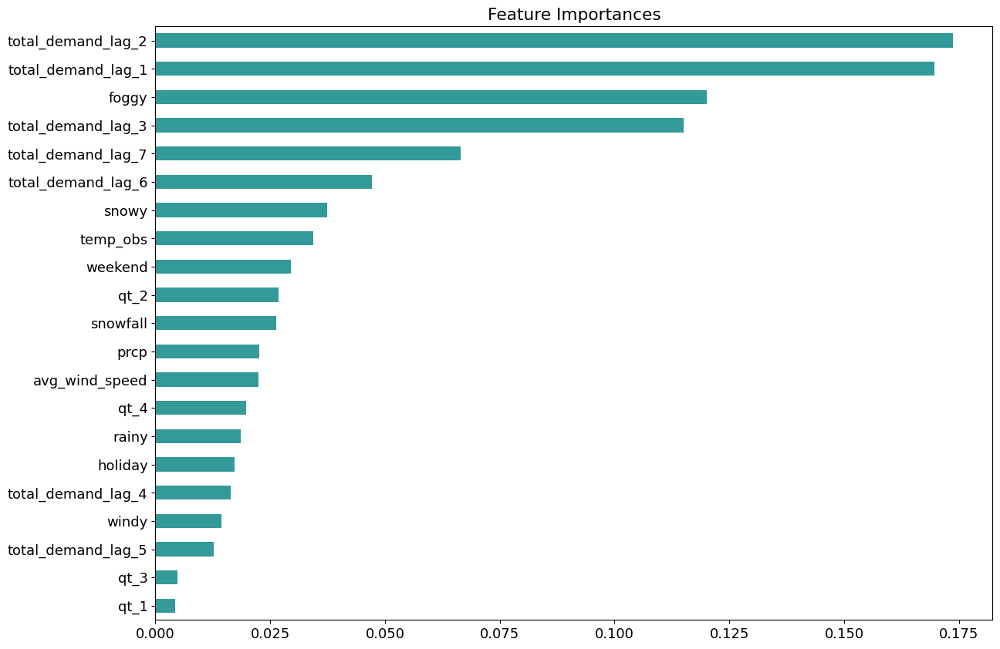

In [31]:
# plotting feature importance
plt.rc("figure", figsize=(14, 10))
plt.rc("font", size=13)
pd.Series(
    xgb_gs.best_estimator_.feature_importances_,
    index=xgb_gs.best_estimator_.feature_names_in_
).sort_values(ascending=True).plot(kind='barh', title="Feature Importances", color='teal', alpha=0.8);


**<span style='color: DarkRed'>This plot clearly shows the most important features for our `XGBoost` model. Although we expect the lag variables to be important decision factors, it's surprising to see that `foggy` features in the top 3 most important! I also expected `temp_obs` to be higher up than it is.</span>**

**Let's also check the dates for which we got the worst predictions.**

In [32]:
# extracting dates based on 95 pecentile from forecasted demand - actual demand

xgb_pred_actual_df = pd.DataFrame({'forecasted_demand':demand_forecast_xgb, 'actual_demand':y_test.values},
                                  index=y_test.index)
xgb_pred_actual_df['prediction_error'] = xgb_pred_actual_df.actual_demand - xgb_pred_actual_df.forecasted_demand

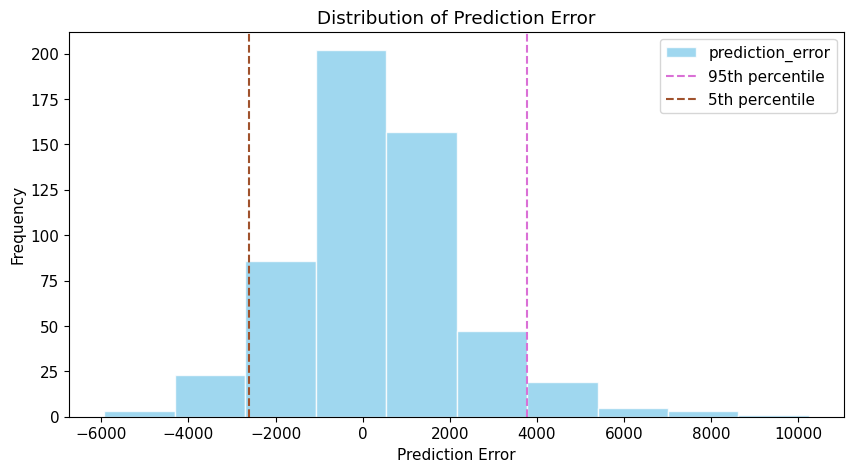

In [33]:
# plotting 

plt.rc("figure", figsize=(10, 5))
plt.rc("font", size=11)
xgb_pred_actual_df['prediction_error'].plot(kind='hist', color='skyblue', edgecolor='w', alpha=0.8)
plt.axvline(xgb_pred_actual_df['prediction_error'].quantile(0.95), c='orchid', linestyle='--', label='95th percentile' )
plt.axvline(xgb_pred_actual_df['prediction_error'].quantile(0.05), c='sienna', linestyle='--', label='5th percentile')
plt.title('Distribution of Prediction Error')
plt.xlabel('Prediction Error')
plt.legend()
plt.show()

**<span style='color: DarkRed'>The range of errors is high! Let's focus on dates where the prediction errors are greater than 95th percentile or less than 5th percentile.</span>**

In [34]:
# fetching extreme prediction dates

extreme_pred_error_df = xgb_pred_actual_df[(xgb_pred_actual_df.prediction_error<xgb_pred_actual_df['prediction_error'].quantile(0.05))
                  | (xgb_pred_actual_df.prediction_error>xgb_pred_actual_df['prediction_error'].quantile(0.95))]

print('Test data with extreme predictions -')

xgb_extreme_pred_error_test_data = test_data.loc[extreme_pred_error_df.index.values,:]

xgb_extreme_pred_error_test_data['pred_error'] = extreme_pred_error_df.prediction_error

xgb_extreme_pred_error_test_data.head(5)

Test data with extreme predictions -


,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy,total_demand_lag_1,total_demand_lag_2,total_demand_lag_3,total_demand_lag_4,total_demand_lag_5,total_demand_lag_6,total_demand_lag_7,pred_error
2022-02-03,3217.0,5.37,0.313333,0.0,41.5,0.0,0.0,1.0,0.0,0.0,0.0,1,0,0,0,5807.0,5174.0,4268.0,3079.0,2721.0,3582.0,4601.0,-3070.214844
2022-02-13,2911.0,10.51,0.053333,0.0,32.5,1.0,0.0,1.0,0.0,0.0,0.0,1,0,0,0,8660.0,7874.0,6736.0,6370.0,5501.0,4006.0,4206.0,-3597.183105
2022-03-09,3891.0,8.50,0.623333,0.0,40.0,0.0,0.0,1.0,0.0,0.0,0.0,1,0,0,0,7598.0,6650.0,9340.0,9692.0,6717.0,7055.0,7888.0,-2867.060547
2022-03-19,14028.0,13.87,0.060000,0.0,59.0,1.0,0.0,1.0,0.0,0.0,0.0,0,0,0,0,11445.0,5603.0,11055.0,10420.0,8007.0,4311.0,2119.0,6035.137695
2022-03-23,5905.0,9.40,0.163333,0.0,48.5,0.0,0.0,1.0,0.0,0.0,0.0,1,0,0,1,12742.0,11029.0,9001.0,14028.0,11445.0,5603.0,11055.0,-3932.331055


<Axes: >

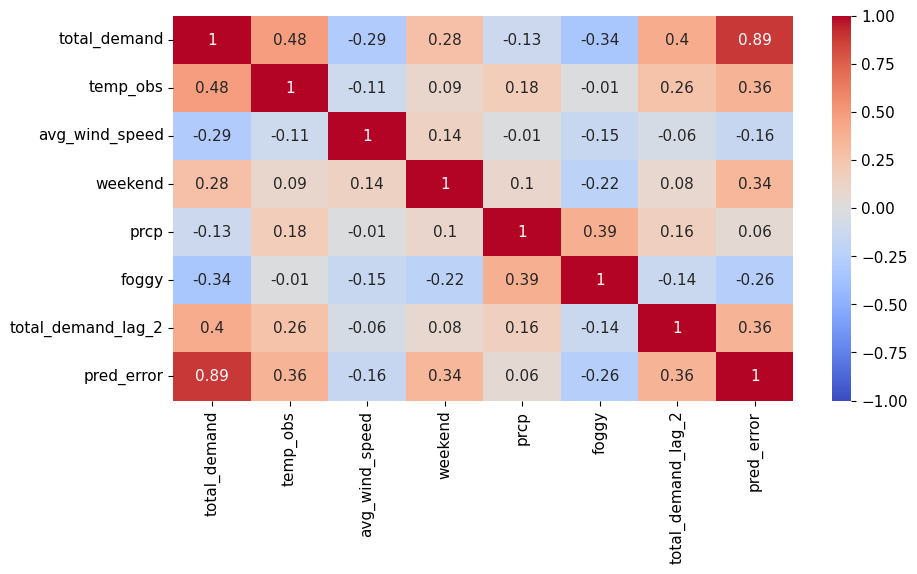

In [35]:
# let's check if there are any significant correaltions between prediction error and other features

sns.heatmap(round(xgb_extreme_pred_error_test_data[[
    'total_demand', 'temp_obs', 'avg_wind_speed', 'weekend','prcp', 'foggy', 
    'total_demand_lag_2','pred_error']].corr(),2), annot=True, vmin=-1, vmax=1, cmap='coolwarm')


**<span style='color: DarkRed'>We can clearly see a strong correlation between prediction error and the actual demand. Let's plot a scatter plot to understand this relationship better.</span>**

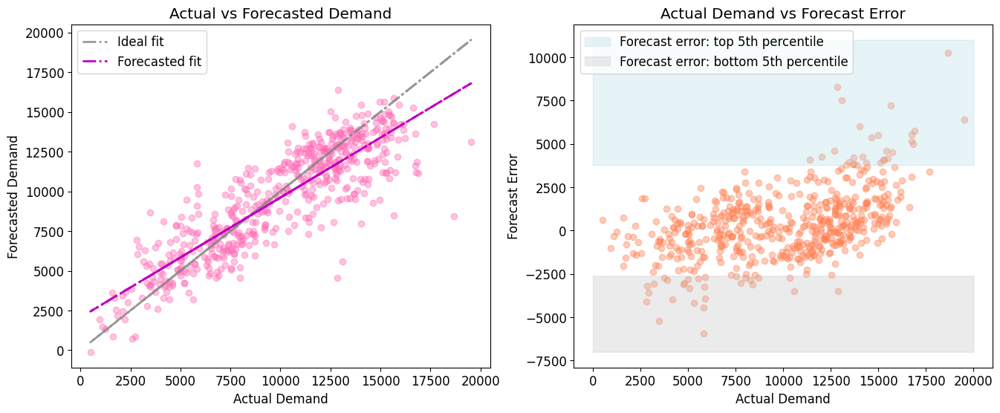

In [36]:
plt.rc("figure", figsize=(16, 6))
plt.rc("font", size=12)
fig, (ax1, ax2) = plt.subplots(1,2)

# plotting actual demand vs forecasted demand

ax1.scatter(x=xgb_pred_actual_df.actual_demand, y=xgb_pred_actual_df.forecasted_demand, c='hotpink', alpha=0.4)
ax1.set_title('Actual vs Forecasted Demand')
ax1.set_xlabel('Actual Demand')
ax1.set_ylabel('Forecasted Demand')
m, b = np.polyfit(xgb_pred_actual_df.actual_demand, xgb_pred_actual_df.actual_demand, 1)
ax1.plot(xgb_pred_actual_df.actual_demand, m*xgb_pred_actual_df.actual_demand + b, c='gray', alpha=0.8,
         linestyle='-.', label='Ideal fit', linewidth=2)
mf, bf = np.polyfit(xgb_pred_actual_df.actual_demand, xgb_pred_actual_df.forecasted_demand, 1)
ax1.plot(xgb_pred_actual_df.actual_demand, mf*xgb_pred_actual_df.actual_demand + bf, c='m', 
         linestyle='-.', label='Forecasted fit', linewidth=2)
ax1.legend()

# plotting actual demand vs forecast error

ax2.scatter(x=xgb_pred_actual_df.actual_demand, y=xgb_pred_actual_df.prediction_error, c='coral', alpha=0.4)
ax2.set_title('Actual Demand vs Forecast Error')
ax2.set_xlabel('Actual Demand')
ax2.set_ylabel('Forecast Error')
ax2.fill_between(x=range(0,20000), y1=xgb_pred_actual_df['prediction_error'].quantile(0.95),
                y2=11000, alpha=0.3, color='lightblue', label='Forecast error: top 5th percentile')
ax2.fill_between(x=range(0,20000), y1=xgb_pred_actual_df['prediction_error'].quantile(0.05),
                y2=-7000, alpha=0.3, color='silver', label='Forecast error: bottom 5th percentile')
ax2.legend()

plt.show()

**<span style='color: DarkRed'>The first plot above highlights how the ideal fit and actual fit varies. We can see that the slope of the forecasted fit is less than ideal, which tells us that the model predicts higher than actual at lower values of true demand and lower than actual at higher values of true demand.</span>**

**<span style='color: DarkRed'>This observation is emphasized by the second plot above where we look at the forecast error against actual/true demand. We can see how the most extreme 5th percentlice errors are mostly concentrated away from the middle, towards the lower and the higher ends of actual demand.</span>**

**<span style='color: DarkRed'>This implies that our model does not generalise very well to the extreme values of demand.</span>**

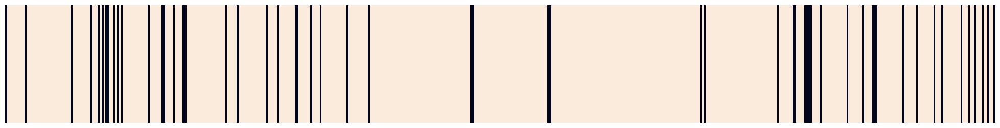

In [37]:
# let's check if there is any pattern to the dates 

full_range = pd.date_range(start=extreme_pred_error_df.index.min(), end=extreme_pred_error_df.index.max(), freq="D")
extreme_pred_error_df_reindexed = extreme_pred_error_df.reindex(full_range)

# plotting 
plt.figure(figsize=(25, 3))
sns.heatmap(extreme_pred_error_df_reindexed.T.isna(), cbar=False)
plt.yticks([])
plt.xticks([])
plt.show()

**We don't see any huge clustering of dates here. Let's investigate further by looking at the weekend proportion in these extreme error cases.**


Observed proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors:  0.5

Expected proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors assuming no correlation between errors and weekends:  0.29


Text(0.5, 1.0, 'Proportion of Weekends in Test Data for Extreme Forecast Errors vs\nProportion of Weekends in All of Test Data')

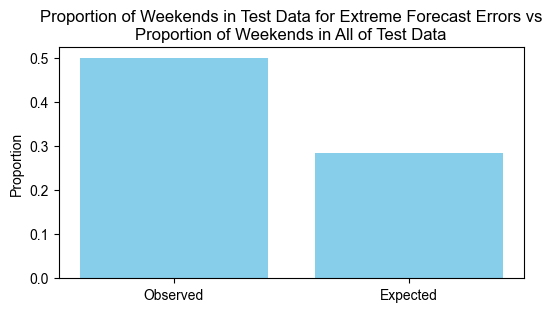

In [38]:
# calculating proportion weekends in the extreme pred error df

weekend_prop_extreme_error = xgb_extreme_pred_error_test_data.weekend.sum()/len(xgb_extreme_pred_error_test_data)
print('\nObserved proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors: ', weekend_prop_extreme_error)

# calculating expected proportion of weekend in case there is no correlation between extreme forecast errors and weekends

expected_prop = test_data.weekend.sum()/len(test_data)
print('\nExpected proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors assuming \
no correlation between errors and weekends: ', round(expected_prop,2))

plt.figure(figsize=(6,3))
plt.rc('font', family="Arial", size=10)
plt.bar(x=['Observed','Expected'], height=[weekend_prop_extreme_error, expected_prop], color='skyblue')
plt.ylabel('Proportion')
plt.title('Proportion of Weekends in Test Data for Extreme Forecast Errors vs\nProportion of Weekends in All of Test Data')


**<span style='color: DarkRed'>The proportion of weekends in cases of extreme forecast errors is 1.7 times that of the expected! Let's validate this with a `proportions Z-test`.</span>**

In [39]:
# Getting statistic and p-value for the hypothesis test using the data above

# these are the counts of review writing in Scenario A and B
counts = [xgb_extreme_pred_error_test_data.weekend.sum(), test_data.weekend.sum()]
# these are the counts of emails sent out in Scenario A and B
number_of_obs = [len(xgb_extreme_pred_error_test_data), len(test_data)]

# test
proportions_ztest(counts, number_of_obs)

(3.3150092695571525, 0.0009164008575662558)

**<span style='color: DarkRed'>The above test validates that our model does poorly when it comes to predicting demand for the weekends.</span>**

**Now that we have built a XGBoost model and looked at some of it's drawbacks and shortcomings, let's explore some other models and see how they fare!**

<a id="2.2"></a> 
### ARIMA

**To begin with let's see if we can effectively use ARIMA. Afterall, we saw above that after differencing our data was essentially stationary as per the augmented Dickey-Fuller unit root test as well as KPSS!**

**ARIMA stands for Autoregressive Integrated Moving Average. It is a statistical model that forecasts based on only the historical data. The `integrated` part here corresponds to the initial differencing step that needs to be applied to the data to make it stationary. We already know the value for it is `1`. So let's figure out the optimal hyperparameters for the model.**

In [181]:
# preparing train and test data
arima_data = my_data.copy()

arima_train_data = arima_data[arima_data.index.year<2020]

arima_test_data = arima_data[arima_data.index.year>2021]

In [182]:
import warnings
from statsmodels.tools.sm_exceptions import ValueWarning, ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)
warnings.simplefilter('ignore', ValueWarning)

In [183]:
# Create empty list to store search results

order_aic_bic=[]

# Loop over p values from 0-2
for p in range(3):
    # Loop over q values from 0-2
    
    for q in range(3):    
        try:
            # create and fit ARMA(p,q) model
            model = ARIMA(arima_train_data.total_demand, order=(p,1,q))
            results = model.fit()
            
            # Append order and results tuple
            order_aic_bic.append((p,q,results.aic,results.bic))
            
        except:
            # Append order and results tuple
            order_aic_bic.append((p,q,None,None))
        
        

In [184]:
# Construct DataFrame from order_aic_bic
order_df = pd.DataFrame(order_aic_bic, 
                        columns=['p', 'q', 'AIC', 'BIC'])

# Print order_df in order of increasing AIC
# since we want a model with high predictive power than high explainability, we'll choose a model based on lowest AIC
print(order_df.sort_values(by='AIC', axis=0))

# Print order_df in order of increasing BIC
# print(order_df.sort_values(by='BIC', axis=0))

   p  q           AIC           BIC
8  2  2  52499.836497  52529.734903
5  1  2  52503.071912  52526.990637
2  0  2  52512.489769  52530.428813
7  2  1  52514.087679  52538.006404
4  1  1  52517.425821  52535.364865
1  0  1  52729.320290  52741.279653
6  2  0  52915.624898  52933.563942
3  1  0  53097.529840  53109.489203
0  0  0  53368.915457  53374.895138


In [185]:
# create and fit ARIMA(2,1,2) model

model = ARIMA(arima_train_data.total_demand, order=(2,1,2))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:           total_demand   No. Observations:                 2922
Model:                 ARIMA(2, 1, 2)   Log Likelihood              -26244.918
Date:                Mon, 04 Sep 2023   AIC                          52499.836
Time:                        22:04:58   BIC                          52529.735
Sample:                    01-01-2012   HQIC                         52510.605
                         - 12-31-2019                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8289      0.250      3.311      0.001       0.338       1.320
ar.L2         -0.2161      0.080     -2.703      0.007      -0.373      -0.059
ma.L1         -1.3714      0.251     -5.454      0.000      -1.864      -0.879
ma.L2          0.4390      0.223      1.973      0.049       0.003       0.875
sigma2      3.814e+06   6.25e+04     61.034      0.000    3.69e+06    3.94e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):              1910.44
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               2.55   Skew:                            -0.81
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.62
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

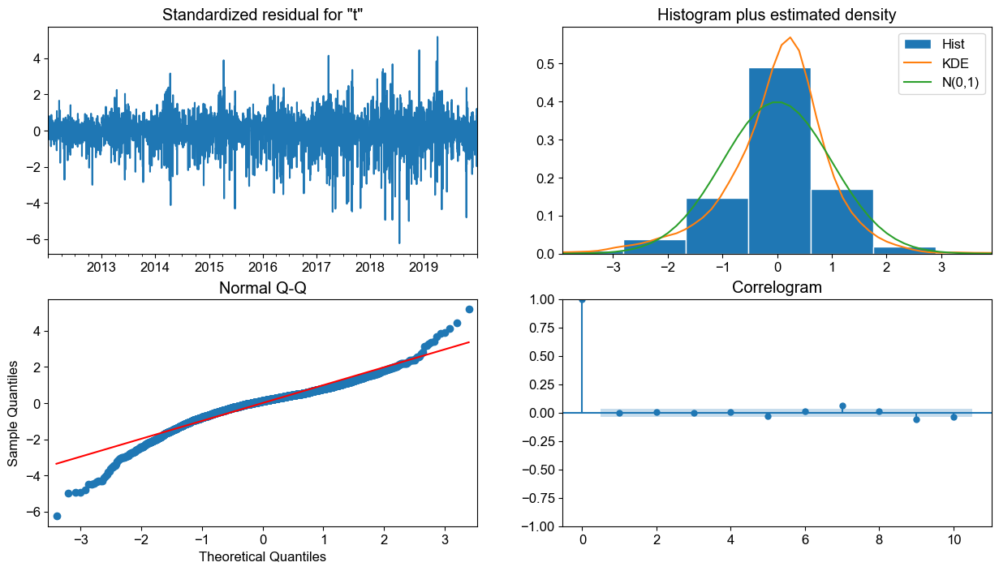

In [186]:
results.plot_diagnostics(figsize=(15,8))
print('\n')

**We can clearly see that the residuals are not normally distributed and seem to have some correlation.**

**Which implies that the augmented `Dickey-Fuller (ADF) test` does not detect nonstationarity of the seasonal kind!**

In [187]:
# getting predictions

forecast = results.get_prediction(start=0, end=len(arima_train_data)+len(arima_test_data)-1)
mean_forecast = forecast.predicted_mean
confidence_interval = forecast.conf_int()

In [188]:
# plotting difference in demand

train_idx = arima_train_data.index
test_idx = mean_forecast[mean_forecast.index.year>2019].index

fig = go.Figure()
fig.add_trace(go.Scatter(x=train_idx, y=arima_train_data.total_demand, mode='lines', name="Train"))
fig.add_trace(go.Scatter(x=test_idx, y=arima_test_data.total_demand, mode='lines', name="Test"))
fig.add_trace(go.Scatter(x=mean_forecast.index, y=mean_forecast.values, mode='lines', name="Predictions"))
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(
    yaxis_title="Demand", 
    xaxis_title="Date",
    title="Change In Differenced Demand - Forecast vs Actual"
)
fig.show()

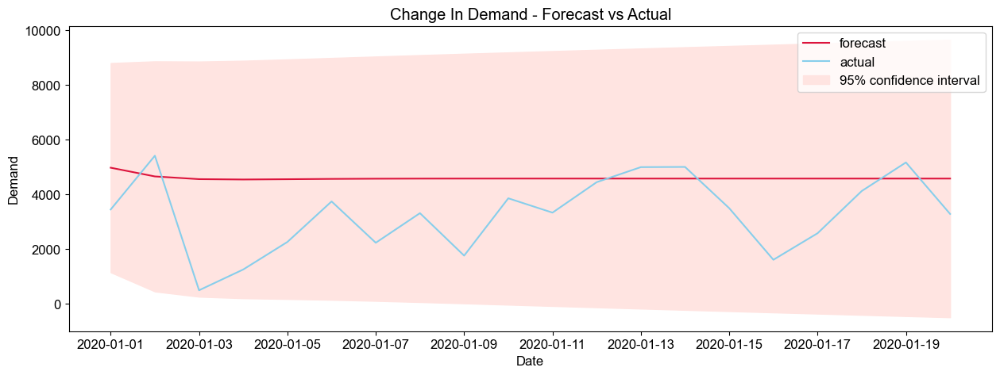

In [189]:
# taking a closer look at the test data

plt.figure(figsize=(15,5))
plt.rc('font', family="Arial", size=12)

ind_range = 20
plt.plot(test_idx[:ind_range],
        mean_forecast[test_idx[:ind_range]].values,
        color='crimson',
        label='forecast')

plt.plot(test_idx[:ind_range],
        arima_test_data.total_demand.iloc[:ind_range],
        color='skyblue',
        label='actual')

plt.fill_between(test_idx[:ind_range],
                confidence_interval.loc[test_idx[:ind_range],'lower total_demand'],
                confidence_interval.loc[test_idx[:ind_range], 'upper total_demand'],
                color='mistyrose',
                label='95% confidence interval')

plt.title('Change In Demand - Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Demand')

plt.legend(loc='upper right')
plt.show()

In [190]:
# calculating the mean absolute percentage error
arima212_test_mape = mean_absolute_percentage_error(arima_test_data.total_demand, mean_forecast[test_idx])
arima212_test_rmse =np.sqrt(mean_squared_error(arima_test_data.total_demand, mean_forecast[test_idx]))
arima212_test_rmsle = np.sqrt(mean_squared_log_error(arima_test_data.total_demand, abs(mean_forecast[test_idx])))
# arima107_train_mape = mean_absolute_percentage_error(train_data_arima.demand_diff_365_7, mean_forecast[train_idx])

print(f"Test set MAPE: {round(arima212_test_mape, 2)}%")
print('\nTest set RMSE: ', arima212_test_rmse)
print('\nTest set RMSLE: ', arima212_test_rmsle)

Test set MAPE: 0.55%

Test set RMSE:  6615.188426256928

Test set RMSLE:  0.843710435011891


In [191]:
# calculating the mean absolute percentage error
arima212_test_mape = mean_absolute_percentage_error(arima_test_data.total_demand[:7], mean_forecast[test_idx][:7])
arima212_test_rmse =np.sqrt(mean_squared_error(arima_test_data.total_demand[:7], mean_forecast[test_idx][:7]))
arima212_test_rmsle = np.sqrt(mean_squared_log_error(arima_test_data.total_demand[:7], abs(mean_forecast[test_idx][:7])))
# arima107_train_mape = mean_absolute_percentage_error(train_data_arima.demand_diff_365_7, mean_forecast[train_idx])

print(f"Test MAPE for the first week of forecast: {round(arima212_test_mape, 2)}%")
print('\nTest RMSE for the first week of forecast: ', arima212_test_rmse)
print('\nTest RMSLE for the first week of forecast: ', arima212_test_rmsle)

Test MAPE for the first week of forecast: 1.95%

Test RMSE for the first week of forecast:  2441.078913381243

Test RMSLE for the first week of forecast:  1.0528658602646188


**Both the `MAPE` on the entire test set as well as the `MAPE` for just the first week are considerably higher than what we got with `XGBoost`!**

**<span style='color: DarkRed'>Due to our differenced time series essentially not being stationary (as seen by the residual plots above), we'll have to remove seasonality from our data and then try ARIMA modeling again.</span>**

**We already know from our experiments in the last (EDA) step that we have a `yearly seasonality` and a `weekly seasonality`. Let's go ahead and difference our data by 7 days as well as 365 days. But before we do that, we'll have to make sure we have removed COVID data and that our dates are contiguous.**

In [192]:
# splitting into train and test
train_data_arima = arima_data[arima_data.index.year<2020]
test_data_arima = arima_data[arima_data.index.year>2021]

# reindexing test data to maintain continuity which was broken when we removed COVID data
new_date_index = pd.date_range(start=train_data_arima.index.max() + pd.DateOffset(days=1),
                               periods=len(test_data_arima), freq='D')
                               

test_data_arima_reindexed = pd.DataFrame(data=test_data_arima[test_data_arima.columns].values,
                                         columns=test_data_arima.columns,
                                         index=new_date_index)

arima_data_reindexed = pd.concat([train_data_arima, test_data_arima_reindexed], axis=0)
display(arima_data_reindexed.iloc[-548:-543])


,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy
2019-12-30,5419.0,7.61,0.533333,0.0,59.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
2019-12-31,5746.0,8.50,0.110000,0.0,42.5,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
2020-01-01,3452.0,4.70,0.295000,0.0,58.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2020-01-02,5419.0,9.62,0.285000,0.0,58.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2020-01-03,497.0,14.54,0.745000,6.9,33.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [193]:
# differencing total_demand twice - 365 days and 7 days
arima_data_reindexed['demand_diff_365_7'] = arima_data_reindexed.total_demand.diff(365).diff(7)
arima_data_reindexed.dropna(inplace=True)
display(arima_data_reindexed.head())

,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy,demand_diff_365_7
2013-01-07,4741.0,7.61,0.000000,0.0,41.5,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,882.0
2013-01-08,5274.0,6.26,0.000000,0.0,33.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2922.0
2013-01-09,5110.0,2.91,0.003333,0.0,31.5,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,83.0
2013-01-10,5382.0,6.49,0.000000,0.0,39.5,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1729.0
2013-01-11,4094.0,2.24,0.003333,0.0,38.5,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,-796.0


In [194]:
# splitting into train and test again after reindexing

train_data_arima = arima_data_reindexed[arima_data_reindexed.index.year<2020]
test_data_arima = arima_data_reindexed[arima_data_reindexed.index.year>=2020]

print(len(test_data_arima))

546


**Now we'll plot the `ACF` and `PACF` for the differenced columns.**

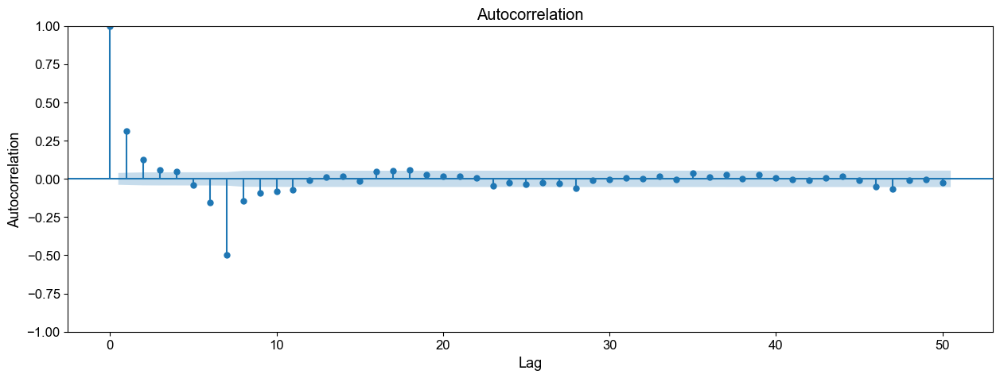

In [195]:
# plotting auto-correlation 

plt.figure(figsize=(15, 5))

# put the acf plot on the current axis
plot_acf(train_data_arima.demand_diff_365_7, lags=50, ax=plt.gca())
plt.xlabel('Lag', fontdict=dict(family="Arial", size=13, color='black'))
plt.ylabel('Autocorrelation', fontdict=dict(family="Arial", size=13, color='black'))
plt.show()

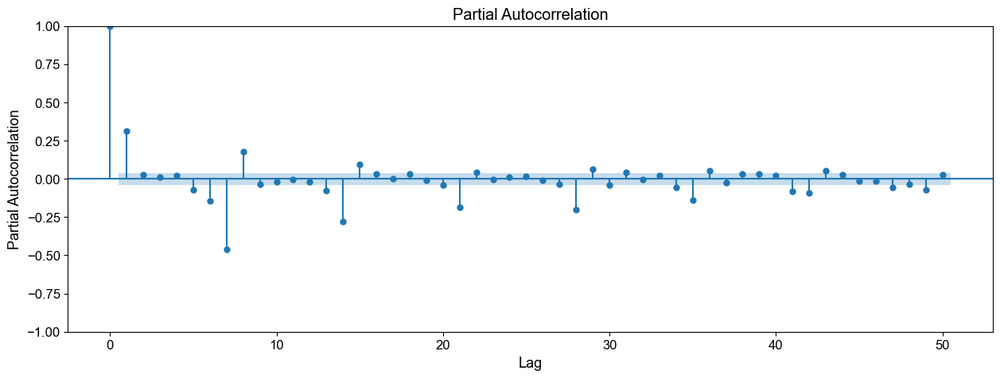

In [196]:
# plotting partial auto-correlation 

plt.figure(figsize=(15, 5))

# put the acf plot on the current axis
plot_pacf(train_data_arima.demand_diff_365_7, lags=50, ax=plt.gca())
plt.xlabel('Lag', fontdict=dict(family="Arial", size=13, color='black'))
plt.ylabel('Partial Autocorrelation', fontdict=dict(family="Arial", size=13, color='black'))
plt.show()

**Since both, the `ACF` and `PACF` plots tail off, it implies our model has both an AR and a MA component. Let's find the appropriate hyper-paramaters now.**

In [197]:
# Create empty list to store search results
order_aic_bic=[]

# Loop over p values from 0-7
for p in range(8):
    # Loop over q values from 0-7
    for q in range(8):    
        try:
            # create and fit ARMA(p,q) model
            model = ARIMA(train_data_arima.demand_diff_365_7, order=(p,0,q))
            results = model.fit()
            
            # Append order and results tuple
            order_aic_bic.append((p,q,results.aic,results.bic))
            
        except:
            # Append order and results tuple
            order_aic_bic.append((p,q,None,None))

In [198]:
# Construct DataFrame from order_aic_bic
order_df = pd.DataFrame(order_aic_bic, 
                        columns=['p', 'q', 'AIC', 'BIC'])

# Print order_df in order of increasing AIC
# since we want a model with high predictive power than high explainability, we'll choose a model based on lowest AIC
print(order_df.sort_values(by='AIC', axis=0).head(10))

# Print order_df in order of increasing BIC
# print(order_df.sort_values(by='BIC', axis=0))

    p  q           AIC           BIC
63  7  7  47516.913298  47610.414876
47  5  7  47518.885067  47600.698948
31  3  7  47519.394335  47589.520518
15  1  7  47519.628098  47578.066585
39  4  7  47519.891312  47595.861345
55  6  7  47520.286339  47607.944069
23  2  7  47524.347124  47588.629459
7   0  7  47709.869275  47762.463912
62  7  6  47924.690002  48012.347732
61  7  5  47989.318948  48071.132829


**Since there isn't a large difference between AIC scores for the top two rows above, but the BIC score for the fourth row is realtively lower, I'll chose the the values of p and q to be 1 and 7 from row 4 instead of blindly picking row 1.**

In [199]:
# create and fit ARIMA(1,0,7) model

model = ARIMA(train_data_arima.demand_diff_365_7, order=(1,0,7))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:      demand_diff_365_7   No. Observations:                 2550
Model:                 ARIMA(1, 0, 7)   Log Likelihood              -23749.814
Date:                Mon, 04 Sep 2023   AIC                          47519.628
Time:                        22:07:51   BIC                          47578.067
Sample:                    01-07-2013   HQIC                         47540.823
                         - 12-31-2019                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0687     14.157      0.005      0.996     -27.678      27.815
ar.L1          0.3349      0.019     17.330      0.000       0.297       0.373
ma.L1          0.0086      0.007      1.158      0.247      -0.006       0.023
ma.L2          0.0228      0.007      3.269      0.001       0.009       0.036
ma.L3          0.0130      0.007      1.832      0.067      -0.001       0.027
ma.L4          0.0274      0.007      3.822      0.000       0.013       0.041
ma.L5          0.0152      0.007      2.346      0.019       0.003       0.028
ma.L6          0.0268      0.007      3.891      0.000       0.013       0.040
ma.L7         -0.9710      0.007   -140.642      0.000      -0.984      -0.957
sigma2       8.62e+06   4.65e-05   1.85e+11      0.000    8.62e+06    8.62e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               529.95
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               2.25   Skew:                            -0.07
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.23
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.56e+27. Standard errors may be unstable.
"""

**<span style='color: DarkRed'>We can already see that our AIC and BIC scores for ARIMA(7,0,7) are much lower than our previous scores from ARIMA(2,1,2)!</span>**

**Now let's look at the residuals to check if they are any better (in terms of normality) as well.**

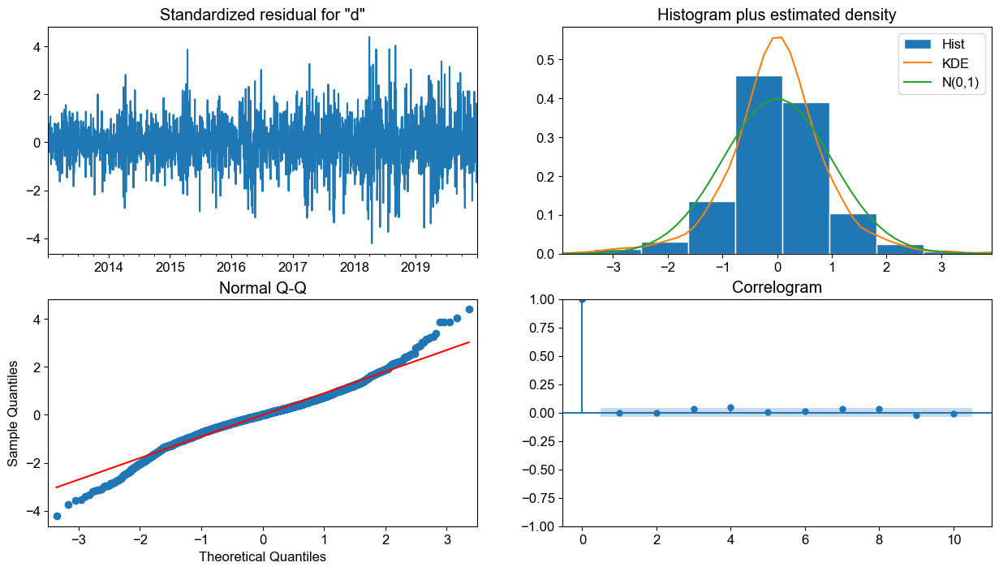

In [200]:
results.plot_diagnostics(figsize=(15,8))
print('\n')

**<span style='color: DarkRed'>We can see that the residuals are relatively more normal compared to the what we saw with ARIMA(2,1,2) model before. Now let's go ahead and make predictions!**<span style='color: DarkRed'>

In [201]:
# getting predictions

forecast = results.get_prediction(start=0, end=len(train_data_arima)+len(test_data_arima)-1)
mean_forecast = forecast.predicted_mean
confidence_interval = forecast.conf_int()

In [202]:
# plotting difference in demand

train_idx = train_data_arima.index
test_idx = mean_forecast[mean_forecast.index.year>2019].index

fig = go.Figure()
fig.add_trace(go.Scatter(x=train_idx, y=train_data_arima.demand_diff_365_7[train_idx], mode='lines', name="Train"))
fig.add_trace(go.Scatter(x=test_idx, y=test_data_arima.demand_diff_365_7, mode='lines', name="Test"))
fig.add_trace(go.Scatter(x=arima_data_reindexed.index, y=mean_forecast.values, mode='lines', name="Predictions"))
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(
    yaxis_title="Demand", 
    xaxis_title="Date",
    title="Change In Differenced Demand - Forecast vs Actual"
)
fig.show()

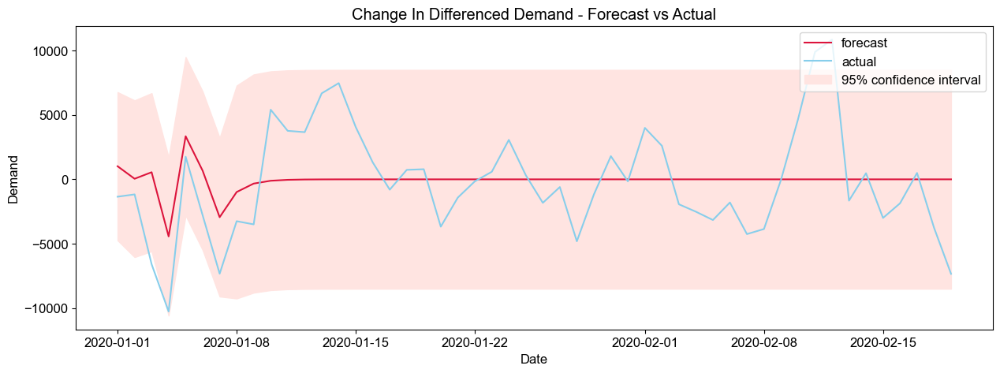

In [203]:
# taking a closer look at the test data

plt.figure(figsize=(15,5))
plt.rc('font', family="Arial", size=12)

ind_range = 50
plt.plot(test_idx[:ind_range],
        mean_forecast[test_idx[:ind_range]].values,
        color='crimson',
        label='forecast')

plt.plot(test_idx[:ind_range],
        test_data_arima.demand_diff_365_7.iloc[:ind_range],
        color='skyblue',
        label='actual')

plt.fill_between(test_idx[:ind_range],
                confidence_interval.loc[test_idx[:ind_range],'lower demand_diff_365_7'],
                confidence_interval.loc[test_idx[:ind_range], 'upper demand_diff_365_7'],
                color='mistyrose',
                label='95% confidence interval')

plt.title('Change In Differenced Demand - Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Demand')

plt.legend(loc='upper right')
plt.show()

In [204]:
# calculating the mean absolute percentage error
arima107_test_mape = mean_absolute_percentage_error(test_data_arima.demand_diff_365_7, mean_forecast[test_idx])
# arima107_train_mape = mean_absolute_percentage_error(train_data_arima.demand_diff_365_7, mean_forecast[train_idx])

print(f"Test MAPE on the difference: {round(arima107_test_mape, 2)}%")
# print(f"Train MAPE on the difference: {round(arima107_train_mape, 2)}%")

Test MAPE on the difference: 1.0%


**We have been looking at the differenced data so far. Let's restore to actual values and then calculate the MAPE.**

In [205]:
# slicing out the first 365 days + 7 days and the rest of the dates
first_year_indices = train_data_arima.index[:372]
remaining_indices = train_data_arima.index[372:]

# create an empty restored column
train_data_arima["restored"] = np.nan

# fill in the first 365 + 7  original values into the empty restored column
train_data_arima.loc[first_year_indices, "restored"] = \
    train_data_arima.loc[first_year_indices, "total_demand"]

# use the current difference value and the lagged restored values to get the updated restored value
for current_date in remaining_indices:
    current_value = train_data_arima.loc[current_date, "demand_diff_365_7"]
    
    week_before_restored = train_data_arima.loc[current_date - pd.DateOffset(days=7), "restored"]
    
    year_before_week_before_restored = train_data_arima.loc[current_date - pd.DateOffset(days=372), "restored"]
    
    year_before_restored = train_data_arima.loc[current_date - pd.DateOffset(days=365), "restored"]
    
    train_data_arima.loc[current_date, "restored"] = current_value + year_before_restored + week_before_restored - year_before_week_before_restored

# check agreement everywhere (rounding errors can come up so check closeness rather than strict equality)
np.allclose(train_data_arima["total_demand"], train_data_arima["restored"])


True

**Great! This was a crucial step to validate our approach to restore data to original values since we had taken double differences. Now that we have verified this approach on our train data, let's go ahead and implement this on our test data.**

In [206]:
# adding mean_forecast column
arima_data_reindexed['mean_forecast'] = mean_forecast

In [207]:
# slicing out the first 365 days + 7 days and the rest of the dates
train_indices = train_data_arima.index
remaining_indices = test_data_arima.index

# create an empty restored column
arima_data_reindexed["restored"] = np.nan

# fill in the original values into the empty restored column for the train data rows
arima_data_reindexed.loc[train_indices, "restored"] = \
    arima_data_reindexed.loc[train_indices, "total_demand"]

# use the current difference value and the lagged restored values to get the updated restored value
for current_date in remaining_indices:
    current_value = arima_data_reindexed.loc[current_date, "mean_forecast"]
    
    week_before_restored = arima_data_reindexed.loc[current_date - pd.DateOffset(days=7), "restored"]
    
    year_before_week_before_restored = arima_data_reindexed.loc[current_date - pd.DateOffset(days=372), "restored"]
    
    year_before_restored = arima_data_reindexed.loc[current_date - pd.DateOffset(days=365), "restored"]
    
    arima_data_reindexed.loc[current_date, "restored"] = current_value + year_before_restored + week_before_restored - year_before_week_before_restored


**Now let's try to plot this.**

In [208]:
# plotting difference in demand

train_idx = train_data_arima.index
test_idx = test_data_arima.index

fig = go.Figure()
fig.add_trace(go.Scatter(x=train_idx, y=train_data_arima.total_demand, mode='lines', name="Train"))
fig.add_trace(go.Scatter(x=test_idx, y=test_data_arima.total_demand, mode='lines', name="Test"))
fig.add_trace(go.Scatter(x=test_idx, y=arima_data_reindexed.loc[test_idx,'restored'], mode='lines', name="Predictions"))
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(
    yaxis_title="Difference", 
    xaxis_title="Date",
    title="Change in Demand"
)
fig.show()

In [209]:
# calculating the mean absolute percentage error
arima107_test_mape = mean_absolute_percentage_error(test_data_arima.total_demand, arima_data_reindexed.loc[test_idx,'restored'])
arima107_test_rmse =np.sqrt(mean_squared_error(test_data_arima.total_demand, arima_data_reindexed.loc[test_idx,'restored']))
arima107_test_rmsle = np.sqrt(mean_squared_log_error(test_data_arima.total_demand, abs(arima_data_reindexed.loc[test_idx,'restored'])))

print(f"Test set MAPE: {round(arima107_test_mape, 2)}%")
print('\nTest set RMSE: ', arima107_test_rmse)
print('\nTest set RMSLE: ', arima107_test_rmsle)

Test set MAPE: 0.38%

Test set RMSE:  3433.047161296644

Test set RMSLE:  0.5120068685818733


**<span style='color: DarkRed'>We achieve a `MAPE` of `0.382%`. This error is significantly higher what we achieved with `XGBoost` (0.178%) and that is to be expected since ARIMA is good for short-term forecasts (as we saw in the 'Change In Differenced Demand - Forecast vs Actual' plot above).**<span style='color: DarkRed'>

In [210]:
# calculating the mean absolute percentage error for just the first week of forecast

# calculating the mean absolute percentage error
arima107_test_mape = mean_absolute_percentage_error(test_data_arima.total_demand[:7], arima_data_reindexed.loc[test_idx,'restored'][:7])
arima107_test_rmse =np.sqrt(mean_squared_error(test_data_arima.total_demand[:7], arima_data_reindexed.loc[test_idx,'restored'][:7]))
arima107_test_rmsle = np.sqrt(mean_squared_log_error(test_data_arima.total_demand[:7], abs(arima_data_reindexed.loc[test_idx,'restored'][:7])))

print(f"Test set MAPE for the first week of forecast: {round(arima107_test_mape, 2)}%")
print('\nTest set RMSE for the first week of forecast: ', arima107_test_rmse)
print('\nTest set RMSLE for the first week of forecast: ', arima107_test_rmsle)

Test set MAPE for the first week of forecast: 3.36%

Test set RMSE for the first week of forecast:  4239.8880893596

Test set RMSLE for the first week of forecast:  1.3442122356746595


**Even based on the forecast for the first week we see that `XGBoost` does a much better job with the first week `MAPE` being `0.364`.**

**Finally, we will try one last thing for our ARIMA models. We have seen earlier that our data shows `multiplicative` 
trend and seasonality. A log transform should help here. Below are the steps we'll follow -**

1. Log transform total_demand
2. Take diff()
3. Seasonal decomposition to check seasonality
4. ACF and PACF plots to identify p,q parameters
5. Fit ARIMA model

Text(0, 0.5, 'Differenced Log of Demand')

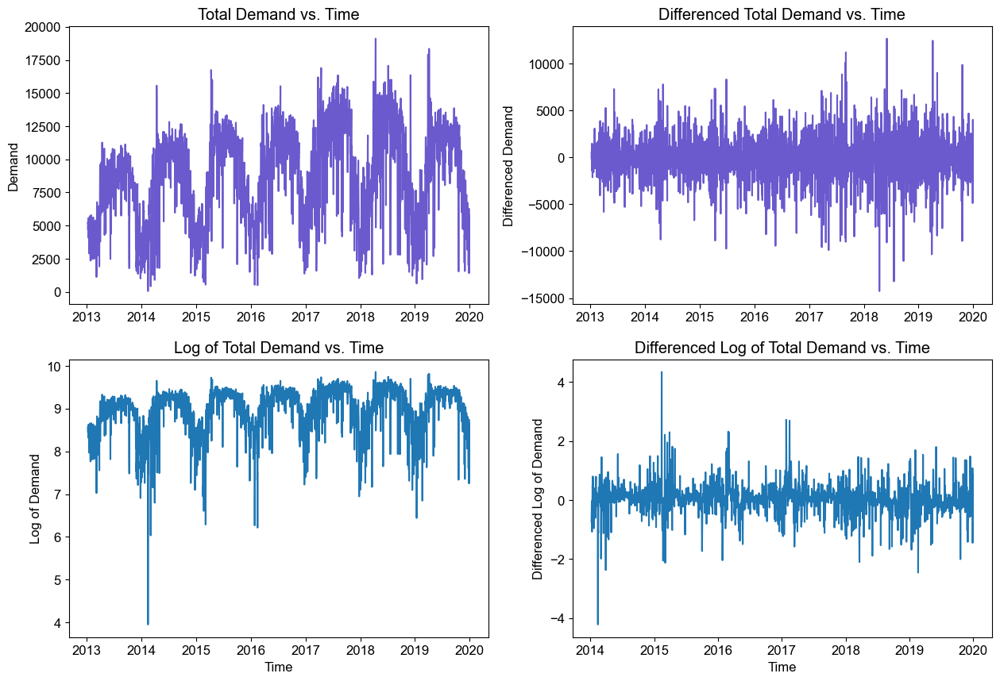

In [211]:
# let's begin by plotting the total demand before and after transformations

plt.rc('font', family="Arial", size=12)

fig, ax = plt.subplots(2,2, figsize=(15,10))

ax[0,0].plot(train_data_arima.index, train_data_arima.total_demand, color='slateblue')
ax[0,0].set_title('Total Demand vs. Time')
ax[0,0].set_ylabel('Demand')

ax[0,1].plot(train_data_arima.index, train_data_arima.total_demand.diff(), color='slateblue')
ax[0,1].set_title('Differenced Total Demand vs. Time')
ax[0,1].set_ylabel('Differenced Demand')

ax[1,0].plot(train_data_arima.index, np.log(train_data_arima.total_demand))
ax[1,0].set_title('Log of Total Demand vs. Time')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Log of Demand')

ax[1,1].plot(train_data_arima.index, np.log(train_data_arima.total_demand).diff(365))
ax[1,1].set_title('Differenced Log of Total Demand vs. Time')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('Differenced Log of Demand')

**<span style='color: DarkRed'>We can see from the plots above how taking a log of the `total_demand` helped remove the multiplicative effects of trend and seasonailty. Taking a difference of the log of `total_demand` helps make this data stationary.</span>**

Let's validate that this series is stationary by conducting statistical tests as well.

In [212]:
# creating new feature for differenced log of total_demand

# augmented Dickey-Fuller unit root test
# Null Hypothesis: The series has a unit root (non-stationary) 
# Alternate Hypothesis: The series has no unit root

adftest = adfuller(np.log(train_data_arima.total_demand).diff(365).dropna())
print(adftest)

# KPSS test
# Null Hypothesis: The process is trend stationary
# Alternate Hypothesis: The series has a unit root (series is not stationary)

kpsstest = kpss(np.log(train_data_arima.total_demand).diff(365).dropna())
print('\nkpsstest')

(-9.939559797416067, 2.6868550385406665e-17, 13, 2171, {'1%': -3.4333656834518345, '5%': -2.86287222420477, '10%': -2.567479209522704}, 2838.3345057422316)

kpsstest


/var/folders/46/5zssjgcd2yd7xl8tqv1nqm5w0000gn/T/ipykernel_89211/1203048611.py:14: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




**Based on both the `Dickey-Fuller` and `KPSS` tests, our series is stationary.**

**We'll now repeat the steps above with this differenced log of `total_demand` to train and test our ARIMA models.**

In [213]:
# splitting into train and test
train_data_arima = arima_data[arima_data.index.year<2020]
test_data_arima = arima_data[arima_data.index.year>2021]

# reindexing test data to maintain continuity which was broken when we removed COVID data
new_date_index = pd.date_range(start=train_data_arima.index.max() + pd.DateOffset(days=1),
                               periods=len(test_data_arima), freq='D')
                               

test_data_arima_reindexed = pd.DataFrame(data=test_data_arima[test_data_arima.columns].values,
                                         columns=test_data_arima.columns,
                                         index=new_date_index)

arima_data_reindexed = pd.concat([train_data_arima, test_data_arima_reindexed], axis=0)
display(arima_data_reindexed.iloc[-548:-543])


,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy
2019-12-30,5419.0,7.61,0.533333,0.0,59.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
2019-12-31,5746.0,8.50,0.110000,0.0,42.5,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
2020-01-01,3452.0,4.70,0.295000,0.0,58.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2020-01-02,5419.0,9.62,0.285000,0.0,58.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2020-01-03,497.0,14.54,0.745000,6.9,33.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [214]:
# differencing total_demand twice - 365 days and 7 days
arima_data_reindexed['demand_log_diff_365'] = np.log(arima_data_reindexed.total_demand).diff(365)
arima_data_reindexed.dropna(inplace=True)
display(arima_data_reindexed.head())

,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy,demand_log_diff_365
2012-12-31,2711.0,6.49,0.0,0.0,33.5,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.181953
2013-01-01,1964.0,6.04,0.0,0.0,39.5,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.013843
2013-01-02,3673.0,9.17,0.0,0.0,33.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.503952
2013-01-03,3844.0,6.04,0.0,0.0,27.5,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.489124
2013-01-04,4078.0,7.61,0.0,0.0,28.5,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.226644


In [215]:
# splitting into train and test again after reindexing

train_data_arima = arima_data_reindexed[arima_data_reindexed.index.year<2020]
test_data_arima = arima_data_reindexed[arima_data_reindexed.index.year>=2020]

print(len(test_data_arima))

546


**Let's plot the `ACF` and `PACF`**

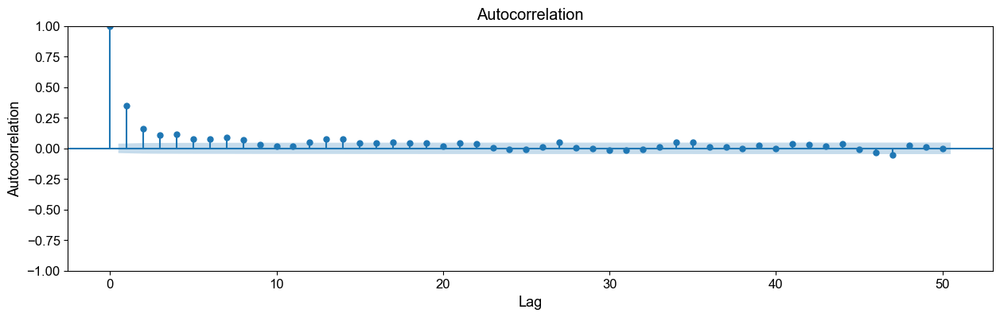

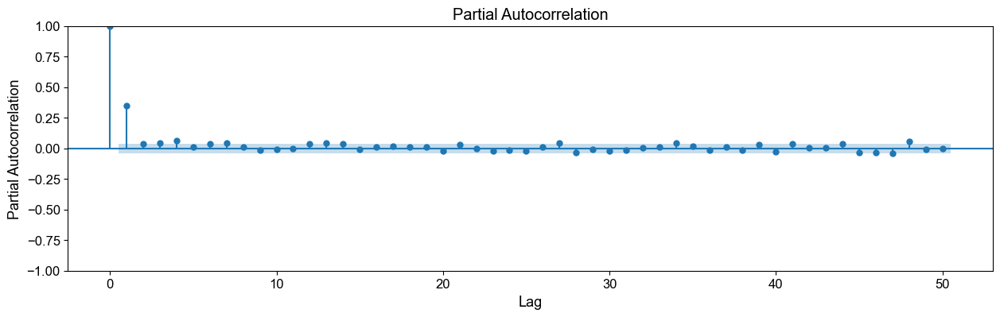

In [216]:
# plotting auto-correlation 

plt.figure(figsize=(15, 4))

# put the acf plot on the current axis
plot_acf(train_data_arima.demand_log_diff_365, lags=50, ax=plt.gca())
plt.xlabel('Lag', fontdict=dict(family="Arial", size=13, color='black'))
plt.ylabel('Autocorrelation', fontdict=dict(family="Arial", size=13, color='black'))
plt.show()

# plotting partial auto-correlation 

plt.figure(figsize=(15, 4))

# put the acf plot on the current axis
plot_pacf(train_data_arima.demand_log_diff_365, lags=50, ax=plt.gca())
plt.xlabel('Lag', fontdict=dict(family="Arial", size=13, color='black'))
plt.ylabel('Partial Autocorrelation', fontdict=dict(family="Arial", size=13, color='black'))
plt.show()

**The `ACF` plot tails off and `PACF` plots cuts off after 2. Based on this our initial estimate of `p` is 2 and `q` is 0. Let's find the appropriate hyper-paramaters now.**

In [217]:
# Create empty list to store search results
order_aic_bic=[]

# Loop over p values from 0-3
for p in range(4):
    # Loop over q values from 0-3
    for q in range(4):    
        try:
            # create and fit ARMA(p,q) model
            model = ARIMA(train_data_arima.demand_log_diff_365, order=(p,0,q))
            results = model.fit()
            
            # Append order and results tuple
            order_aic_bic.append((p,q,results.aic,results.bic))
            
        except:
            # Append order and results tuple
            order_aic_bic.append((p,q,None,None))

In [218]:
# Construct DataFrame from order_aic_bic
order_df = pd.DataFrame(order_aic_bic, 
                        columns=['p', 'q', 'AIC', 'BIC'])

# Print order_df in order of increasing AIC
# since we want a model with high predictive power than high explainability, we'll choose a model based on lowest AIC
print(order_df.sort_values(by='AIC', axis=0).head(10))

# Print order_df in order of increasing BIC
# print(order_df.sort_values(by='BIC', axis=0))

    p  q          AIC          BIC
9   2  1  3384.965636  3414.198586
7   1  3  3386.234591  3421.314131
11  2  3  3386.659340  3427.585470
13  3  1  3386.669250  3421.748790
10  2  2  3386.679283  3421.758823
14  3  2  3388.355484  3429.281613
15  3  3  3388.546768  3435.319488
6   1  2  3388.721583  3417.954533
12  3  0  3402.682961  3431.915911
5   1  1  3404.275683  3427.662043


In [219]:
# create and fit ARIMA(2,0,1) model

model = ARIMA(train_data_arima.demand_log_diff_365, order=(2,0,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                SARIMAX Results                                
===============================================================================
Dep. Variable:     demand_log_diff_365   No. Observations:                 2557
Model:                  ARIMA(2, 0, 1)   Log Likelihood               -1687.483
Date:                 Mon, 04 Sep 2023   AIC                           3384.966
Time:                         22:08:08   BIC                           3414.199
Sample:                     12-31-2012   HQIC                          3395.566
                          - 12-31-2019                                         
Covariance Type:                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0724      0.022      3.256      0.001       0.029       0.116
ar.L1          1.2152      0.045     27.212      0.000       1.128       1.303
ar.L2         -0.2618      0.026    -10.018      0.000      -0.313      -0.211
ma.L1         -0.8897      0.040    -22.519      0.000      -0.967      -0.812
sigma2         0.2191      0.002    104.233      0.000       0.215       0.223
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):             31102.02
Prob(Q):                              0.90   Prob(JB):                         0.00
Heteroskedasticity (H):               0.79   Skew:                             0.61
Prob(H) (two-sided):                  0.00   Kurtosis:                        20.04
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

**Let's look at the residuals to check if they are any better (in terms of normality) as well.**

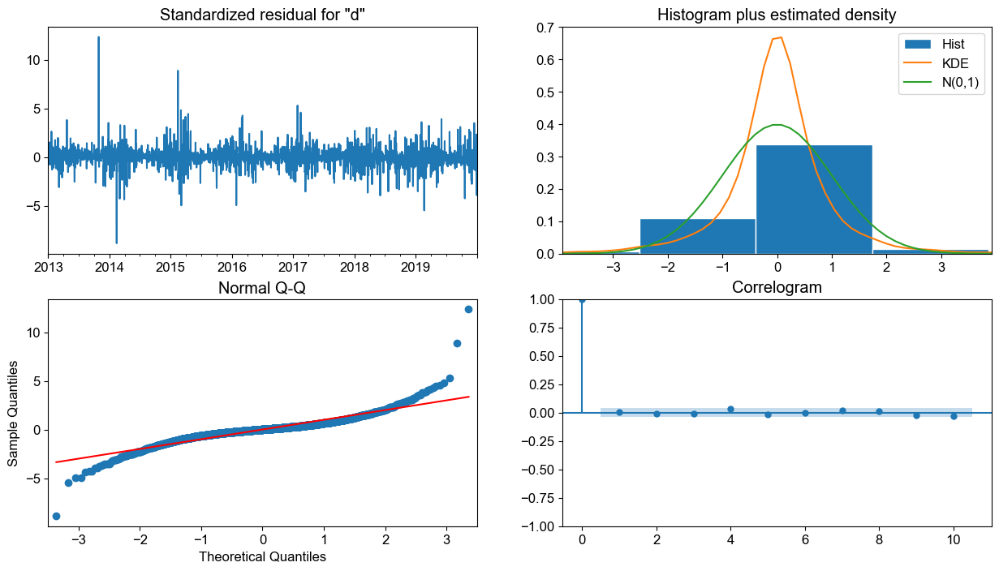

In [220]:
results.plot_diagnostics(figsize=(15,8))
print('\n')

**<span style='color: DarkRed'>We can see that the residuals are comparable to what we've seen with the previous models. Now let's go ahead and make predictions!**<span style='color: DarkRed'>

In [221]:
# getting predictions

forecast = results.get_prediction(start=0, end=len(train_data_arima)+len(test_data_arima)-1)
mean_forecast = forecast.predicted_mean
confidence_interval = forecast.conf_int()

In [222]:
# plotting difference in demand

train_idx = train_data_arima.index
test_idx = test_data_arima.index

fig = go.Figure()
fig.add_trace(go.Scatter(x=train_idx, y=train_data_arima.demand_log_diff_365, mode='lines', name="Train"))
fig.add_trace(go.Scatter(x=test_idx, y=test_data_arima.demand_log_diff_365, mode='lines', name="Test"))
fig.add_trace(go.Scatter(x=arima_data_reindexed.index, y=mean_forecast.values, mode='lines', name="Predictions"))
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(
    yaxis_title="Demand", 
    xaxis_title="Date",
    title="Change In Differenced Demand - Forecast vs Actual"
)
fig.show()

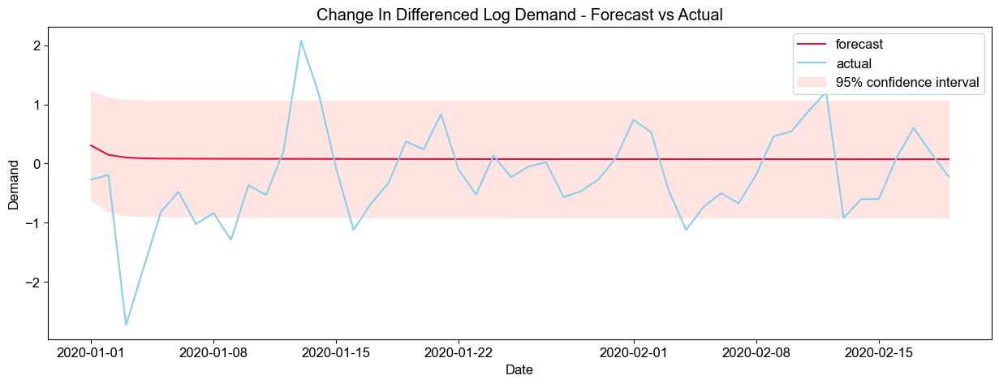

In [223]:
# taking a closer look at the test data

plt.figure(figsize=(15,5))
plt.rc('font', family="Arial", size=12)

ind_range = 50
plt.plot(test_idx[:ind_range],
        mean_forecast[test_idx[:ind_range]].values,
        color='crimson',
        label='forecast')

plt.plot(test_idx[:ind_range],
        test_data_arima.demand_log_diff_365.iloc[:ind_range],
        color='skyblue',
        label='actual')

plt.fill_between(test_idx[:ind_range],
                confidence_interval.loc[test_idx[:ind_range],'lower demand_log_diff_365'],
                confidence_interval.loc[test_idx[:ind_range], 'upper demand_log_diff_365'],
                color='mistyrose',
                label='95% confidence interval')

plt.title('Change In Differenced Log Demand - Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Demand')

plt.legend(loc='upper right')
plt.show()

In [224]:
# calculating the mean absolute percentage error
arima201_test_mape = mean_absolute_percentage_error(test_data_arima.demand_log_diff_365, mean_forecast[test_idx])
# arima107_train_mape = mean_absolute_percentage_error(train_data_arima.demand_diff_365_7, mean_forecast[train_idx])

print(f"Test MAPE on the difference: {round(arima201_test_mape, 2)}%")
# print(f"Train MAPE on the difference: {round(arima107_train_mape, 2)}%")

Test MAPE on the difference: 2.09%


**We have been looking at the differenced data so far. Let's restore to actual values and then calculate the MAPE.**

In [225]:
# slicing out the first 365 days + 7 days and the rest of the dates
first_year_indices = train_data_arima.index[:365]
remaining_indices = train_data_arima.index[365:]

# create an empty restored column
train_data_arima["restored"] = np.nan

# fill in the first 365 + 7  original values into the empty restored column
train_data_arima.loc[first_year_indices, "restored"] = \
    train_data_arima.loc[first_year_indices, "total_demand"]

# use the current difference value and the lagged restored values to get the updated restored value
for current_date in remaining_indices:
    current_value = train_data_arima.loc[current_date, "demand_log_diff_365"]
    
    inverse_restored = np.exp(current_value)
    
    year_before_restored = train_data_arima.loc[current_date - pd.DateOffset(days=365), "restored"]
    
    train_data_arima.loc[current_date, "restored"] = inverse_restored * year_before_restored

# check agreement everywhere (rounding errors can come up so check closeness rather than strict equality)
np.allclose(train_data_arima["total_demand"], train_data_arima["restored"])


True

**Great! Now that we have verified this approach on our train data, let's go ahead and implement this on our test data.**

In [226]:
# adding mean_forecast column
arima_data_reindexed['mean_forecast'] = mean_forecast

In [227]:
# slicing out the first 365 days + 7 days and the rest of the dates
train_indices = train_data_arima.index
remaining_indices = test_data_arima.index

# create an empty restored column
arima_data_reindexed["restored"] = np.nan

# fill in the original values into the empty restored column for the train data rows
arima_data_reindexed.loc[train_indices, "restored"] = \
    arima_data_reindexed.loc[train_indices, "total_demand"]

# use the current difference value and the lagged restored values to get the updated restored value
for current_date in remaining_indices:
    current_value = arima_data_reindexed.loc[current_date, "mean_forecast"]
    
    inverse_restored = np.exp(current_value)
    
    year_before_restored = arima_data_reindexed.loc[current_date - pd.DateOffset(days=365), "restored"]
    
    arima_data_reindexed.loc[current_date, "restored"] = inverse_restored * year_before_restored

**Now let's try to plot this.**

In [228]:
# plotting difference in demand

train_idx = train_data_arima.index
test_idx = test_data_arima.index

fig = go.Figure()
fig.add_trace(go.Scatter(x=train_idx, y=train_data_arima.total_demand, mode='lines', name="Train"))
fig.add_trace(go.Scatter(x=test_idx, y=test_data_arima.total_demand, mode='lines', name="Test"))
fig.add_trace(go.Scatter(x=test_idx, y=arima_data_reindexed.loc[test_idx,'restored'], mode='lines', name="Predictions"))
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(
    yaxis_title="Difference", 
    xaxis_title="Date",
    title="Change in Demand"
)
fig.show()

In [229]:
# calculating the mean absolute percentage error
arima201_test_mape = mean_absolute_percentage_error(test_data_arima.total_demand, arima_data_reindexed.loc[test_idx,'restored'])
arima201_test_rmse =np.sqrt(mean_squared_error(test_data_arima.total_demand, arima_data_reindexed.loc[test_idx,'restored']))
arima201_test_rmsle = np.sqrt(mean_squared_log_error(test_data_arima.total_demand, abs(arima_data_reindexed.loc[test_idx,'restored'])))

print(f"Test set MAPE: {round(arima201_test_mape, 2)}%")
print('\nTest set RMSE: ', arima201_test_rmse)
print('\nTest set RMSLE: ', arima201_test_rmsle)

Test set MAPE: 0.4%

Test set RMSE:  3447.908926404668

Test set RMSLE:  0.505298282287607


**<span style='color: DarkRed'>We achieve a `MAPE` of `0.4` which is higher than the previous `ARIMA(1,0,7)` model, which had an `MAPE` of `0.382%`. This error is significantly higher what we achieved with `XGBoost` (`0.178%`) and that is to be expected since ARIMA is good for short-term forecasts (as we saw in the 'Change In Differenced Log Demand - Forecast vs Actual' plot above).**<span style='color: DarkRed'>

In [230]:
# calculating the mean absolute percentage error for just the first week of forecast

# calculating the mean absolute percentage error
arima201_test_mape = mean_absolute_percentage_error(test_data_arima.total_demand[:7], arima_data_reindexed.loc[test_idx,'restored'][:7])
arima201_test_rmse =np.sqrt(mean_squared_error(test_data_arima.total_demand[:7], arima_data_reindexed.loc[test_idx,'restored'][:7]))
arima201_test_rmsle = np.sqrt(mean_squared_log_error(test_data_arima.total_demand[:7], abs(arima_data_reindexed.loc[test_idx,'restored'][:7])))

print(f"Test set MAPE for the first week of forecast: {round(arima201_test_mape, 2)}%")
print('\nTest set RMSE for the first week of forecast: ', arima201_test_rmse)
print('\nTest set RMSLE for the first week of forecast: ', arima201_test_rmsle)

Test set MAPE for the first week of forecast: 3.82%

Test set RMSE for the first week of forecast:  4781.159569274741

Test set RMSLE for the first week of forecast:  1.4255910599218042


**Let's try to figure out where the ARIMA models are performing their worst.**

In [268]:
# extracting dates based on 95 pecentile from forecasted demand - actual demand

arima_data_reindexed['prediction_error'] = arima_data_reindexed['total_demand']-arima_data_reindexed['restored']
arima_data_reindexed.tail()

,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy,demand_log_diff_365,mean_forecast,restored,prediction_error
2021-06-25,12975.0,10.29,0.00,0.0,56.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.031234,0.07236,14540.054728,-1565.054728
2021-06-26,12847.0,7.16,0.83,0.0,56.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.137822,0.07236,13034.157549,-187.157549
2021-06-27,15841.0,9.40,0.00,0.0,56.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.130353,0.07236,13787.683860,2053.316140
2021-06-28,13816.0,6.71,0.00,0.0,56.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.024175,0.07236,12525.642649,1290.357351
2021-06-29,13089.0,9.17,0.35,0.0,56.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.017495,0.07236,12287.565225,801.434775


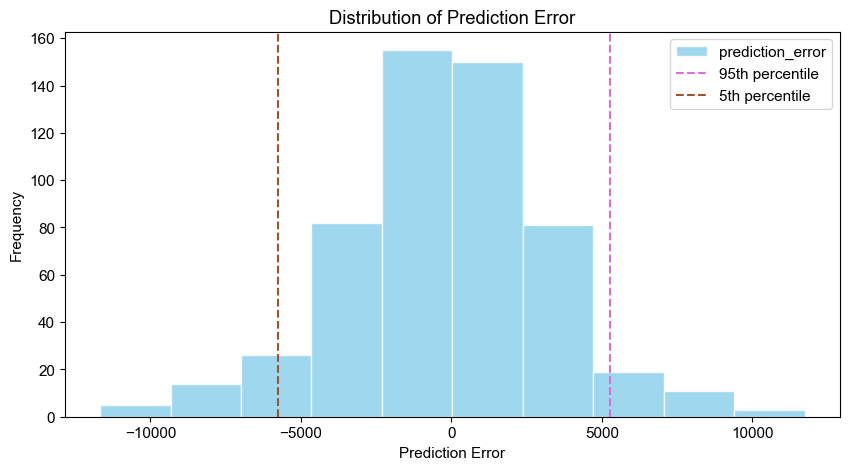

In [270]:
# plotting 

plt.rc("figure", figsize=(10, 5))
plt.rc("font", size=11)
arima_data_reindexed.loc[test_idx, 'prediction_error'].plot(kind='hist', color='skyblue', edgecolor='w', alpha=0.8)
plt.axvline(arima_data_reindexed.loc[test_idx, 'prediction_error'].quantile(0.95), c='orchid', 
            linestyle='--', label='95th percentile' )
plt.axvline(arima_data_reindexed.loc[test_idx, 'prediction_error'].quantile(0.05), c='sienna', 
            linestyle='--', label='5th percentile' )
plt.title('Distribution of Prediction Error')
plt.xlabel('Prediction Error')
plt.legend()
plt.show()

**<span style='color: DarkRed'>The range of errors is high! Let's focus on dates where the prediction errors are greater than 95th percentile or less than 5th percentile.</span>**

In [273]:
# fetching extreme prediction dates

extreme_pred_error_arima = arima_data_reindexed.loc[test_idx,:][(arima_data_reindexed.loc[test_idx, 'prediction_error']<arima_data_reindexed.loc[test_idx, 'prediction_error'].quantile(0.05))
                  | (arima_data_reindexed.loc[test_idx, 'prediction_error']>arima_data_reindexed.loc[test_idx, 'prediction_error'].quantile(0.95))]

print('Test data with extreme predictions -')

extreme_pred_error_arima.head(5)

Test data with extreme predictions -


,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy,demand_log_diff_365,mean_forecast,restored,prediction_error
2020-01-03,497.0,14.54,0.745,6.90,33.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,-2.727840,0.101526,8416.554536,-7919.554536
2020-01-04,1257.0,5.82,0.165,3.70,27.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.767604,0.088339,8041.942873,-6784.942873
2020-02-04,2541.0,13.20,0.880,0.00,55.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-1.121181,0.073759,8393.836107,-5852.836107
2020-02-12,8660.0,10.51,0.000,0.00,51.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.208989,0.073178,2781.259549,5878.740451
2020-03-11,2119.0,16.11,0.490,0.45,30.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,-1.439032,0.072485,9606.705940,-7487.705940


<Axes: >

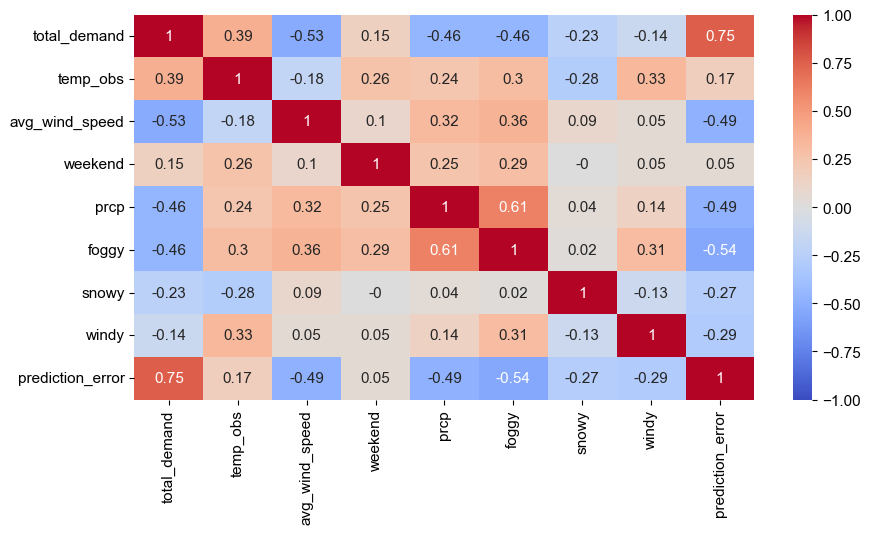

In [278]:
# let's check if there are any significant correaltions between prediction error and other features

sns.heatmap(round(extreme_pred_error_arima[[
    'total_demand', 'temp_obs', 'avg_wind_speed', 'weekend','prcp', 'foggy', 'snowy', 'windy',
    'prediction_error']].corr(),2), annot=True, vmin=-1, vmax=1, cmap='coolwarm')


**<span style='color: DarkRed'>We can clearly see a strong correlation between prediction error and the actual demand. Let's plot a scatter plot to understand this relationship better.</span>**

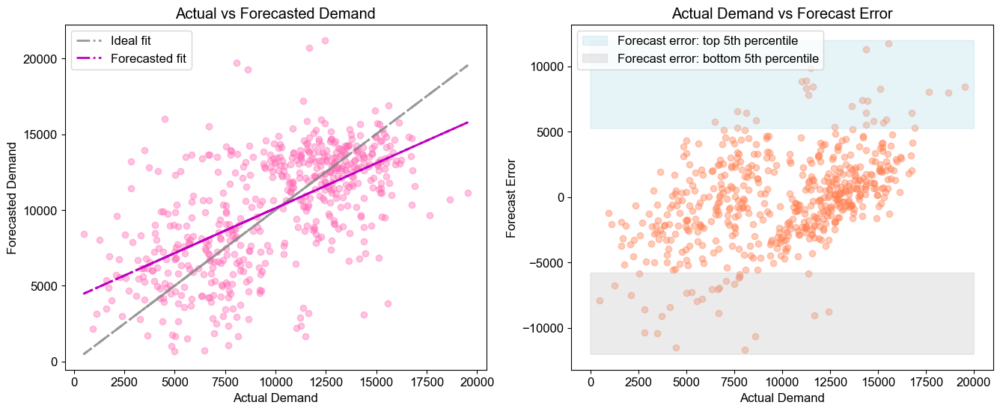

In [302]:
# plotting actual demand and prediction error

plt.rc("figure", figsize=(16, 6))
plt.rc("font", size=12)
fig, (ax1, ax2) = plt.subplots(1,2)

# plotting actual demand vs forecasted demand

ax1.scatter(x=arima_data_reindexed.loc[test_idx, 'total_demand'], y=arima_data_reindexed.loc[test_idx, 'restored'], c='hotpink', alpha=0.4)
ax1.set_title('Actual vs Forecasted Demand')
ax1.set_xlabel('Actual Demand')
ax1.set_ylabel('Forecasted Demand')
m, b = np.polyfit(arima_data_reindexed.loc[test_idx, 'total_demand'], arima_data_reindexed.loc[test_idx, 'total_demand'], 1)
ax1.plot(arima_data_reindexed.loc[test_idx, 'total_demand'], m*arima_data_reindexed.loc[test_idx, 'total_demand'] + b, c='gray', alpha=0.8,
         linestyle='-.', label='Ideal fit', linewidth=2)
mf, bf = np.polyfit(arima_data_reindexed.loc[test_idx, 'total_demand'], arima_data_reindexed.loc[test_idx, 'restored'], 1)
ax1.plot(arima_data_reindexed.loc[test_idx, 'total_demand'], mf*arima_data_reindexed.loc[test_idx, 'total_demand'] + bf, c='m', 
         linestyle='-.', label='Forecasted fit', linewidth=2)
ax1.legend()

# plotting actual demand vs forecast error

ax2.scatter(x=arima_data_reindexed.loc[test_idx, 'total_demand'], y=arima_data_reindexed.loc[test_idx, 'prediction_error'], c='coral', alpha=0.4)
ax2.set_title('Actual Demand vs Forecast Error')
ax2.set_xlabel('Actual Demand')
ax2.set_ylabel('Forecast Error')
ax2.fill_between(x=range(0,20000), y1=arima_data_reindexed.loc[test_idx, 'prediction_error'].quantile(0.95),
                y2=12000, alpha=0.3, color='lightblue', label='Forecast error: top 5th percentile')
ax2.fill_between(x=range(0,20000), y1=arima_data_reindexed.loc[test_idx, 'prediction_error'].quantile(0.05),
                y2=-12000, alpha=0.3, color='silver', label='Forecast error: bottom 5th percentile')
ax2.legend()

plt.show()

**<span style='color: DarkRed'>The first plot above highlights how the ideal fit and actual fit varies. We can see that the slope of the forecasted fit is less than ideal, which tells us that the model predicts higher than actual at lower values of true demand and lower than actual at higher values of true demand.</span>**

**<span style='color: DarkRed'>This observation is emphasized by the second plot above where we look at the forecast error against actual/true demand. We can see how the most extreme 5th percentlice errors are mostly concentrated away from the middle, towards the lower and the higher ends of actual demand.</span>**

**<span style='color: DarkRed'>This implies that our model does not generalise very well to the extreme values of demand.</span>**

**Even though XGBoost model shows the same patterns, the dispersion of values is much higher in our `ARIMA` models, making them significantly worse!**

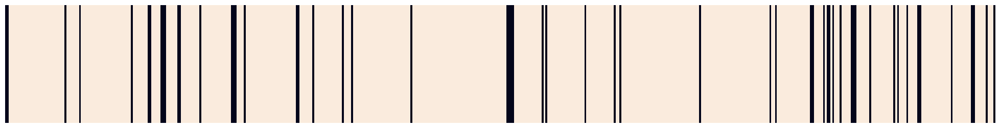

In [285]:
# let's check if there is any pattern to the dates 

full_range = pd.date_range(start=extreme_pred_error_arima.index.min(), end=extreme_pred_error_arima.index.max(), freq="D")
extreme_pred_error_arima_reindexed = extreme_pred_error_arima.reindex(full_range)

# plotting 
plt.figure(figsize=(25, 3))
sns.heatmap(extreme_pred_error_arima_reindexed.T.isna(), cbar=False)
plt.yticks([])
plt.xticks([])
plt.show()

**We don't see any huge clustering of dates here. Let's investigate further by looking at the weekend proportion in these extreme error cases.**


Observed proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors:  0.25

Expected proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors assuming no correlation between errors and weekends:  0.29


Text(0.5, 1.0, 'Proportion of Weekends in Test Data for Extreme Forecast Errors vs\nProportion of Weekends in All of Test Data')

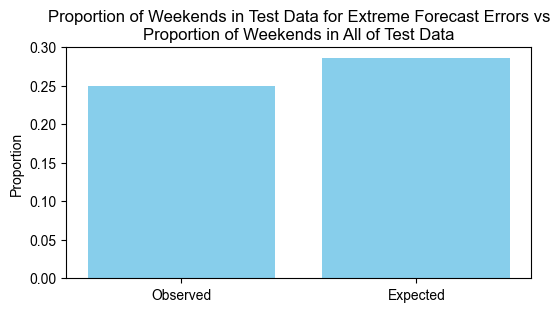

In [289]:
# calculating proportion weekends in the extreme pred error df

weekend_prop_extreme_error_arima = extreme_pred_error_arima.weekend.sum()/len(extreme_pred_error_arima)
print('\nObserved proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors: ', weekend_prop_extreme_error_arima)

# calculating expected proportion of weekend in case there is no correlation between extreme forecast errors and weekends

expected_prop_arima = test_data_arima.weekend.sum()/len(test_data_arima)
print('\nExpected proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors assuming \
no correlation between errors and weekends: ', round(expected_prop_arima,2))

plt.figure(figsize=(6,3))
plt.rc('font', family="Arial", size=10)
plt.bar(x=['Observed','Expected'], height=[weekend_prop_extreme_error_arima, expected_prop_arima], color='skyblue')
plt.ylabel('Proportion')
plt.title('Proportion of Weekends in Test Data for Extreme Forecast Errors vs\nProportion of Weekends in All of Test Data')


**There does not seem to be any significant pattern here.**


Observed proportion of foggy days in cases of extreme (top and bottom 5 percentile) forecast errors:  0.4642857142857143

Expected proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors assuming no correlation between errors and weekends:  0.34


Text(0.5, 1.0, 'Proportion of Foggy Days in Test Data for Extreme Forecast Errors vs\nProportion of Foggy Days in All of Test Data')

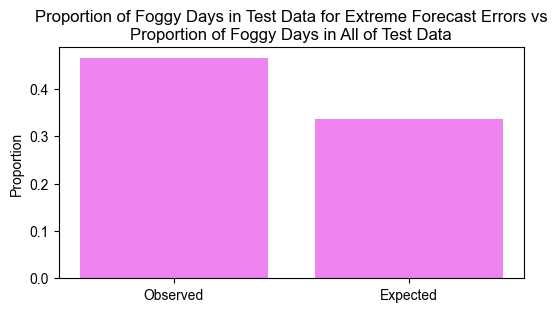

In [295]:
# calculating proportion foggy days in the extreme pred error df

foggy_prop_extreme_error_arima = extreme_pred_error_arima.foggy.sum()/len(extreme_pred_error_arima)
print('\nObserved proportion of foggy days in cases of extreme (top and bottom 5 percentile) forecast errors: ', foggy_prop_extreme_error_arima)

# calculating expected proportion of foggy days in case there is no correlation between extreme forecast errors and foggy days

expected_prop_arima = test_data_arima.foggy.sum()/len(test_data_arima)
print('\nExpected proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors assuming \
no correlation between errors and weekends: ', round(expected_prop_arima,2))

plt.figure(figsize=(6,3))
plt.rc('font', family="Arial", size=10)
plt.bar(x=['Observed','Expected'], height=[foggy_prop_extreme_error_arima, expected_prop_arima], color='violet')
plt.ylabel('Proportion')
plt.title('Proportion of Foggy Days in Test Data for Extreme Forecast Errors vs\nProportion of Foggy Days in All of Test Data')


**Let's validate this with a proportions Z-test.**

In [296]:
# Getting statistic and p-value for the hypothesis test using the data above

# these are the counts of review writing in Scenario A and B
counts = [extreme_pred_error_arima.foggy.sum(), test_data_arima.foggy.sum()]
# these are the counts of emails sent out in Scenario A and B
number_of_obs = [len(extreme_pred_error_arima), len(test_data_arima)]

# test
proportions_ztest(counts, number_of_obs)

(1.9033912192748021, 0.05698951592634561)

**<span style='color: DarkRed'>Based on the above test, this difference is not significant at a 95% confidence level, and so we can't really say that our model is doing especially poorly on foggy days.</span>**

**<span style='color: DarkRed'>With everything we've tried so far, `ARIMA` does not come close to the accuracy we have achieved with `XGBoost`. In fact, all the `ARIMA` models do worse than our baseline models!**<span style='color: DarkRed'>

**Now let's try to forecast demand with the help of SARIMAX and see if we can imrove model performance.**

<a id="2.3"></a> 
### SARIMA

**SARIMA stands for `Seasonal AutoRegressive Integrated Moving Average`. It is an extension of ARIMA that accounts for seasonal patterns in the data. The 'X' in SARIMAX implies that we can provide exogenous variables to this model as well.**

Let's start building! For this model, we'll begin by plotting the `ACF` and `PACF`. This will help us figure out what our seasonal and non-seasonal hyper-parameters should be.

In [231]:
# creating a new dataset for SARIMA with just a lag of 365
sarima_data = arima_data.copy()

# splitting into train and test
train_data_sarima = sarima_data[sarima_data.index.year<2020]
test_data_sarima = sarima_data[sarima_data.index.year>2021]

# reindexing test data to maintain continuity which was broken when we removed COVID data
new_date_index = pd.date_range(start=train_data_sarima.index.max() + pd.DateOffset(days=1),
                               periods=len(test_data_sarima), freq='D')
                               

test_data_sarima_reindexed = pd.DataFrame(data=test_data_sarima[test_data_sarima.columns].values,
                                         columns=test_data_sarima.columns,
                                         index=new_date_index)

sarima_data_reindexed = pd.concat([train_data_sarima, test_data_sarima_reindexed], axis=0)
display(sarima_data_reindexed.iloc[-548:-543])

,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy
2019-12-30,5419.0,7.61,0.533333,0.0,59.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
2019-12-31,5746.0,8.50,0.110000,0.0,42.5,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
2020-01-01,3452.0,4.70,0.295000,0.0,58.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2020-01-02,5419.0,9.62,0.285000,0.0,58.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2020-01-03,497.0,14.54,0.745000,6.9,33.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [232]:
# creating diff 365 column

sarima_data_reindexed['demand_log'] = np.log(sarima_data_reindexed.total_demand)
sarima_data_reindexed.dropna(inplace=True)
display(sarima_data_reindexed.head())

,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy,demand_log
2012-01-01,2260.0,8.72,0.00,0.0,38.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,7.723120
2012-01-02,1937.0,13.87,0.02,0.0,34.5,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.568896
2012-01-03,2219.0,15.66,0.00,0.0,28.5,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,7.704812
2012-01-04,2357.0,7.61,0.00,0.0,18.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.765145
2012-01-05,3251.0,4.92,0.00,0.0,32.5,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,8.086718


In [233]:
# splitting into train and test again after reindexing

train_data_sarima = sarima_data_reindexed[sarima_data_reindexed.index.year<2020]
test_data_sarima = sarima_data_reindexed[sarima_data_reindexed.index.year>=2020]

print(len(test_data_sarima))

546


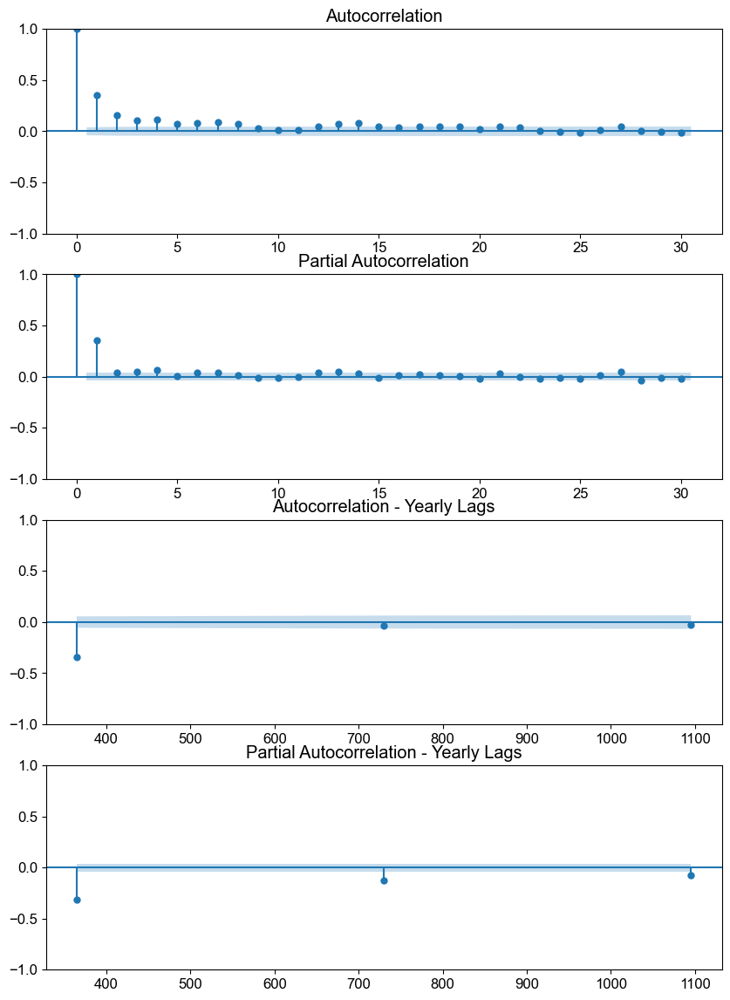

In [234]:
# plotting acf and pacf

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4,1, figsize=(10,14))
plot_acf(train_data_sarima.demand_log.diff(365).dropna(), ax=ax1, lags=30)
plot_pacf(train_data_sarima.demand_log.diff(365).dropna(), ax=ax2, lags=30)

lags = [365, 365*2, 365*3]

plot_acf(train_data_sarima.demand_log.diff(365).dropna(), ax=ax3, lags=lags, title='Autocorrelation - Yearly Lags')
plot_pacf(train_data_sarima.demand_log.diff(365).dropna(), ax=ax4, lags=lags, title='Partial Autocorrelation - Yearly Lags')

plt.show()

**Based on the above `ACF` and `PACF` plots, we have an initial estimate of our parameters. We see that there is only one significant spike in the seasonal `ACF` at lag 1 and the seasonal `PACF` tails off. This tells us that our seasonal hyper-parameters are (0,0,1,365). Let's go ahead and find the optimal non-seasonal p,q parameters around our initial estimates.**

In [235]:
# # Create empty list to store search results
# order_aic_bic=[]

# # Loop over p values from 0-2
# for p in range(3):
#     # Loop over q values from 0-2
#     for q in range(3):    
#         try:
#             # create and fit ARMA(p,q) model
#             model = SARIMAX(train_data_sarima.demand_log, order=(p, 0, q), seasonal_order=(0,0,1,365), trend="t")
#             results = model.fit()
            
#             # Append order and results tuple
#             order_aic_bic.append((p,q,results.aic,results.bic))
            
#         except:
#             # Append order and results tuple
#             order_aic_bic.append((p,q,None,None))

**The above process keeps failing (tried using cloud compute as well!).**

**It also seems that (S)ARIMA has major problems with "long" seasonality, e.g., daily data with yearly seasonality, as experienced by [other](https://robjhyndman.com/hyndsight/longseasonality/) people as well.**

**For our use case, it might be better to remove yearly seasonality and try again.**

In [236]:
# differencing the log of total_demand

sarima_data_reindexed['demand_log_diff_365'] = sarima_data_reindexed.demand_log.diff(365)
sarima_data_reindexed.dropna(inplace=True)
sarima_data_reindexed.head()

,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy,demand_log,demand_log_diff_365
2012-12-31,2711.0,6.49,0.0,0.0,33.5,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,7.905073,0.181953
2013-01-01,1964.0,6.04,0.0,0.0,39.5,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.582738,0.013843
2013-01-02,3673.0,9.17,0.0,0.0,33.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.208764,0.503952
2013-01-03,3844.0,6.04,0.0,0.0,27.5,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.254269,0.489124
2013-01-04,4078.0,7.61,0.0,0.0,28.5,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.313362,0.226644


In [237]:
# splitting into train and test again after reindexing

train_data_sarima = sarima_data_reindexed[sarima_data_reindexed.index.year<2020]
test_data_sarima = sarima_data_reindexed[sarima_data_reindexed.index.year>=2020]

print(len(test_data_sarima))

546


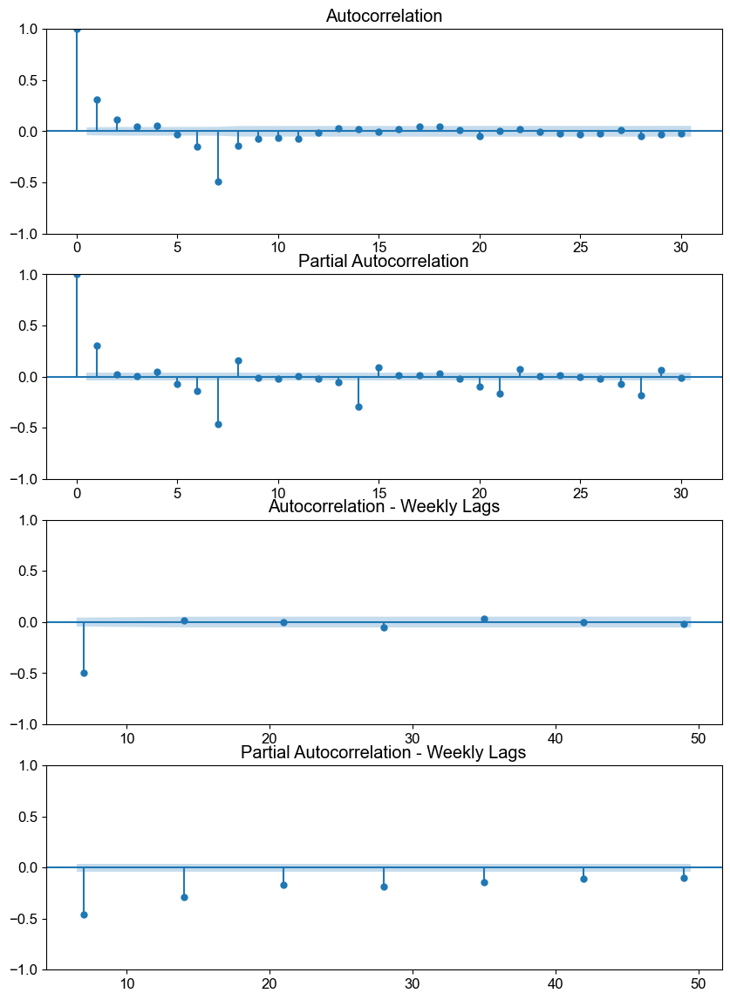

In [238]:
# plotting acf and pacf

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4,1, figsize=(10,14))
plot_acf(train_data_sarima.demand_log_diff_365.diff(7).dropna(), ax=ax1, lags=30)
plot_pacf(train_data_sarima.demand_log_diff_365.diff(7).dropna(), ax=ax2, lags=30)

lags = [7,14,21,28,35,42,49]

plot_acf(train_data_sarima.demand_log_diff_365.diff(7).dropna(), ax=ax3, lags=lags, title='Autocorrelation - Weekly Lags')
plot_pacf(train_data_sarima.demand_log_diff_365.diff(7).dropna(), ax=ax4, lags=lags, title='Partial Autocorrelation - Weekly Lags')

plt.show()

In [239]:
# Create empty list to store search results
order_aic_bic=[]

# Loop over p values from 0-7
for p in range(8):
    # Loop over q values from 0-7
    for q in range(8):    
        try:
            # create and fit ARMA(p,q) model
            model = SARIMAX(train_data_sarima.demand_log_diff_365, order=(p, 0, q), seasonal_order=(0,0,1,7), trend="t")
            results = model.fit()
            
            # Append order and results tuple
            order_aic_bic.append((p,q,results.aic,results.bic))
            
        except:
            # Append order and results tuple
            order_aic_bic.append((p,q,None,None))

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.35826D-01    |proj g|=  3.69809D+01


 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      1     21      1     0     0   3.698D+01   7.358D-01
  F =  0.73582618056089522     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.79690D-01    |proj g|=  6.99174D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      1     15      1     0     0   2.570D+00   6.706D-01
  F =  0.67062450782912264     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            6     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.69915D-01    |proj g|=  1.06362D+00



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    6      1     21      1     0     0   1.064D+00   6.699D-01
  F =  0.66991510976790614     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.65850D-01    |proj g|=  5.94930D-01


 This problem is unconstrained.



At iterate    5    f=  6.65846D-01    |proj g|=  2.52076D-01

At iterate   10    f=  6.65827D-01    |proj g|=  3.64387D+00

At iterate   15    f=  6.65662D-01    |proj g|=  1.37623D+01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7     17     61      2     0     0   1.266D+01   6.657D-01
  F =  0.66566154820390333     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.65129D-01    |proj g|=  2.07029D+00

At iterate    5    f=  6.65117D-01    |proj g|=  2.61751D-01

At iterate   10    f=  6.65095D-01    |proj g|=  4.02964D+00

At iterate   15    f=  6.64947D-01    |proj g|=  1.01833D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     16     37      1     0     0   1.018D+01   6.649D-01
  F =  0.66494680944079421     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.63431D-01    |proj g|=  2.28357D+00

At iterate    5    f=  6.63417D-01    |proj g|=  2.15429D-01

At iterate   10    f=  6.63400D-01    |proj g|=  3.22300D+00

At iterate   15    f=  6.63309D-01    |proj g|=  9.75056D+00



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     16     58      2     0     0   9.751D+00   6.633D-01
  F =  0.66330886553136603     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.68058D-01    |proj g|=  4.24409D+01


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4      1     21      1     0     0   4.244D+01   6.681D-01
  F =  0.66805804142816305     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.66656D-01    |proj g|=  7.59705D+01



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     57      2     0     0   5.875D+01   6.666D-01
  F =  0.66664334224529198     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            6     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.64634D-01    |proj g|=  4.06110D+02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    6      4     53      2     0     0   2.057D+02   6.642D-01
  F =  0.66415754720343534     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.68789D-01    |proj g|=  2.96649D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7      2     16      1     0     0   8.899D-02   6.662D-01
  F =  0.66617465712201518     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.63889D-01    |proj g|=  4.12939D+02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8      4     58      2     0     0   2.220D+02   6.635D-01
  F =  0.66347836858992326     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.64719D-01    |proj g|=  1.39677D+03


 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9      2     19      1     0     0   4.190D-02   6.642D-01
  F =  0.66416891843831338     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.74705D-01    |proj g|=  7.08286D+03



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   10      2     18      1     0     0   2.124D-01   6.692D-01
  F =  0.66922063925821795     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.67033D-01    |proj g|=  4.24533D+01


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      1     21      1     0     0   4.245D+01   6.670D-01
  F =  0.66703315451249245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            6     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.40918D-01    |proj g|=  1.65051D+01



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    6      2     23      1     0     0   4.088D-01   7.408D-01
  F =  0.74081901398903161     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.64672D-01    |proj g|=  4.68718D+02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7      2     43      2     0     0   5.831D-02   6.647D-01
  F =  0.66466459758776530     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.63907D-01    |proj g|=  6.86836D+02


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8      2     43      2     0     0   8.315D-02   6.638D-01
  F =  0.66380154897715549     

ABNORMAL_TERMINATION_IN_LNSRCH                              


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.63708D-01    |proj g|=  3.82071D+02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9      4     55      2     0     0   2.077D+02   6.633D-01
  F =  0.66334366065562078     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.66642D-01    |proj g|=  2.34821D+03


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   10      2     18      1     0     0   7.044D-02   6.652D-01
  F =  0.66520891738367638     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.74968D-01    |proj g|=  7.09305D+03


 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11      2     20      1     0     0   2.127D-01   6.695D-01
  F =  0.66949727420461358     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            6     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.65948D-01    |proj g|=  4.25281D+01


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    6      1     21      1     0     0   4.253D+01   6.659D-01
  F =  0.66594770080374777     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.66566D-01    |proj g|=  2.17702D+01



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7      1     21      1     0     0   2.177D+01   6.666D-01
  F =  0.66656596868144413     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.66446D-01    |proj g|=  1.57435D+03



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8      2     43      2     0     0   5.111D-02   6.652D-01
  F =  0.66517487963761746     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.63705D-01    |proj g|=  4.83518D+02


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9      4     53      2     0     0   2.446D+02   6.631D-01
  F =  0.66313432487634905     

ABNORMAL_TERMINATION_IN_LNSRCH                              


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.63589D-01    |proj g|=  2.66695D+02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   10      3     46      2     0     0   1.511D+02   6.634D-01
  F =  0.66338651717233132     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.64335D-01    |proj g|=  1.23613D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11      2     20      1     0     0   4.746D-02   6.639D-01
  F =  0.66392043088398167     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           12     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.73972D-01    |proj g|=  6.58965D+03



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   12      2     43      2     0     0   1.976D-01   6.690D-01
  F =  0.66899563212027791     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.63486D-01    |proj g|=  4.26788D+01


 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7      1     21      1     0     0   4.268D+01   6.635D-01
  F =  0.66348550150659680     

ABNORMAL_TERMINATION_IN_LNSRCH                              


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.63557D-01    |proj g|=  2.19046D+01



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8      1     21      1     0     0   2.190D+01   6.636D-01
  F =  0.66355743750534202     

ABNORMAL_TERMINATION_IN_LNSRCH                              


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.63113D-01    |proj g|=  1.79133D+02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9      3     46      2     0     0   1.040D+02   6.630D-01
  F =  0.66299837675860651     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.63698D-01    |proj g|=  4.85619D+02


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   10      4     53      2     0     0   2.455D+02   6.631D-01
  F =  0.66312259168067167     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.63945D-01    |proj g|=  6.06271D+02


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11      4     53      2     0     0   3.064D+02   6.632D-01
  F =  0.66322588550552763     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           12     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.62000D-01    |proj g|=  2.67253D+02


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   12      3     46      2     0     0   1.513D+02   6.618D-01
  F =  0.66179551697285444     

ABNORMAL_TERMINATION_IN_LNSRCH                              


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.65107D-01    |proj g|=  2.14213D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      2     15      1     0     0   6.426D-02   6.642D-01
  F =  0.66417848169668758     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.63529D-01    |proj g|=  4.26152D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8      1     21      1     0     0   4.262D+01   6.635D-01
  F =  0.66352945943950981     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.63509D-01    |proj g|=  2.19075D+01



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9      1     20      1     0     0   2.191D+01   6.635D-01
  F =  0.66350861677900430     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.62889D-01    |proj g|=  4.06170D+02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   10      4     53      2     0     0   2.057D+02   6.624D-01
  F =  0.66241138370709585     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.41763D-01    |proj g|=  3.12075D+01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11      2     43      2     0     0   4.128D-01   7.415D-01
  F =  0.74154918688761684     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           12     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.62851D-01    |proj g|=  4.92384D+02


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   12      4     53      2     0     0   2.535D+02   6.623D-01
  F =  0.66231640606752529     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.41692D-01    |proj g|=  3.25739D+01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      2     43      2     0     0   4.123D-01   7.415D-01
  F =  0.74146630340325492     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           14     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.62931D-01    |proj g|=  2.91403D+02


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   14      3     46      2     0     0   1.649D+02   6.627D-01
  F =  0.66270808208718479     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.63576D-01    |proj g|=  4.26379D+01


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9      1     21      1     0     0   4.264D+01   6.636D-01
  F =  0.66357603470696502     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.63391D-01    |proj g|=  2.18897D+01


 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   10      1     21      1     0     0   2.189D+01   6.634D-01
  F =  0.66339096293217692     

ABNORMAL_TERMINATION_IN_LNSRCH                              


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.63455D-01    |proj g|=  2.00326D+01



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11      1     21      1     0     0   2.003D+01   6.635D-01
  F =  0.66345509933273883     

ABNORMAL_TERMINATION_IN_LNSRCH                              


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           12     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.41762D-01    |proj g|=  3.11791D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   12      2     22      1     0     0   4.128D-01   7.415D-01
  F =  0.74154924509436404     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.64038D-01    |proj g|=  1.67592D+02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      3     46      2     0     0   1.003D+02   6.640D-01
  F =  0.66395603453009278     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           14     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.41722D-01    |proj g|=  3.37010D+01


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   14      2     42      2     0     0   4.124D-01   7.415D-01
  F =  0.74148686154419263     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           15     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.64174D-01    |proj g|=  9.07974D+01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   15      3     51      2     0     0   6.863D+01   6.642D-01
  F =  0.66415780837948446     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.65469D-01    |proj g|=  4.26732D+01


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   10      1     21      1     0     0   4.267D+01   6.655D-01
  F =  0.66546850780387456     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.65311D-01    |proj g|=  2.20006D+01



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11      1     21      1     0     0   2.200D+01   6.653D-01
  F =  0.66531107634369535     

ABNORMAL_TERMINATION_IN_LNSRCH                              


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           12     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.65367D-01    |proj g|=  2.00353D+01



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   12      1     21      1     0     0   2.004D+01   6.654D-01
  F =  0.66536704687750747     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.65182D-01    |proj g|=  8.26810D+01


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13      3     54      2     0     0   6.423D+01   6.652D-01
  F =  0.66516838066759243     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           14     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.41893D-01    |proj g|=  3.44695D+01


 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   14      2     18      1     0     0   4.133D-01   7.417D-01
  F =  0.74165048616339346     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           15     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.41802D-01    |proj g|=  3.41092D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   15      2     21      1     0     0   4.128D-01   7.416D-01
  F =  0.74156286319398290     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           16     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.42103D-01    |proj g|=  3.72287D+01



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   16      2     19      1     0     0   4.143D-01   7.418D-01
  F =  0.74183613362459422     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


In [240]:
# Construct DataFrame from order_aic_bic
order_df = pd.DataFrame(order_aic_bic, 
                        columns=['p', 'q', 'AIC', 'BIC'])

# Print order_df in order of increasing AIC
# since we want a model with high predictive power than high explainability, we'll choose a model based on lowest AIC
print(order_df.sort_values(by='AIC', axis=0).head(10))

# Print order_df in order of increasing BIC
# print(order_df.sort_values(by='BIC', axis=0))

    p  q          AIC          BIC
32  4  0  3407.064855  3447.990985
42  5  2  3407.571816  3466.037716
37  4  5  3408.422274  3478.581354
10  1  2  3408.501696  3443.581236
34  4  2  3408.573699  3461.193009
12  1  4  3409.028377  3455.801097
27  3  3  3409.268937  3461.888247
40  5  0  3409.289656  3456.062375
33  4  1  3409.432735  3456.205455
6   0  6  3410.161538  3462.780848


In [241]:
# fitting SARIMA((4,0,0), (0,0,1,7)) model

model = SARIMAX(train_data_sarima.demand_log_diff_365, order=(4,0,0), seasonal_order=(0,0,1,7), trend='c')
results = model.fit()
results.summary()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.60683D-01    |proj g|=  3.07751D-02


 This problem is unconstrained.



At iterate    5    f=  6.60228D-01    |proj g|=  1.64718D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7      7     12      1     0     0   2.165D-05   6.602D-01
  F =  0.66022768360488537     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                 demand_log_diff_365   No. Observations:                 2557
Model:             SARIMAX(4, 0, 0)x(0, 0, [1], 7)   Log Likelihood               -1688.202
Date:                             Mon, 04 Sep 2023   AIC                           3390.404
Time:                                     22:11:08   BIC                           3431.331
Sample:                                 12-31-2012   HQIC                          3405.245
                                      - 12-31-2019                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0403      0.010      4.099      0.000       0.021       0.060
ar.L1          0.3304      0.017     20.011      0.000       0.298       0.363
ar.L2          0.0228      0.018      1.260      0.207      -0.013       0.058
ar.L3          0.0204      0.022      0.941      0.346      -0.022       0.063
ar.L4          0.0654      0.018      3.655      0.000       0.030       0.101
ma.S.L7        0.0422      0.019      2.267      0.023       0.006       0.079
sigma2         0.2193      0.002    103.667      0.000       0.215       0.223
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):             30941.73
Prob(Q):                              1.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.79   Skew:                             0.60
Prob(H) (two-sided):                  0.00   Kurtosis:                        20.00
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

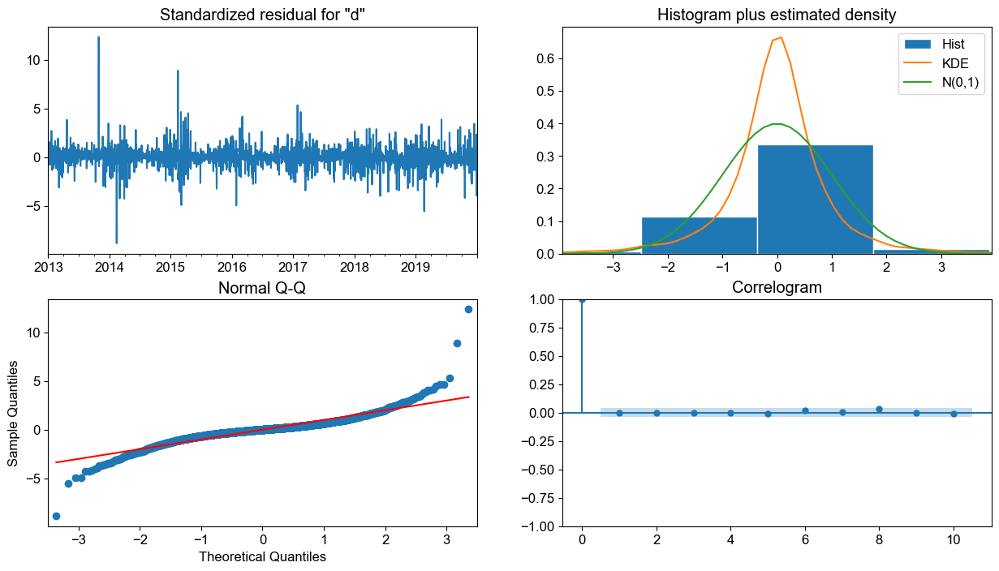

In [242]:
results.plot_diagnostics(figsize=(15,8))
print('\n')

In [243]:
# getting predictions

forecast = results.get_prediction(start=0, end=len(train_data_sarima)+len(test_data_sarima)-1)
mean_forecast = forecast.predicted_mean
confidence_interval = forecast.conf_int()

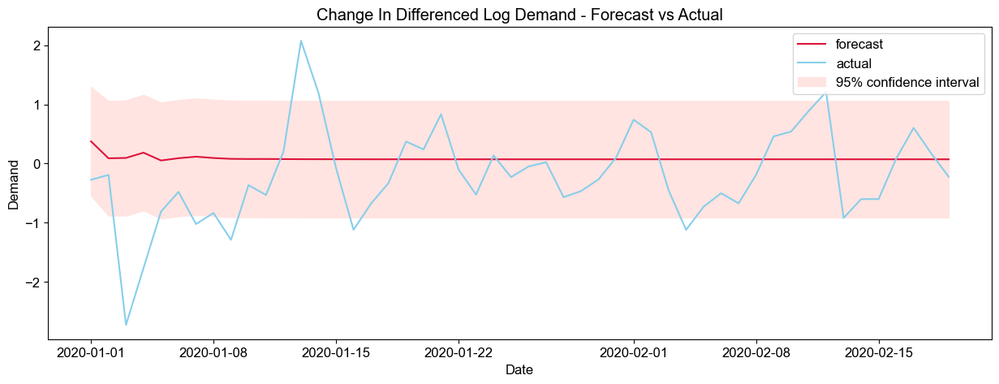

In [244]:
# taking a closer look at the test data
test_idx = test_data_sarima.index

plt.figure(figsize=(15,5))
plt.rc('font', family="Arial", size=12)

ind_range = 50
plt.plot(test_idx[:ind_range],
        mean_forecast[test_idx[:ind_range]].values,
        color='crimson',
        label='forecast')

plt.plot(test_idx[:ind_range],
        test_data_sarima.demand_log_diff_365.iloc[:ind_range],
        color='skyblue',
        label='actual')

plt.fill_between(test_idx[:ind_range],
                confidence_interval.loc[test_idx[:ind_range],'lower demand_log_diff_365'],
                confidence_interval.loc[test_idx[:ind_range], 'upper demand_log_diff_365'],
                color='mistyrose',
                label='95% confidence interval')

plt.title('Change In Differenced Log Demand - Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Demand')

plt.legend(loc='upper right')
plt.show()

**Let's look at the `MAPE` on this differenced log demand forecast.**

In [245]:
# calculating the mean absolute percentage error
sarima400_0017_test_mape = mean_absolute_percentage_error(test_data_sarima.demand_log_diff_365, mean_forecast[test_idx])

print(f"Test MAPE on the differenced log demand: {round(sarima400_0017_test_mape, 2)}%")

Test MAPE on the differenced log demand: 2.08%


**We have been looking at the differenced data so far. Let's restore to actual values and then calculate the MAPE.**

In [246]:
# slicing out the first 365 days and the rest of the dates
first_year_indices = train_data_sarima.index[:365]
remaining_indices = train_data_sarima.index[365:]

# create an empty restored column
train_data_sarima["restored"] = np.nan

# fill in the first 365 + 7  original values into the empty restored column
train_data_sarima.loc[first_year_indices, "restored"] = \
    train_data_sarima.loc[first_year_indices, "total_demand"]

# use the current difference value and the lagged restored values to get the updated restored value
for current_date in remaining_indices:
    current_value = train_data_sarima.loc[current_date, "demand_log_diff_365"]
    
    inverse_restored = np.exp(current_value)
    
    year_before_restored = train_data_sarima.loc[current_date - pd.DateOffset(days=365), "restored"]
    
    train_data_sarima.loc[current_date, "restored"] = inverse_restored * year_before_restored

# check agreement everywhere (rounding errors can come up so check closeness rather than strict equality)
np.allclose(train_data_sarima["total_demand"], train_data_sarima["restored"])


True

**Great! Now that we have verified this approach on our train data, let's go ahead and implement this on our test data.**

In [247]:
# adding mean_forecast column
sarima_data_reindexed['mean_forecast'] = mean_forecast

In [248]:
# slicing out the first 365 days + 7 days and the rest of the dates
train_indices = train_data_sarima.index
remaining_indices = test_data_sarima.index

# create an empty restored column
sarima_data_reindexed["restored"] = np.nan

# fill in the original values into the empty restored column for the train data rows
sarima_data_reindexed.loc[train_indices, "restored"] = \
    sarima_data_reindexed.loc[train_indices, "total_demand"]

# use the current difference value and the lagged restored values to get the updated restored value
for current_date in remaining_indices:
    current_value = sarima_data_reindexed.loc[current_date, "mean_forecast"]
    
    inverse_restored = np.exp(current_value)
    
    year_before_restored = sarima_data_reindexed.loc[current_date - pd.DateOffset(days=365), "restored"]
    
    sarima_data_reindexed.loc[current_date, "restored"] = inverse_restored * year_before_restored

**Now let's try to plot this.**

In [249]:
# plotting difference in demand

train_idx = train_data_sarima.index
test_idx = test_data_sarima.index

fig = go.Figure()
fig.add_trace(go.Scatter(x=train_idx, y=train_data_sarima.total_demand, mode='lines', name="Train"))
fig.add_trace(go.Scatter(x=test_idx, y=test_data_sarima.total_demand, mode='lines', name="Test"))
fig.add_trace(go.Scatter(x=test_idx, y=sarima_data_reindexed.loc[test_idx,'restored'], mode='lines', name="Predictions"))
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(
    yaxis_title="Difference", 
    xaxis_title="Date",
    title="Change in Demand"
)
fig.show()

In [250]:
# calculating the mean absolute percentage error
sarima400_0017_test_mape = mean_absolute_percentage_error(test_data_sarima.total_demand, sarima_data_reindexed.loc[test_idx,'restored'])
sarima400_0017_test_rmse =np.sqrt(mean_squared_error(test_data_sarima.total_demand, sarima_data_reindexed.loc[test_idx,'restored']))
sarima400_0017_test_rmsle = np.sqrt(mean_squared_log_error(test_data_sarima.total_demand, abs(sarima_data_reindexed.loc[test_idx,'restored'])))

print(f"Test set MAPE: {round(sarima400_0017_test_mape, 2)}%")
print('\nTest set RMSE: ', sarima400_0017_test_rmse)
print('\nTest set RMSLE: ', sarima400_0017_test_rmsle)

Test set MAPE: 0.4%

Test set RMSE:  3451.3515383757262

Test set RMSLE:  0.5063103350261562


In [251]:
# calculating the mean absolute percentage error
sarima400_0017_test_mape = mean_absolute_percentage_error(test_data_sarima.total_demand[:7], sarima_data_reindexed.loc[test_idx,'restored'][:7])
sarima400_0017_test_rmse =np.sqrt(mean_squared_error(test_data_sarima.total_demand[:7], sarima_data_reindexed.loc[test_idx,'restored'][:7]))
sarima400_0017_test_rmsle = np.sqrt(mean_squared_log_error(test_data_sarima.total_demand[:7], abs(sarima_data_reindexed.loc[test_idx,'restored'][:7])))

print(f"Test set MAPE for the first week of forecast: {round(sarima400_0017_test_mape, 2)}%")
print('\nTest set RMSE for the first week of forecast: ', sarima400_0017_test_rmse)
print('\nTest set RMSLE for the first week of forecast: ', sarima400_0017_test_rmsle)

Test set MAPE for the first week of forecast: 3.91%

Test set RMSE for the first week of forecast:  4970.679839695455

Test set RMSLE for the first week of forecast:  1.445617053832053


**<span style='color: DarkRed'>We achieve a `MAPE` of `0.4` which is same as `ARIMA(2,0,1)` and higher than `ARIMA(1,0,7)`, which had an `MAPE` of `0.382%`. This error is significantly higher what we achieved with `XGBoost` (`0.178%`) and that is to be expected since (S)ARIMA is good for short-term forecasts (as we saw in the 'Change In Differenced Log Demand - Forecast vs Actual' plot above).**<span style='color: DarkRed'>

**Finally, let's try a `SARIMAX` model with `weekend` as the exogenous variable.**

In [252]:
# fitting SARIMA((4,0,0), (0,0,1,7)) model

model = SARIMAX(train_data_sarima.demand_log_diff_365, order=(4,0,0), seasonal_order=(0,0,1,7), trend='c', 
                exog=(train_data_sarima.weekend))
results = model.fit()
results.summary()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.59445D-01    |proj g|=  8.72079D-02


 This problem is unconstrained.



At iterate    5    f=  6.53874D-01    |proj g|=  1.75689D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8      9     12      1     0     0   2.972D-06   6.539D-01
  F =  0.65386982230894419     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                 demand_log_diff_365   No. Observations:                 2557
Model:             SARIMAX(4, 0, 0)x(0, 0, [1], 7)   Log Likelihood               -1671.945
Date:                             Mon, 04 Sep 2023   AIC                           3359.890
Time:                                     22:11:12   BIC                           3406.663
Sample:                                 12-31-2012   HQIC                          3376.852
                                      - 12-31-2019                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0590      0.011      5.584      0.000       0.038       0.080
weekend       -0.1215      0.022     -5.567      0.000      -0.164      -0.079
ar.L1          0.3304      0.017     19.642      0.000       0.297       0.363
ar.L2          0.0279      0.018      1.530      0.126      -0.008       0.064
ar.L3          0.0208      0.021      0.980      0.327      -0.021       0.062
ar.L4          0.0677      0.018      3.810      0.000       0.033       0.103
ma.S.L7        0.0306      0.019      1.615      0.106      -0.007       0.068
sigma2         0.2165      0.002    103.902      0.000       0.212       0.221
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):             31558.49
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               0.77   Skew:                             0.62
Prob(H) (two-sided):                  0.00   Kurtosis:                        20.17
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

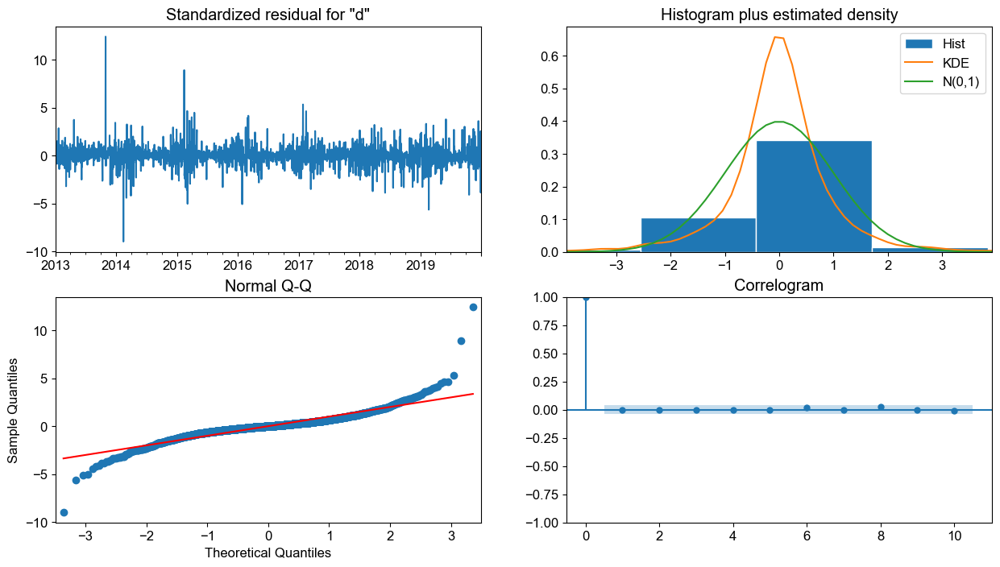

In [253]:
results.plot_diagnostics(figsize=(15,8))
print('\n')

In [254]:
# getting predictions

forecast = results.get_prediction(start=0, end=len(train_data_sarima)+len(test_data_sarima)-1, exog=test_data_sarima.weekend)
mean_forecast = forecast.predicted_mean
confidence_interval = forecast.conf_int()

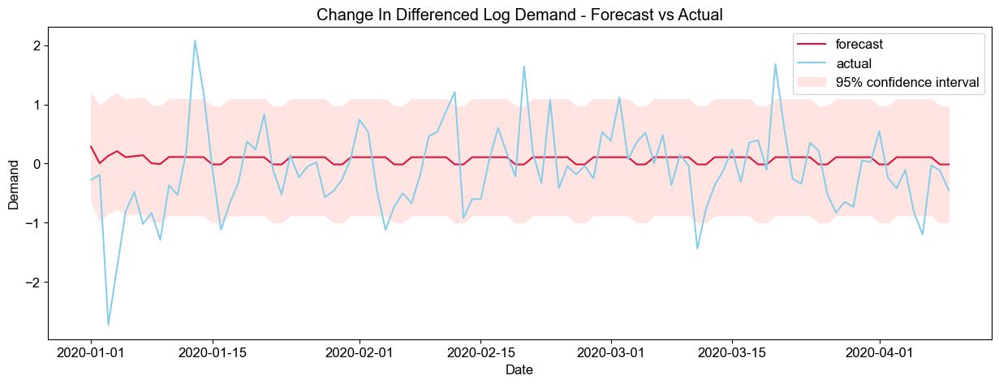

In [255]:
# taking a closer look at the test data
test_idx = test_data_sarima.index

plt.figure(figsize=(15,5))
plt.rc('font', family="Arial", size=12)

ind_range = 100
plt.plot(test_idx[:ind_range],
        mean_forecast[test_idx[:ind_range]].values,
        color='crimson',
        label='forecast')

plt.plot(test_idx[:ind_range],
        test_data_sarima.demand_log_diff_365.iloc[:ind_range],
        color='skyblue',
        label='actual')

plt.fill_between(test_idx[:ind_range],
                confidence_interval.loc[test_idx[:ind_range],'lower demand_log_diff_365'],
                confidence_interval.loc[test_idx[:ind_range], 'upper demand_log_diff_365'],
                color='mistyrose',
                label='95% confidence interval')

plt.title('Change In Differenced Log Demand - Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Demand')

plt.legend(loc='upper right')
plt.show()

In [256]:
# calculating the mean absolute percentage error
sarima400_0017_exog_test_mape = mean_absolute_percentage_error(test_data_sarima.demand_log_diff_365, mean_forecast[test_idx])

print(f"Test MAPE on the differenced log demand: {round(sarima400_0017_exog_test_mape, 2)}%")

Test MAPE on the differenced log demand: 1.94%


**We have been looking at the differenced data so far. Let's restore to actual values and then calculate the MAPE.**

In [257]:
# adding mean_forecast column
sarima_data_reindexed['mean_forecast'] = mean_forecast

In [258]:
# slicing out the first 365 days + 7 days and the rest of the dates
train_indices = train_data_sarima.index
remaining_indices = test_data_sarima.index

# create an empty restored column
sarima_data_reindexed["restored"] = np.nan

# fill in the original values into the empty restored column for the train data rows
sarima_data_reindexed.loc[train_indices, "restored"] = \
    sarima_data_reindexed.loc[train_indices, "total_demand"]

# use the current difference value and the lagged restored values to get the updated restored value
for current_date in remaining_indices:
    current_value = sarima_data_reindexed.loc[current_date, "mean_forecast"]
    
    inverse_restored = np.exp(current_value)
    
    year_before_restored = sarima_data_reindexed.loc[current_date - pd.DateOffset(days=365), "restored"]
    
    sarima_data_reindexed.loc[current_date, "restored"] = inverse_restored * year_before_restored

**Now let's try to plot this.**

In [259]:
# plotting difference in demand

train_idx = train_data_sarima.index
test_idx = test_data_sarima.index

fig = go.Figure()
fig.add_trace(go.Scatter(x=train_idx, y=train_data_sarima.total_demand, mode='lines', name="Train"))
fig.add_trace(go.Scatter(x=test_idx, y=test_data_sarima.total_demand, mode='lines', name="Test"))
fig.add_trace(go.Scatter(x=test_idx, y=sarima_data_reindexed.loc[test_idx,'restored'], mode='lines', name="Predictions"))
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(
    yaxis_title="Difference", 
    xaxis_title="Date",
    title="Change in Demand"
)
fig.show()

In [260]:
# calculating the mean absolute percentage error
sarima400_0017_exog_test_mape = mean_absolute_percentage_error(test_data_sarima.total_demand, sarima_data_reindexed.loc[test_idx,'restored'])
sarima400_0017_exog_test_rmse =np.sqrt(mean_squared_error(test_data_sarima.total_demand, sarima_data_reindexed.loc[test_idx,'restored']))
sarima400_0017_exog_test_rmsle = np.sqrt(mean_squared_log_error(test_data_sarima.total_demand, abs(sarima_data_reindexed.loc[test_idx,'restored'])))

print(f"Test set MAPE: {round(sarima400_0017_exog_test_mape, 2)}%")
print('\nTest set RMSE: ', sarima400_0017_exog_test_rmse)
print('\nTest set RMSLE: ', sarima400_0017_exog_test_rmsle)

Test set MAPE: 0.4%

Test set RMSE:  3526.952910374031

Test set RMSLE:  0.5025261823110347


**<span style='color: DarkRed'>We achieve a `MAPE` of `0.4` which is same as ARIMA(2,0,1) and higher than ARIMA(1,0,7), which had an `MAPE` of `0.382%`. This error is significantly higher what we achieved with `XGBoost` (`0.178%`) and that is to be expected since (S)ARIMA is good for short-term forecasts (as we saw in the 'Change In Differenced Log Demand - Forecast vs Actual' plot above).**<span style='color: DarkRed'>

In [261]:
# calculating the mean absolute percentage error
sarima400_0017_exog_test_mape = mean_absolute_percentage_error(test_data_sarima.total_demand[:7], sarima_data_reindexed.loc[test_idx,'restored'][:7])
sarima400_0017_exog_test_rmse =np.sqrt(mean_squared_error(test_data_sarima.total_demand[:7], sarima_data_reindexed.loc[test_idx,'restored'][:7]))
sarima400_0017_exog_test_rmsle = np.sqrt(mean_squared_log_error(test_data_sarima.total_demand[:7], abs(sarima_data_reindexed.loc[test_idx,'restored'][:7])))

print(f"Test set MAPE for the first week of forecast: {round(sarima400_0017_exog_test_mape, 2)}%")
print('\nTest set RMSE for the first week of forecast: ', sarima400_0017_exog_test_rmse)
print('\nTest set RMSLE for the first week of forecast: ', sarima400_0017_exog_test_rmsle)

Test set MAPE for the first week of forecast: 4.02%

Test set RMSE for the first week of forecast:  5090.58879968693

Test set RMSLE for the first week of forecast:  1.4627456133231176


**These values are, again, worse than the last model we tried!**

**Let's do a deeper dive into this model's performance.**

In [297]:
# extracting dates based on 95 pecentile from forecasted demand - actual demand

sarima_data_reindexed['prediction_error'] = sarima_data_reindexed['total_demand']-sarima_data_reindexed['restored']
sarima_data_reindexed.tail()

,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy,demand_log,demand_log_diff_365,mean_forecast,restored,prediction_error
2021-06-25,12975.0,10.29,0.00,0.0,56.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,9.470780,0.031234,0.106577,13789.124191,-814.124191
2021-06-26,12847.0,7.16,0.83,0.0,56.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,9.460866,0.137822,0.106577,13957.380489,-1110.380489
2021-06-27,15841.0,9.40,0.00,0.0,56.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,9.670357,0.130353,0.106577,14764.279946,1076.720054
2021-06-28,13816.0,6.71,0.00,0.0,56.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,9.533583,0.024175,0.106577,13412.847113,403.152887
2021-06-29,13089.0,9.17,0.35,0.0,56.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,9.479527,0.017495,0.106577,13157.906487,-68.906487


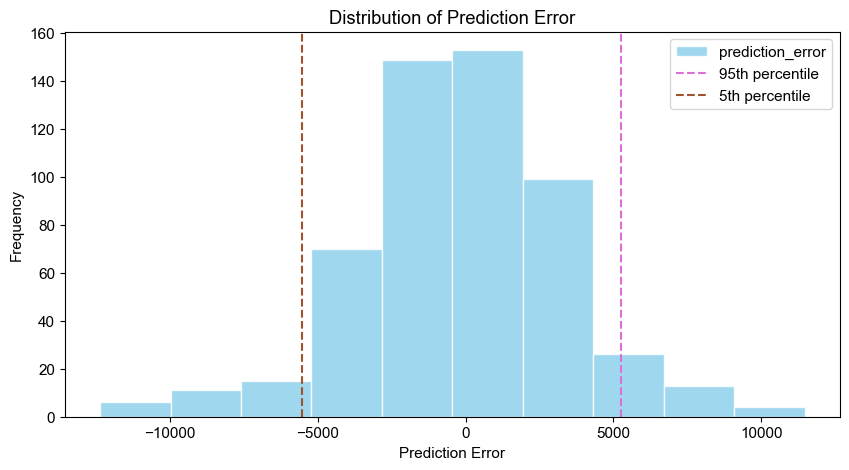

In [298]:
# plotting 

plt.rc("figure", figsize=(10, 5))
plt.rc("font", size=11)
sarima_data_reindexed.loc[test_idx, 'prediction_error'].plot(kind='hist', color='skyblue', edgecolor='w', alpha=0.8)
plt.axvline(sarima_data_reindexed.loc[test_idx, 'prediction_error'].quantile(0.95), c='orchid', 
            linestyle='--', label='95th percentile' )
plt.axvline(sarima_data_reindexed.loc[test_idx, 'prediction_error'].quantile(0.05), c='sienna', 
            linestyle='--', label='5th percentile' )
plt.title('Distribution of Prediction Error')
plt.xlabel('Prediction Error')
plt.legend()
plt.show()

**<span style='color: DarkRed'>The range of errors is high! Let's focus on dates where the prediction errors are greater than 95th percentile or less than 5th percentile.</span>**

In [299]:
# fetching extreme prediction dates

extreme_pred_error_sarima = sarima_data_reindexed.loc[test_idx,:][(sarima_data_reindexed.loc[test_idx, 'prediction_error']<sarima_data_reindexed.loc[test_idx, 'prediction_error'].quantile(0.05))
                  | (sarima_data_reindexed.loc[test_idx, 'prediction_error']>sarima_data_reindexed.loc[test_idx, 'prediction_error'].quantile(0.95))]

print('Test data with extreme predictions -')

extreme_pred_error_sarima.head(5)

Test data with extreme predictions -


,total_demand,avg_wind_speed,prcp,snowfall,temp_obs,weekend,holiday,qt_1,qt_2,qt_3,qt_4,foggy,rainy,snowy,windy,demand_log,demand_log_diff_365,mean_forecast,restored,prediction_error
2020-01-03,497.0,14.54,0.745,6.90,33.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,6.208590,-2.727840,0.130455,8663.592206,-8166.592206
2020-01-04,1257.0,5.82,0.165,3.70,27.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.136483,-1.767604,0.209204,9075.107469,-7818.107469
2020-02-04,2541.0,13.20,0.880,0.00,55.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,7.840313,-1.121181,0.106577,8673.882348,-6132.882348
2020-02-12,8660.0,10.51,0.000,0.00,51.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.066470,1.208989,-0.014885,2546.807717,6113.192283
2020-03-11,2119.0,16.11,0.490,0.45,30.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,7.658700,-1.439032,-0.014885,8802.989093,-6683.989093


<Axes: >

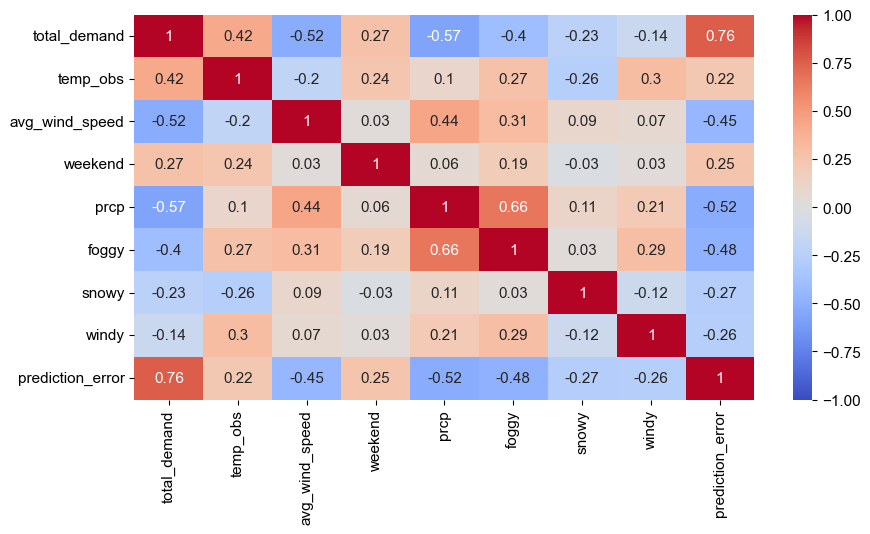

In [300]:
# let's check if there are any significant correaltions between prediction error and other features

sns.heatmap(round(extreme_pred_error_sarima[[
    'total_demand', 'temp_obs', 'avg_wind_speed', 'weekend','prcp', 'foggy', 'snowy', 'windy',
    'prediction_error']].corr(),2), annot=True, vmin=-1, vmax=1, cmap='coolwarm')


**<span style='color: DarkRed'>We can clearly see a strong correlation between prediction error and the actual demand. Let's plot a scatter plot to understand this relationship better.</span>**

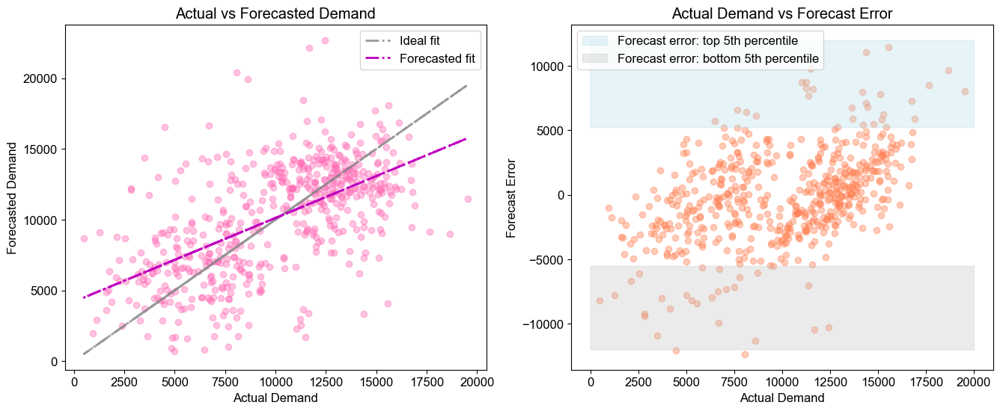

In [303]:
# plotting actual demand and prediction error

plt.rc("figure", figsize=(16, 6))
plt.rc("font", size=12)
fig, (ax1, ax2) = plt.subplots(1,2)

# plotting actual demand vs forecasted demand

ax1.scatter(x=sarima_data_reindexed.loc[test_idx, 'total_demand'], y=sarima_data_reindexed.loc[test_idx, 'restored'], c='hotpink', alpha=0.4)
ax1.set_title('Actual vs Forecasted Demand')
ax1.set_xlabel('Actual Demand')
ax1.set_ylabel('Forecasted Demand')
m, b = np.polyfit(sarima_data_reindexed.loc[test_idx, 'total_demand'], sarima_data_reindexed.loc[test_idx, 'total_demand'], 1)
ax1.plot(sarima_data_reindexed.loc[test_idx, 'total_demand'], m*sarima_data_reindexed.loc[test_idx, 'total_demand'] + b, c='gray', alpha=0.8,
         linestyle='-.', label='Ideal fit', linewidth=2)
mf, bf = np.polyfit(sarima_data_reindexed.loc[test_idx, 'total_demand'], sarima_data_reindexed.loc[test_idx, 'restored'], 1)
ax1.plot(sarima_data_reindexed.loc[test_idx, 'total_demand'], mf*sarima_data_reindexed.loc[test_idx, 'total_demand'] + bf, c='m', 
         linestyle='-.', label='Forecasted fit', linewidth=2)
ax1.legend()

# plotting actual demand vs forecast error

ax2.scatter(x=sarima_data_reindexed.loc[test_idx, 'total_demand'], y=sarima_data_reindexed.loc[test_idx, 'prediction_error'], c='coral', alpha=0.4)
ax2.set_title('Actual Demand vs Forecast Error')
ax2.set_xlabel('Actual Demand')
ax2.set_ylabel('Forecast Error')
ax2.fill_between(x=range(0,20000), y1=sarima_data_reindexed.loc[test_idx, 'prediction_error'].quantile(0.95),
                y2=12000, alpha=0.3, color='lightblue', label='Forecast error: top 5th percentile')
ax2.fill_between(x=range(0,20000), y1=sarima_data_reindexed.loc[test_idx, 'prediction_error'].quantile(0.05),
                y2=-12000, alpha=0.3, color='silver', label='Forecast error: bottom 5th percentile')
ax2.legend()

plt.show()

**This is almost the same as our last `ARIMA` model.**

**<span style='color: DarkRed'>The first plot above highlights how the ideal fit and actual fit varies. We can see that the slope of the forecasted fit is less than ideal, which tells us that the model predicts higher than actual at lower values of true demand and lower than actual at higher values of true demand.</span>**

**<span style='color: DarkRed'>This observation is emphasized by the second plot above where we look at the forecast error against actual/true demand. We can see how the most extreme 5th percentlice errors are mostly concentrated away from the middle, towards the lower and the higher ends of actual demand.</span>**

**<span style='color: DarkRed'>This implies that our model does not generalise very well to the extreme values of demand.</span>**

**Even though XGBoost model shows the same patterns, the dispersion of values is much higher in our `ARIMA` models, making them significantly worse!**

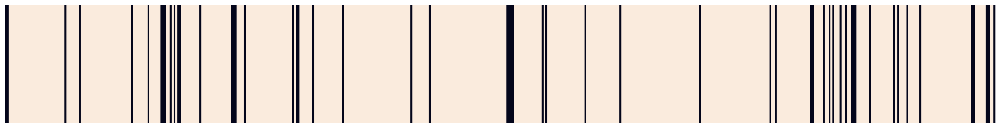

In [304]:
# let's check if there is any pattern to the dates 

full_range = pd.date_range(start=extreme_pred_error_sarima.index.min(), end=extreme_pred_error_sarima.index.max(), freq="D")
extreme_pred_error_sarima_reindexed = extreme_pred_error_sarima.reindex(full_range)

# plotting 
plt.figure(figsize=(25, 3))
sns.heatmap(extreme_pred_error_sarima_reindexed.T.isna(), cbar=False)
plt.yticks([])
plt.xticks([])
plt.show()

**We don't see any huge clustering of dates here. Let's investigate further by looking at the weekend proportion in these extreme error cases.**


Observed proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors:  0.30357142857142855

Expected proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors assuming no correlation between errors and weekends:  0.29


Text(0.5, 1.0, 'Proportion of Weekends in Test Data for Extreme Forecast Errors vs\nProportion of Weekends in All of Test Data')

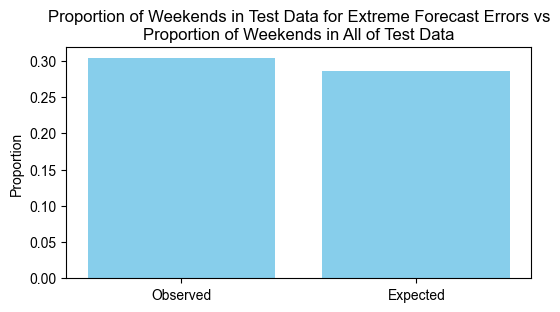

In [305]:
# calculating proportion weekends in the extreme pred error df

weekend_prop_extreme_error_sarima = extreme_pred_error_sarima.weekend.sum()/len(extreme_pred_error_sarima)
print('\nObserved proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors: ', weekend_prop_extreme_error_sarima)

# calculating expected proportion of weekend in case there is no correlation between extreme forecast errors and weekends

expected_prop_sarima = test_data_sarima.weekend.sum()/len(test_data_sarima)
print('\nExpected proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors assuming \
no correlation between errors and weekends: ', round(expected_prop_sarima,2))

plt.figure(figsize=(6,3))
plt.rc('font', family="Arial", size=10)
plt.bar(x=['Observed','Expected'], height=[weekend_prop_extreme_error_sarima, expected_prop_sarima], color='skyblue')
plt.ylabel('Proportion')
plt.title('Proportion of Weekends in Test Data for Extreme Forecast Errors vs\nProportion of Weekends in All of Test Data')


**There does not seem to be any significant pattern here.**


Observed proportion of foggy days in cases of extreme (top and bottom 5 percentile) forecast errors:  0.44642857142857145

Expected proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors assuming no correlation between errors and weekends:  0.34


Text(0.5, 1.0, 'Proportion of Foggy Days in Test Data for Extreme Forecast Errors vs\nProportion of Foggy Days in All of Test Data')

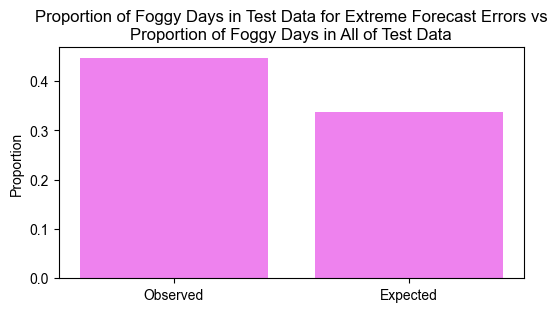

In [306]:
# calculating proportion weekends in the extreme pred error df

foggy_prop_extreme_error_sarima = extreme_pred_error_sarima.foggy.sum()/len(extreme_pred_error_sarima)
print('\nObserved proportion of foggy days in cases of extreme (top and bottom 5 percentile) forecast errors: ', foggy_prop_extreme_error_sarima)

# calculating expected proportion of weekend in case there is no correlation between extreme forecast errors and weekends

expected_prop_sarima = test_data_sarima.foggy.sum()/len(test_data_sarima)
print('\nExpected proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors assuming \
no correlation between errors and weekends: ', round(expected_prop_sarima,2))

plt.figure(figsize=(6,3))
plt.rc('font', family="Arial", size=10)
plt.bar(x=['Observed','Expected'], height=[foggy_prop_extreme_error_sarima, expected_prop_sarima], color='violet')
plt.ylabel('Proportion')
plt.title('Proportion of Foggy Days in Test Data for Extreme Forecast Errors vs\nProportion of Foggy Days in All of Test Data')


**Let's validate this with a proportions Z-test.**

In [307]:
# Getting statistic and p-value for the hypothesis test using the data above

# these are the counts of review writing in Scenario A and B
counts = [extreme_pred_error_sarima.foggy.sum(), test_data_sarima.foggy.sum()]
# these are the counts of emails sent out in Scenario A and B
number_of_obs = [len(extreme_pred_error_sarima), len(test_data_sarima)]

# test
proportions_ztest(counts, number_of_obs)

(1.638190598306671, 0.10138194025224101)

**<span style='color: DarkRed'>Based on the above test, this difference is not significant at a 95% confidence level, and so we can't really say that our model is doing especially poorly on foggy days.</span>**


Observed proportion of foggy days in cases of extreme (top and bottom 5 percentile) forecast errors:  0.5535714285714286

Expected proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors assuming no correlation between errors and weekends:  0.49


Text(0.5, 1.0, 'Proportion of PRCP Days in Test Data for Extreme Forecast Errors vs\nProportion of PRCP Days in All of Test Data')

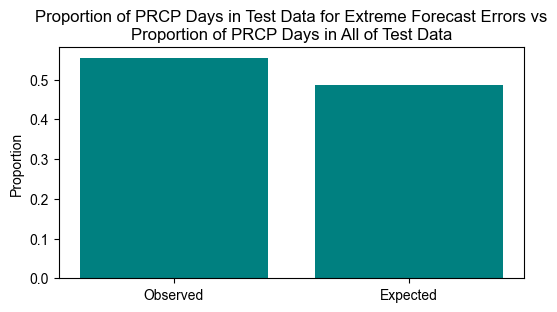

In [312]:
# calculating proportion prcp days in the extreme pred error df

prcp_prop_extreme_error_sarima = extreme_pred_error_sarima.prcp[extreme_pred_error_sarima.prcp>0].count()/len(extreme_pred_error_sarima)
print('\nObserved proportion of foggy days in cases of extreme (top and bottom 5 percentile) forecast errors: ', prcp_prop_extreme_error_sarima)

# calculating expected proportion of prcp days in case there is no correlation between extreme forecast errors and foggy days

expected_prop_sarima = test_data_sarima.prcp[test_data_sarima.prcp>0].count()/len(test_data_sarima)
print('\nExpected proportion of weekends in cases of extreme (top and bottom 5 percentile) forecast errors assuming \
no correlation between errors and weekends: ', round(expected_prop_sarima,2))

plt.figure(figsize=(6,3))
plt.rc('font', family="Arial", size=10)
plt.bar(x=['Observed','Expected'], height=[prcp_prop_extreme_error_sarima, expected_prop_sarima], color='teal')
plt.ylabel('Proportion')
plt.title('Proportion of PRCP Days in Test Data for Extreme Forecast Errors vs\nProportion of PRCP Days in All of Test Data')


**There does not seem any significant difference here.**

<a id="3"></a> 
## Results & Conclusions

**<span style='color: DarkRed'>The best model amongst the ones we've tried so far is `XGBoost` by a huge margin.</span>.**

**<span style='color: DarkRed'>It also does better than our baseline models! Below is a comparison of the RMSE and MAPE of the (best of) different models we've tried so far :</span>**

- **Baseline Model 1 (Naïve model)**
	- MAPE = 0.278 %
	- RMSE = 2710


- **Baseline Model 2 (Seasonal decomposition based)**
	- MAPE = 0.304 %
	- RMSE = 2672


- **XGBoost**

    (`colsample_bytree`: 0.55, `learning_rate`: 0.24, `max_depth`: 2, `n_estimators`: 293, `reg_alpha`: 0.3)
	- MAPE = 0.178 %
	- RMSE = 1970


- **ARIMA (1,0,7)**
    
    (data = `total_demand` differenced twice - 365,7)
	- MAPE = 0.38 %
	- RMSE = 3433


- **SARIMA (4,0,0) (0,0,1,7)**
    
    (data = log of `total_demand` differenced once - 365)
	- MAPE = 0.4 %
	- RMSE = 3451

<a id="4"></a> 
## Next Steps

**<span style='color: DarkRed'>- There is a lot of repetitive code in this notebook, create classes/functions where possible and clean this notebook up</span>**

**<span style='color: DarkRed'>- Investigate the outliers in bike rental demand data, check if the spikes in the data correspond to promotional events or any other such critical information which may help inform data preparation</span>**

**<span style='color: DarkRed'>- Investigate if seasonal decomposition can be used effectively to remove multiple seasonality (consider using [statsmodels-MSTL](https://www.statsmodels.org/dev/examples/notebooks/generated/mstl_decomposition.html)) from the data before employing (S)ARIMA</span>**

**<span style='color: DarkRed'>- Explore RNNs like LSTM to forecast demand and compare with XGBoost</span>**

**##################################### END OF REPORT #####################################**